In [2]:
#import scprep
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
#import graphtools as gt
from collections import Counter
import seaborn as sns
#import tasklogger
import sklearn
import sklearn.cluster
import sklearn.mixture
import sklearn.feature_selection
import leidenalg as louvain
import umap
from sklearn.manifold import TSNE
from sklearn.cluster import SpectralClustering
import os
import scipy as sp
from scipy.stats import gaussian_kde
from scipy.stats import pearsonr
import skimage.io as imio

import sys
sys.path.append('2D_gastruloids_v5')
import fns_plotting_scripts as fns_plot
import fns_NN
import IIF_analysis as IIF
import itertools
import matplotlib.colors as mcolors

import importlib
importlib.reload(IIF);
importlib.reload(fns_plot)

/opt/miniconda3/envs/IIF/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


<module 'fns_plotting_scripts' from '/Users/idse/repos/signaldecoding/2D_gastruloids_v5/fns_plotting_scripts.py'>

## Data & metadata

In [3]:
# LOAD DATA 
#data = pd.read_csv(dataDir + '/exp20_data_bgsub_scaled_250716.csv', index_col=0)
dataDir = '/Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses'
data = pd.read_csv(dataDir + '/exp20_data_bgsub_scaled_250509.csv', index_col=0) # '/expZ2_normalized_signals_251024.csv')
data.index.name = None
data.rename(columns={'SOX17_1': 'SOX17'}, inplace=True)
data.rename(columns={'DAPI_1': 'DAPI'}, inplace=True)

# SPECIFY METADATA

tol = {'DAPI':[1,99],'ISL1':[1,99],'TFAP2C':[1,99],'SOX17':[1,99],'TBXT':[1,99],'SOX2':[1,99],'NANOG':[1,99],'TBX6':[1,99],'SMAD23':[1,99]};
#conditions = list(np.unique(data['condition']))
conditions = ['B50','B200','B10']

#thresh = {'ISL1': 800, 'GATA3': 786, 'HAND1': 790, 'CDX2': 742, 'TFAP2C': 656, 'SOX17': 550, 'PRDM1': 600, 'NANOG': 1500, 'TBX6': 300, 'TBXT': 352, 'MIXL1': 427, 'EOMES': 225, 'SNAI1': 342, 'OCT4': 649, 'SOX2': 924, 'OTX2': 420} # 'FOXA2': 620, 
thresh = {'ISL1': 500, 'GATA3': 700, 'HAND1': 500, 'CDX2': 600, 'TFAP2C': 600, 'SOX17': 500, 'PRDM1': 650, 'NANOG': 1600, 'TBX6': 375, 'TBXT': 285, 'MIXL1': 400, 'EOMES': 200, 'SNAI1': 300, 'OCT4': 500, 'SOX2': 400, 'OTX2': 400}
gene_names = ['ISL1', 'GATA3', 'HAND1', 'CDX2', 'TFAP2C', 'SOX17', 'PRDM1', 'SNAI1', 'MIXL1', 'EOMES', 'TBXT', 'TBX6', 'OCT4', 'NANOG','SOX2', 'OTX2']# 'FOXA2',

signal_names = ['pSMAD1','ncYAP','BCat','LEF1','ncSMAD2','ncSMAD23','cytopERK','cytopAKT']
signal_names_simplified = ['SMAD1','YAP','BCat','LEF1','SMAD23','ERK','AKT','SMAD2']
feature_names = ['nucArea', 'nucVolume','nucMajorAxis', 'nucMinorAxis', 'nucCircularity', 'CircleEdgeDist','RadialDist']

meta = IIF.Metadata();
meta.xres = 0.325;
meta.yres = 0.325;
meta.channels = signal_names+gene_names;
meta.conditions = conditions;

In [4]:
# remove a few rows of bad data, reindex
# NaN/negative rows filtered and reindexed first; junk (>RAW_CUTOFF) cells excluded
# afterward WITHOUT reindexing again -- existing prediction CSVs are indexed by the cell
# IDs assigned above, and matching happens by index value (pd.read_csv(index_col=0),
# .loc[...]), not row position. Reindexing after the junk-exclusion step would silently
# misalign every already-computed sweep result for any cell after a removed one.

mask = data[signal_names + gene_names].isna() | (data[signal_names + gene_names] < 0)
mask = mask.any(axis=1)
print(np.sum(mask))
data = data[~mask]
data.index = range(0, len(data))

RAW_CUTOFF = 10**4   # laser power is kept low enough that legitimate intensities shouldn't
                      # reach this range -- anything above is junk/artifact that slipped
                      # through segmentation. Catches < 10 cells, not a chunk of any gene's
                      # real positive population.
junk_mask = (data[gene_names] > RAW_CUTOFF).any(axis=1)
print(f'{junk_mask.sum()} junk cells removed')
data = data[~junk_mask]


9
7 junk cells removed


In [5]:
# CONVERT DATA INTO EXPERIMENT AND COLONY OBJECTS
col = dict();
for colID in np.unique(data['Colony']):
    col[colID] = IIF.Colony(data[data['Colony']==colID], colID, meta, features=feature_names, nominalRadius=350);
    col[colID].calcRadialProfiles(cellsPerBin=100, overlap=0, dr=8)
    col[colID].calcPosError(sigma=1)

exp = IIF.MPexperiment(col, meta);
exp.calcRadialProfiles(cellsPerBin=100, overlap=0)

B50, Nbins = 304
B200, Nbins = 288
B10, Nbins = 252


loading /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/230112_6i9rd_exp20_RD3_ISL1_TBXT_pSMAD1/MIP/stitched_MIP_p0001_w0002_t0000.jpg
loading /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/230111_6i9rd_exp20_RD2_GATA3_OTX2_LEF1/MIP/stitched_MIP_p0001_w0002_t0000.jpg
loading /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/230114_6i9rd_exp20_RD5_TFAP2C_NANOG_pERKbad/MIP/stitched_MIP_p0001_w0002_t0000.jpg


Text(0.5, 1.0, 'Colony 2: TBXT, OTX2, NANOG')

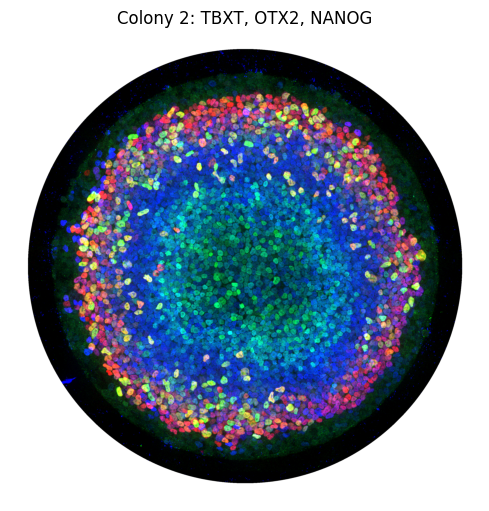

In [5]:
# Render a pseudocolored RGB overlay of raw microscopy images 

colID = 2   # matches data_cond['Colony'] == 5
stains = ['TBXT','OTX2','NANOG']

fig, ax = plt.subplots(1, 1, figsize=(5, 5), constrained_layout=True)

RGBbase, image_meta = IIF.makeRGBbase(col, colID, stains, dataDir, outer_margin=100, crop_margin=140,
                            center_x_margin=0, center_y_margin=0, rdStr='RD')

ax.imshow(RGBbase)
ax.axis('off')
ax.set_title(f'Colony {colID}: {", ".join(stains)}')


## Discretization

In [ ]:
# RELOAD POSTERIOR-DERIVED THRESHOLDS 
# can skip rest of this section

threshold_summary_df_20 = pd.read_csv(dataDir + '/FigS2/marker_threshold_parameters.csv', index_col='marker')
thresh_posterior = threshold_summary_df_20['threshold_posterior'].to_dict()

In [28]:
# MODEL BACKGROUND (NEGATIVE) AND FOREGROUND (POSITIVE) POPULATIONS PER MARKER
FOREGROUND_MARKERS = {'OCT4', 'SOX2', 'NANOG'}
BANDWIDTH_SCALE = 1

data_cond = data[data['condition'] == 'B50']
fits = IIF.fit_marker_distributions(data_cond, gene_names, foreground_markers=FOREGROUND_MARKERS,
                                     bandwidth_scale=BANDWIDTH_SCALE)


In [29]:
# CALCULATE AUTOMATED THRESHOLDS: BACKGROUND-POSTERIOR-CROSSING, PER MARKER
# "Posterior" = P(cell belongs to background or foreground population | observed intensity x),
# via Bayes' rule: P(Z=population | X=x) = [population's weighted Gaussian density at x] / P(X=x).
#  - equal_posterior_crossing assumes P(X=x) is exactly the two-component mixture (bg(x)+fg(x)),
#    so P(bg|x)=P(fg|x) reduces to simply bg(x)=fg(x) -- an exact 50/50 posterior crossing under
#    that two-component assumption.
#  - posterior_crossing (single-population fallback/exception cases) has no second component to
#    pair against, so it uses the real empirical KDE density as P(X=x) instead -- P(population|x)
#    = [that population's weighted Gaussian] / [everything actually observed at x], which is an
#    approximation when the data has structure beyond the two idealized Gaussians (e.g.
#    intermediate/transitioning cells).
#
# Default rule: threshold = the point where P(foreground|x) = P(background|x).
#
# Fallback, when only one population is detected (no background or no foreground fit -- nothing
# to cross against): threshold = the point where that single population's posterior crosses
# FOREGROUND_FALLBACK_CUTOFF or BACKGROUND_FALLBACK_CUTOFF. Less conservative than the NANOG
# exception below, since there's no specific biological reason to be strict here -- it's just
# the best available fallback when there's nothing to compare against.
#
# Exception: for NANOG (STRICT_FOREGROUND_CUTOFF_MARKERS) specifically, even when both
# populations are detected, we deliberately use a foreground-cutoff rule instead of P(fg|x)=P(bg|x),
# with its own stricter cutoff (STRICT_FOREGROUND_CUTOFF) -- we want NANOG's "positive" population
# to strictly include only genuinely positive cells, excluding intermediate/transitioning ones,
# for biological reasons specific to NANOG.

STRICT_FOREGROUND_CUTOFF_MARKERS = {'NANOG'}
STRICT_FOREGROUND_CUTOFF = 0.9
FOREGROUND_FALLBACK_CUTOFF = 0.5  # more likely to be foreground than not (alternative is usually transitioning)
BACKGROUND_FALLBACK_CUTOFF = 0.05  # want to be confidently above background

thresh_posterior, threshold_records = IIF.fit_posterior_thresholds(
    fits, gene_names, thresh_manual=thresh,
    strict_foreground_markers=STRICT_FOREGROUND_CUTOFF_MARKERS,
    strict_foreground_cutoff=STRICT_FOREGROUND_CUTOFF,
    foreground_fallback_cutoff=FOREGROUND_FALLBACK_CUTOFF,
    background_fallback_cutoff=BACKGROUND_FALLBACK_CUTOFF)

missing = [mk for mk, t in thresh_posterior.items() if np.isnan(t)]
if missing:
    print(f"WARNING: no posterior crossing found within the observed range for: {missing}")

threshold_summary_df = pd.DataFrame(threshold_records).set_index('marker')
threshold_summary_df.to_csv(dataDir + '/FigS2/marker_threshold_parameters.csv')
threshold_summary_df.round(3)

,offset,m_bg,sigma_bg,w_bg,m_fg,sigma_fg,w_fg,n_modes,mode_suspicious,method,x_cross_log,threshold_posterior,threshold_manual
marker,,,,,,,,,,,,,
ISL1,0.0,1.919,0.076,0.735,3.332,0.111,0.086,2,False,equal_posterior_crossing,2.508,322.400,500
GATA3,0.0,2.272,0.078,0.749,3.208,0.161,0.088,2,False,equal_posterior_crossing,2.616,412.991,700
HAND1,0.0,2.097,0.069,0.807,3.128,0.152,0.076,2,False,equal_posterior_crossing,2.449,281.117,500
CDX2,0.0,2.240,0.069,0.598,2.511,0.185,0.554,2,False,equal_posterior_crossing,2.356,226.823,600
TFAP2C,0.0,2.240,0.099,0.585,2.985,0.189,0.155,2,False,equal_posterior_crossing,2.543,349.169,600
SOX17,0.0,2.202,0.075,0.800,3.426,0.138,0.021,6,False,equal_posterior_crossing,2.668,465.667,500
PRDM1,0.0,2.560,0.076,1.006,3.191,0.075,0.013,4,False,equal_posterior_crossing,2.917,825.323,650
SNAI1,0.0,2.203,0.102,0.690,2.939,0.277,0.141,2,False,equal_posterior_crossing,2.488,307.364,300
MIXL1,0.0,2.367,0.091,0.648,2.908,0.245,0.325,2,False,equal_posterior_crossing,2.574,374.777,400


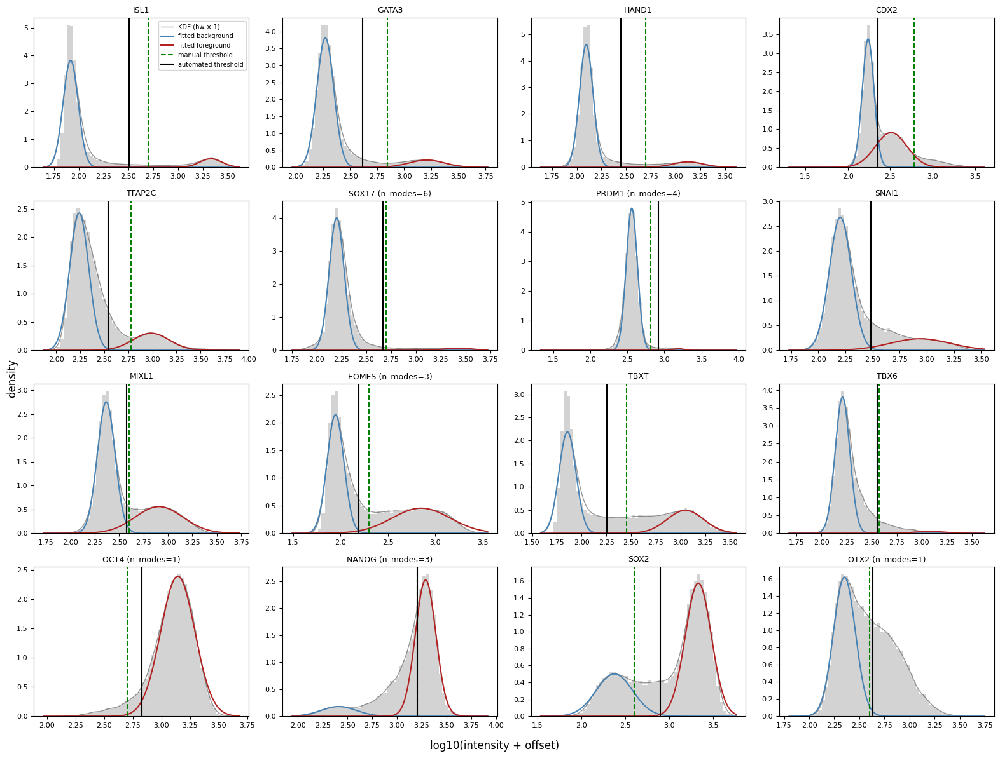

In [8]:
# PLOT BACKGROUND + FOREGROUND MODEL AND THRESHOLDS, PER MARKER
# Per marker: raw histogram + KDE, the fitted background/foreground Gaussians overlaid on
# top (scaled to match the KDE's own peak height, since the Gaussians are fit to the KDE
# shape, not to be a normalized density in their own right), and the manual vs. automated
# threshold for comparison.

from scipy.stats import norm

# plot options
plot_modes = False        # faint vertical lines at every detected KDE mode, not just m/m_high

n_genes = len(gene_names)
n_cols = 4
n_rows = int(np.ceil(n_genes / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows))
axes = axes.ravel()

for i, marker in enumerate(gene_names):

    fit = fits[marker]
    x_grid = fit['grid']

    # "mode suspicious" flags a background mode sitting right at the low edge of the data --
    # too few points below it to trust it as a real peak rather than an edge artifact
    frac_below_mode = np.mean(fit['log_vals'] < fit['m']) if not np.isnan(fit['m']) else np.nan
    mode_suspicious = frac_below_mode < 0.02

    ax = axes[i]
    ax.hist(fit['log_vals'], bins=60, density=True, color='lightgray', edgecolor='none')
    ax.plot(x_grid, fit['density'], color='dimgray', linewidth=1, alpha=0.7,
            label=f'KDE (bw × {BANDWIDTH_SCALE:.2g})')

    # fitted background/foreground Gaussians, each rescaled so its own peak matches the KDE's
    # height at that point -- makes them visually comparable to the KDE even though the
    # Gaussian's raw peak height (from its fitted sigma) generally won't match the KDE's
    if not np.isnan(fit['sigma_hwhm']):
        bg_peak_height = fit['density'][np.argmin(np.abs(x_grid - fit['m']))]
        bg_pdf = norm.pdf(x_grid, fit['m'], fit['sigma_hwhm'])
        bg_pdf_scaled = bg_pdf * (bg_peak_height / bg_pdf.max())
        ax.plot(x_grid, bg_pdf_scaled, color='steelblue', label='fitted background')

    if not np.isnan(fit['sigma_hwhm_high']):
        fg_peak_height = fit['density'][np.argmin(np.abs(x_grid - fit['m_high']))]
        fg_pdf = norm.pdf(x_grid, fit['m_high'], fit['sigma_hwhm_high'])
        fg_pdf_scaled = fg_pdf * (fg_peak_height / fg_pdf.max())
        ax.plot(x_grid, fg_pdf_scaled, color='firebrick', label='fitted foreground')

    if plot_modes:
        for mode_x in fit['all_modes']:
            ax.axvline(mode_x, color='steelblue', linewidth=0.8, alpha=0.3)

    manual_log = np.log10(thresh[marker] + fit['offset'])
    ax.axvline(manual_log, color='green', linestyle='--', linewidth=1.5, label='manual threshold')

    # thresh_posterior comes from the threshold-calculation cell above -- may be NaN if no
    # crossing was found within the observed range for this marker
    posterior_thresh = thresh_posterior[marker]
    if not np.isnan(posterior_thresh):
        posterior_log = np.log10(posterior_thresh + fit['offset'])
        ax.axvline(posterior_log, color='k', linestyle='-', linewidth=1.5, label='automated threshold')

    # flag markers worth a second look: an unusual mode count (not the typical single
    # background + single foreground), or a background mode sitting suspiciously close to
    # the low edge of the data
    flags = []
    if fit['n_modes'] != 2:
        flags.append(f'n_modes={fit["n_modes"]}')
    if mode_suspicious:
        flags.append('mode suspicious')
    title = marker + (' (' + ', '.join(flags) + ')' if flags else '')
    ax.set_title(title, fontsize=9)
    ax.tick_params(labelsize=8)

for ax in axes[n_genes:]:
    ax.axis('off')

axes[0].legend(fontsize=7, loc='upper right')
fig.supxlabel('log10(intensity + offset)')
fig.supylabel('density')
plt.tight_layout()
plt.savefig(dataDir + '/FigS2/marker_background_HWHM_thresholds.png')


## Optimization

### HIDDEN_DIM, N_LAYERS, LATENT_DIM for all measured signals

In [ ]:
# ============================================================
# RUN VIB SWEEP OVER HIDDEN_DIM, N_LAYERS, LATENT_DIM
# Leave-one-colony-out CV on B50 for each (Nhid, Nlay, Ldim) config.
# Feeds the "LOAD RUNS FOR HIDDEN_DIM..." cell below.
# ============================================================

recompute = False   # set True to force retraining even if a run's CSV already exists

data_b50 = data[data['condition'] == 'B50']

for Ldim in [1, 2, 3]:
    for Nlay in range(1, 5):
        for Nhid in [1, 2, 4, 8, 16, 24, 32, 48, 64, 128]:
            hyperparam = {'HIDDEN_DIM': Nhid, 'N_LAYERS': Nlay, 'LATENT_DIM': Ldim}
            N_run = 10 if Nhid in [1, 2] else 3
            out_prefix = f'251115_VIB_{len(signal_names)}D_selfB50_Nhid{Nhid}_Nlay{Nlay}_Ldim{Ldim}'
            IIF.run_vib_self(
                data_b50, signal_names, gene_names, hyperparam, N_run=N_run,
                out_dir=dataDir + '/VIB_sweep', out_prefix=out_prefix, recompute=recompute,
                label=f'Nhid={Nhid} Nlay={Nlay} Ldim={Ldim}')

[Nhid=1 Nlay=1 Ldim=1] Run 0/10 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid1_Nlay1_Ldim1_run0.csv
[Nhid=1 Nlay=1 Ldim=1] Run 1/10 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid1_Nlay1_Ldim1_run1.csv
[Nhid=1 Nlay=1 Ldim=1] Run 2/10 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid1_Nlay1_Ldim1_run2.csv
[Nhid=1 Nlay=1 Ldim=1] Run 3/10 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid1_Nlay1_Ldim1_run3.csv
[Nhid=1 Nlay=1 Ldim=1] Run 4/10 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid1_Nlay1_Ldim1_run4.csv
[Nhid=1 Nlay=1 Ldim=1] Run 5/10 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_d

In [ ]:
# LOAD RUNS FOR HIDDEN_DIM, N_LAYERS, LATENT_DIM OPTIMIZATION FROM CSV
# uses the same function with recompute is false

data_b50 = data[data['condition'] == 'B50']

pred_subs = dict()
for Ldim in [1, 2, 3]:
    for Nlay in range(1, 5):
        for Nhid in [1, 2, 4, 8, 16, 24, 32, 48, 64, 128]:
            hyperparam = {'HIDDEN_DIM': Nhid, 'N_LAYERS': Nlay, 'LATENT_DIM': Ldim}
            N_run = 10 if Nhid in [1, 2] else 3
            out_prefix = f'251115_VIB_{len(signal_names)}D_selfB50_Nhid{Nhid}_Nlay{Nlay}_Ldim{Ldim}'
            pred_subs[(Nhid, Nlay, Ldim)] = IIF.load_vib_self(
                data_b50, signal_names, gene_names, hyperparam, N_run=N_run,
                out_dir=dataDir + '/VIB_sweep', out_prefix=out_prefix)

Run 0/10 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid1_Nlay1_Ldim1_run0.csv
Run 1/10 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid1_Nlay1_Ldim1_run1.csv
Run 2/10 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid1_Nlay1_Ldim1_run2.csv
Run 3/10 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid1_Nlay1_Ldim1_run3.csv
Run 4/10 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid1_Nlay1_Ldim1_run4.csv
Run 5/10 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid1_Nlay1_Ldim1_run5.csv
Run 6/10 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/25

In [ ]:
# ============================================================
# RUN VIB SWEEP OVER BETA (KL WEIGHT), Nhid FIXED AT 32
# beta log-spaced from ~0 up to 10x the default (0.01 -> 0.1)
# ============================================================

recompute = False   # set True to force retraining even if a run's CSV already exists

data_b50 = data[data['condition'] == 'B50']

beta_values = np.concatenate(([0.0], np.logspace(-4, -1, 7)))
for Ldim in [1, 2, 3]:
    for Nlay in range(1, 5):
        for beta in beta_values:
            hyperparam = {'HIDDEN_DIM': 32, 'N_LAYERS': Nlay, 'LATENT_DIM': Ldim, 'BETA': beta}
            out_prefix = f'251115_VIB_{len(signal_names)}D_selfB50_Nhid32_Nlay{Nlay}_Ldim{Ldim}_beta{beta:.5f}'
            IIF.run_vib_self(data_b50, signal_names, gene_names, hyperparam, N_run=3,
                out_dir=dataDir + '/VIB_sweep', out_prefix=out_prefix, recompute=recompute)

Run 0/3 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00000_run0.csv
Run 1/3 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00000_run1.csv
Run 2/3 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00000_run2.csv
Run 0/3 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00010_run0.csv
Run 1/3 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00010_run1.csv
Run 2/3 -- already exists, skipping load: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00010_run2.cs

In [ ]:
# LOAD BETA SWEEP RUNS FROM CSV

data_b50 = data[data['condition'] == 'B50']

pred_subs_beta = dict()
beta_values = np.concatenate(([0.0], np.logspace(-4, -1, 7)))
for Ldim in [1, 2, 3]:
    for Nlay in range(1, 5):
        for beta in beta_values:
            hyperparam = {'HIDDEN_DIM': 32, 'N_LAYERS': Nlay, 'LATENT_DIM': Ldim, 'BETA': beta}
            out_prefix = f'251115_VIB_{len(signal_names)}D_selfB50_Nhid32_Nlay{Nlay}_Ldim{Ldim}_beta{beta:.5f}'
            pred_subs_beta[(Nlay, Ldim, beta)] = IIF.load_vib_self(
                data_b50, signal_names, gene_names, hyperparam, N_run=3,
                out_dir=dataDir + '/VIB_sweep', out_prefix=out_prefix)

Run 0/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00000_run0.csv
Run 1/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00000_run1.csv
Run 2/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00000_run2.csv
Run 0/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00010_run0.csv
Run 1/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00010_run1.csv
Run 2/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_sweep/251115_VIB_8D_B50_Nhid32_Nlay1_Ldim1_beta0.00010_run2.csv
Run 0/3 -- already exists, loading

In [13]:
# COMPUTE MSE FOR Nhid/Nlay/Ldim SWEEP

cond = 'B50'
condidx = data['condition']==cond
data_cond_idx = data[condidx].index
data_cond_z = data[condidx][gene_names].apply(sp.stats.zscore, axis=0)

idx = [1,2,4,8,16, 24, 32, 48, 64, 128]
cols = range(1,5)

mse_means = {}
for Ldim in [1,2,3]:
    mse_grid = pd.DataFrame(np.zeros((len(idx), len(cols))), idx, cols)
    for Nlay in cols:
        for Nhid in idx:
            N_run = 10 if Nhid in [1, 2] else 3
            mse_runs = []
            for run in range(N_run):
                predi = pred_subs[(Nhid, Nlay, Ldim)][run].loc[data_cond_idx, gene_names]
                predi_z = predi.apply(sp.stats.zscore, axis=0)
                se = (data_cond_z - predi_z)**2
                mse_runs.append(se.mean().mean())
            mse_grid.loc[Nhid, Nlay] = np.mean(mse_runs)
    mse_means[Ldim] = mse_grid



In [14]:
# COMPUTE MSE FOR BETA SWEEP (Nhid=32 fixed)

cond = 'B50'
condidx = data['condition']==cond
data_cond_idx = data[condidx].index
data_cond_z = data[condidx][gene_names].apply(sp.stats.zscore, axis=0)

cols = range(1,5)   # N_LAYERS

mse_means_beta = {}
for Ldim in [1,2,3]:

    mse_opt = {}
    for run in range(0,N_run):
        mse_opt[run] = pd.DataFrame( np.zeros((len(beta_values), len(cols))), beta_values, cols )
        for Nlay in cols:
            for beta in beta_values:
                predi = pred_subs_beta[(Nlay, Ldim, beta)][run].loc[data_cond_idx, gene_names]
                predi_z = predi.apply(sp.stats.zscore, axis=0)
                se = (data_cond_z - predi_z)**2
                mse = se.mean().mean()
                mse_opt[run].loc[beta,Nlay] = mse

    mse_means_beta[Ldim] = pd.DataFrame(
        np.stack([df.values for df in mse_opt.values()]).mean(axis=0),
        index=mse_opt[0].index,
        columns=mse_opt[0].columns
    )

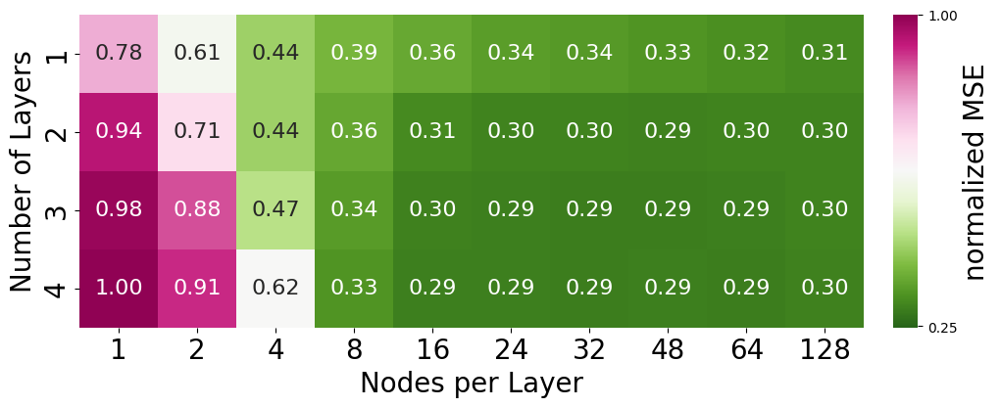

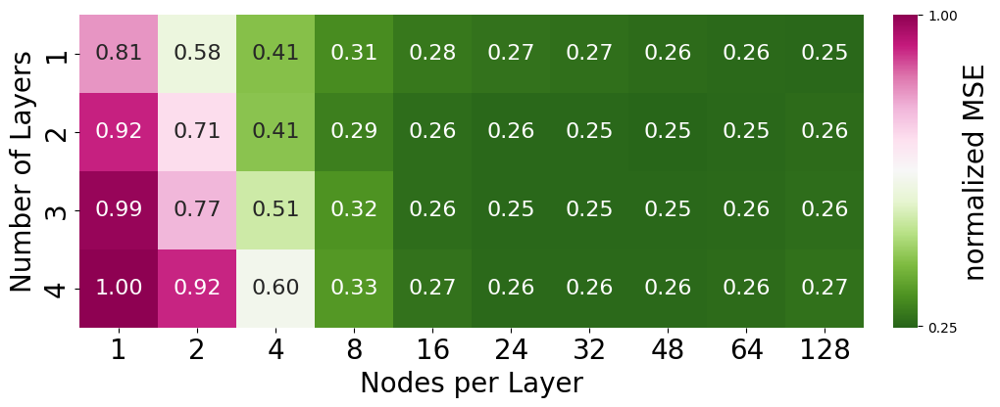

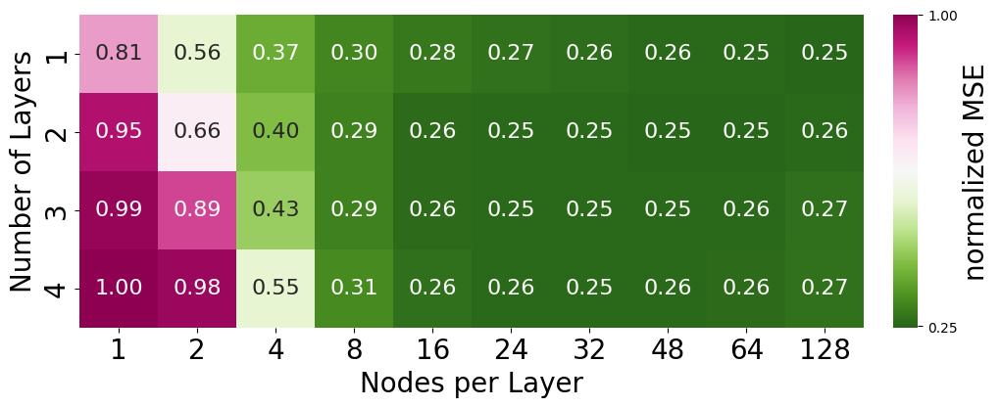

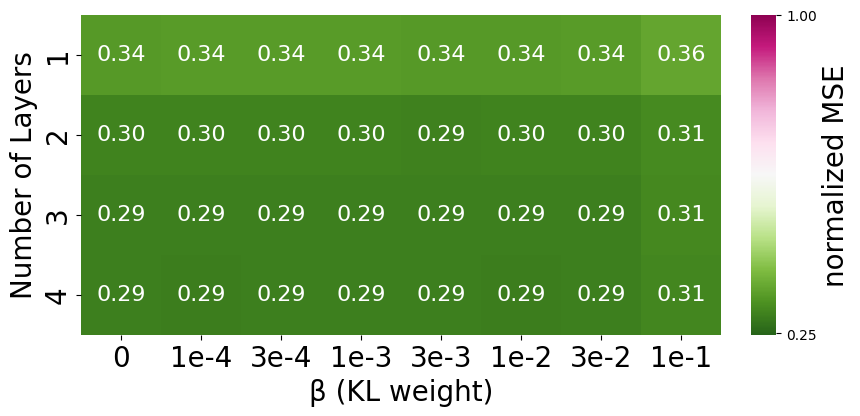

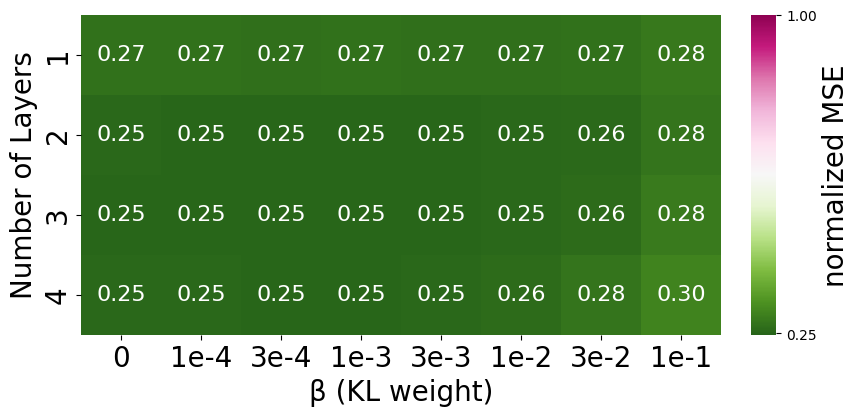

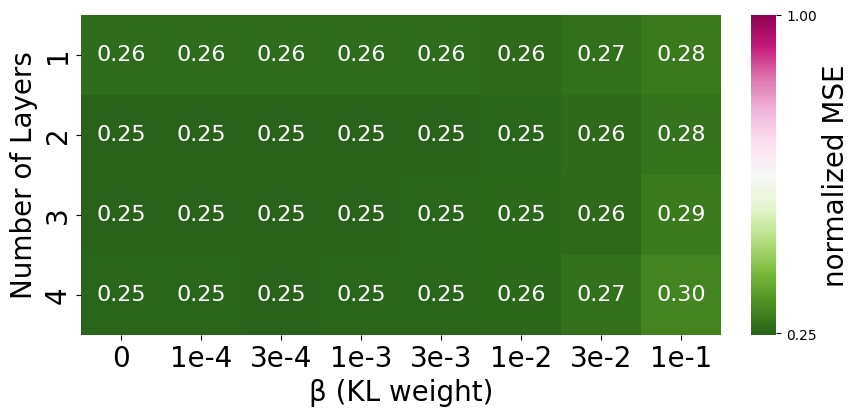

In [15]:
# MAKE HEATMAPS -- Nhid/Nlay/Ldim SWEEP AND BETA SWEEP, SHARED NORMALIZATION

os.makedirs(dataDir + '/FigS2', exist_ok=True)

cmap = plt.cm.PiYG.reversed()
cols = range(1,5)

# one scale shared across both sweeps and all Ldim panels
global_max = max(
    max(m.max().max() for m in mse_means.values()),
    max(m.max().max() for m in mse_means_beta.values()),
)
vmin_shared = min(
    min(m.min().min() for m in mse_means.values()),
    min(m.min().min() for m in mse_means_beta.values()),
) / global_max

mse_max = {Ldim: global_max for Ldim in mse_means}  # mse_max[2] used later for VIB/linearreg/nonlin comparison

# Margins are fixed in absolute inches (not auto-fit via tight_layout, which reflows
# differently depending on total figure width) so cell size AND everything around the
# cells -- labels, ticks, colorbar -- render identically between the two sweeps, whatever
# their column counts happen to be.
CELL_SIZE = 0.8       # inches per cell (square, so this sets both width and height)
LEFT_MARGIN = 1.0     # y-axis label + ticks
RIGHT_MARGIN = 1.7     # gap + colorbar + its label
BOTTOM_MARGIN = 1.0   # x-axis label + ticks
TOP_MARGIN = 0.3
CBAR_WIDTH = 0.25
CBAR_GAP = 0.3

def plot_score_heatmap(score_mean_raw, xticklabels, xlabel, fname, xtick_rotation=0,
                        normalize_by=None, vmin=0, vmax=1, cbar_label='score'):
    score_mean = score_mean_raw / normalize_by if normalize_by is not None else score_mean_raw
    n_cols = len(xticklabels)
    n_rows = len(cols)

    fig_width = LEFT_MARGIN + CELL_SIZE * n_cols + RIGHT_MARGIN
    fig_height = BOTTOM_MARGIN + CELL_SIZE * n_rows + TOP_MARGIN
    fig = plt.figure(figsize=(fig_width, fig_height))

    ax = fig.add_axes([LEFT_MARGIN / fig_width, BOTTOM_MARGIN / fig_height,
                        CELL_SIZE * n_cols / fig_width, CELL_SIZE * n_rows / fig_height])
    cax = fig.add_axes([(LEFT_MARGIN + CELL_SIZE * n_cols + CBAR_GAP) / fig_width, BOTTOM_MARGIN / fig_height,
                         CBAR_WIDTH / fig_width, CELL_SIZE * n_rows / fig_height])

    heatmap = sns.heatmap(score_mean.T,
                annot=True,
                fmt='.2f',
                cmap=cmap,
                xticklabels=xticklabels,
                yticklabels=cols,
                square=True,
                annot_kws={'fontsize': 16},
                vmin=vmin,
                vmax=vmax,
                ax=ax, cbar_ax=cax)
    fs = 20
    cax.set_ylabel(cbar_label, fontsize=fs)
    cax.tick_params(labelsize=10)
    cax.set_yticks([round(vmin, 2), vmax])
    ax.set_ylabel('Number of Layers', fontsize=fs)
    ax.set_xlabel(xlabel, fontsize=fs)
    if xtick_rotation:
        ax.tick_params(axis='x', labelsize=fs, rotation=xtick_rotation)
        for lbl in ax.get_xticklabels():
            lbl.set_ha('right')
    else:
        ax.tick_params(axis='x', labelsize=fs)
    ax.tick_params(axis='y', labelsize=fs)
    plt.savefig(fname)

idx = [1,2,4,8,16, 24, 32, 48, 64, 128]
for Ldim in [1,2,3]:
    plot_score_heatmap(
        mse_means[Ldim], idx, 'Nodes per Layer',
        dataDir + '/FigS2/B50_hyperparam_optimization_MSE_Ldim'+str(Ldim)+'.png',
        normalize_by=global_max, vmin=vmin_shared, vmax=1, cbar_label='normalized MSE'
    )

def format_beta(b):
    if b == 0:
        return '0'
    mantissa, exp = f'{b:.0e}'.split('e')
    return f'{mantissa}e{int(exp)}'

for Ldim in [1,2,3]:
    plot_score_heatmap(
        mse_means_beta[Ldim], [format_beta(b) for b in beta_values], 'β (KL weight)',
        dataDir + '/FigS2/B50_beta_optimization_MSE_Ldim'+str(Ldim)+'.png',
        xtick_rotation=0, normalize_by=global_max, vmin=vmin_shared, vmax=1, cbar_label='normalized MSE'
    )


In [16]:
# CALCULATE PERFORMANCE
feat_names = signal_names

# extra step to make this robust to changes in filtering without having to recalculate everything
pred_subs_full_coverage = {
    k: {'avg': v['avg'].loc[data.index]}
    for k, v in pred_subs.items() if isinstance(k, tuple)
}
performances, _ = IIF.calcPerformance(data, pred_subs_full_coverage, thresh, gene_names)

for cond in conditions:
    performances[cond].to_csv(dataDir + '/Fig2/performance_opt_VIB_' + str(len(feat_names)) + 'D_'+cond+'.csv')

### Compare with other regression methods

In [17]:
# COMPARISON WITH OTHER METHODS (RF, linear regression, MLP w/ and w/o bottleneck, PCR, PLS, RRR, GAM)

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from pygam import LinearGAM

feat_names = signal_names
data_cond = data[data['condition']=='B50']
colony_idx = np.unique(data_cond['Colony'])

Nhid, Nlay, Ldim = 32, 2, 2   # match the VIB config used elsewhere ((32,2,2))
N_FEATURES = len(feat_names)  # for the "full-rank" PCR/PLS cases -- with all components kept,
                                # these should recover ~plain linear regression, as a sanity check

class ReducedRankRegression:
    # Classical (Anderson 1951) reduced-rank regression under an identity weighting: fit
    # full-rank OLS, then truncate its coefficient matrix to `rank` via SVD. Equivalent to
    # regressing the targets on the top-`rank` canonical directions between X and Y.
    def __init__(self, rank):
        self.rank = rank

    def fit(self, X, Y):
        X = np.asarray(X)
        Y = np.asarray(Y)
        B, *_ = np.linalg.lstsq(X, Y, rcond=None)   # no intercept -- X, Y are already centered upstream
        U, S, Vt = np.linalg.svd(B, full_matrices=False)
        k = self.rank
        self.B_ = U[:, :k] @ np.diag(S[:k]) @ Vt[:k, :]
        return self

    def predict(self, X):
        return np.asarray(X) @ self.B_

class MultiOutputGAM:
    # pygam's LinearGAM is single-output, so this fits one independent GAM per target
    # column, exposing the same fit/predict interface as the multi-output sklearn models.
    def fit(self, X, Y):
        X = np.asarray(X)
        Y = np.asarray(Y)
        self.models_ = [LinearGAM().fit(X, Y[:, j]) for j in range(Y.shape[1])]
        return self

    def predict(self, X):
        X = np.asarray(X)
        return np.column_stack([gam.predict(X) for gam in self.models_])

model_specs = {
    'randomforest': {
        'make_model': lambda: RandomForestRegressor(n_estimators=100, max_depth=None, n_jobs=-1, random_state=42),
        'scale_features': True,
        'scale_target': False,
    },
    'linearreg': {
        'make_model': lambda: LinearRegression(),
        'scale_features': False,
        'scale_target': False,
    },
    'mlp_bottleneck': {
        # encoder -> bottleneck -> decoder, mirrors FlexibleVIB's shape (consistency check vs VIB beta=0)
        'make_model': lambda: MLPRegressor(hidden_layer_sizes=(Nhid,)*Nlay + (Ldim,) + (Nhid,)*Nlay, max_iter=800, random_state=42),
        'scale_features': True,
        'scale_target': True,
    },
    'mlp_nobottleneck': {
        'make_model': lambda: MLPRegressor(hidden_layer_sizes=(Nhid,)*Nlay, max_iter=800, random_state=42),
        'scale_features': True,
        'scale_target': True,
    },
    'pcr_k2': {
        'make_model': lambda: Pipeline([('pca', PCA(n_components=2)), ('linreg', LinearRegression())]),
        'scale_features': True,
        'scale_target': False,
    },
    'pcr_full': {
        'make_model': lambda: Pipeline([('pca', PCA(n_components=N_FEATURES)), ('linreg', LinearRegression())]),
        'scale_features': True,
        'scale_target': False,
    },
    'pls_k2': {
        'make_model': lambda: PLSRegression(n_components=2, scale=False),
        'scale_features': True,
        'scale_target': True,
    },
    'pls_full': {
        'make_model': lambda: PLSRegression(n_components=N_FEATURES, scale=False),
        'scale_features': True,
        'scale_target': True,
    },
    'rrr_k2': {
        'make_model': lambda: ReducedRankRegression(rank=2),
        'scale_features': True,
        'scale_target': True,
    },
    'gam': {
        'make_model': lambda: MultiOutputGAM(),
        'scale_features': True,
        'scale_target': True,
    },
}

pred_dfs = {name: data_cond.copy() for name in model_specs}

for test_colony in colony_idx:

    print('B50 col: ' + str(test_colony))

    train_colonies = np.setdiff1d(colony_idx, test_colony)
    data_test = data_cond[data_cond['Colony'].isin([test_colony])]
    data_train = data_cond[data_cond['Colony'].isin(train_colonies)]

    feat_train = data_train[feat_names]
    feat_test = data_test[feat_names]
    tar_train = data_train[gene_names]

    for name, spec in model_specs.items():

        if spec['scale_features']:
            scaler_X = StandardScaler()
            X_train = scaler_X.fit_transform(feat_train)
            X_test = scaler_X.transform(feat_test)
        else:
            X_train = feat_train
            X_test = feat_test

        if spec['scale_target']:
            scaler_Y = StandardScaler()
            Y_train = scaler_Y.fit_transform(tar_train)
        else:
            Y_train = tar_train

        model = spec['make_model']()
        model.fit(X_train, Y_train)
        tar_predict = model.predict(X_test)

        if spec['scale_target']:
            tar_predict = scaler_Y.inverse_transform(tar_predict)

        tar_predict = pd.DataFrame(tar_predict, columns=tar_train.columns, index=feat_test.index)
        pred_dfs[name].loc[tar_predict.index, tar_predict.columns] = tar_predict

pred_subs_tmp = {}
for name, pred_df in pred_dfs.items():
    pred_df.to_csv(dataDir + f'/251115_{name}_' + str(len(feat_names)) + 'D_B50.csv')
    pred_subs[name] = {'avg': pred_df}
    pred_subs_tmp[name] = {'avg': pred_df}

performances_others, _ = IIF.calcPerformance(data[data['condition']=='B50'], pred_subs_tmp, thresh, gene_names)


B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6


In [18]:
# calculate MSE for different methods

data_cond_z = data_cond[gene_names].apply(sp.stats.zscore, axis=0)

vib_beta0_runs = [pred_subs_beta[(2, 2, 0.0)][it].loc[data_cond.index, gene_names] for it in range(N_run)]
vib_beta0_avg = pd.concat(vib_beta0_runs).groupby(level=0).mean()

mse = {}
mse_std = {}          # std across colony folds -- used for the error bars in the comparison plot
mse_long_records = []  # one row per (model, fold, gene) -- for inspecting individual fold values

def add_fold_records(k, se):
    per_colony_mse = se.groupby(data_cond['Colony']).mean()   # colonies x genes
    long = per_colony_mse.reset_index().melt(id_vars='Colony', var_name='gene', value_name='mse')
    long['model'] = [k] * len(long)
    long = long.rename(columns={'Colony': 'fold'})
    mse_long_records.append(long[['model', 'fold', 'gene', 'mse']])
    return per_colony_mse

for k in [(32,2,2), 'linearreg', 'randomforest', 'mlp_bottleneck', 'mlp_nobottleneck',
          'pcr_k2', 'pcr_full', 'pls_k2', 'pls_full', 'rrr_k2','gam']:
    print(k)
    predi = pred_subs[k]['avg'].loc[data_cond.index, gene_names]
    predi_z = predi.apply(sp.stats.zscore, axis=0)
    se = (data_cond_z - predi_z)**2
    mse[k] = se.mean()

    per_colony_mse = add_fold_records(k, se)
    mse_std[k] = per_colony_mse.std()

vib_beta0_se = (data_cond_z - vib_beta0_avg.apply(sp.stats.zscore, axis=0))**2
mse['vib_beta0'] = vib_beta0_se.mean()
per_colony_mse = add_fold_records('vib_beta0', vib_beta0_se)
mse_std['vib_beta0'] = per_colony_mse.std()

mse = pd.DataFrame(mse)
mse.loc['fate avg'] = mse.mean()
mse = mse/mse_max[2]

mse_std = pd.DataFrame(mse_std)
mse_std.loc['fate avg'] = mse_std.mean()
mse_std = mse_std/mse_max[2]

# tidy long-format table: one row per (model, fold, gene), raw (unnormalized) MSE
mse_long = pd.concat(mse_long_records, ignore_index=True)

# summary: mean and std across folds per (model, gene) -- same numbers as mse/mse_std above,
# just as one tidy table instead of two wide DataFrames
mse_summary = mse_long.groupby(['model', 'gene'])['mse'].agg(['mean', 'std']).reset_index()



(32, 2, 2)
linearreg
randomforest
mlp_bottleneck
mlp_nobottleneck
pcr_k2
pcr_full
pls_k2
pls_full
rrr_k2
gam


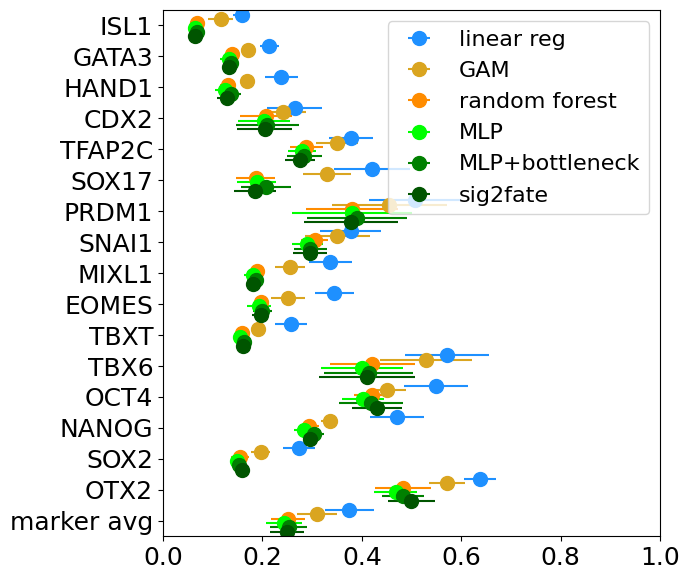

In [19]:
# plot MSE for different methods

cond = 'B50'
labels = gene_names + ['marker_avg']
labeldict = {'marker': labels}

methods = [
    ('linearreg',         'linear reg'),
    ('gam',                'GAM'),
    ('randomforest',      'random forest'),
    ('mlp_nobottleneck',  'MLP'),
    ('mlp_bottleneck',    'MLP+bottleneck'),
    # ('vib_beta0',          'VIB (β=0)'),
    ((32,2,2),             'sig2fate'),
]

c = np.array([0,1,0])
nn_shades = [c, c/2, c/3]  # MLP, MLP+bottleneck, sig2fate -- same green ramp as before
colors = [
    'dodgerblue',   # linear regression -- its own class
    'goldenrod',    # GAM -- its own class (nonlinear but not a shared/neural representation)
    'darkorange',   # random forest -- its own class
    nn_shades[0],   # MLP
    nn_shades[1],   # MLP+bottleneck
    nn_shades[2],   # VIB (sig2fate)
]

offsets = np.linspace(-0.35, 0.35, len(methods))

for prefix, labels in labeldict.items():

    fig, ax = plt.subplots(figsize=(7, 0.3*len(labels) + 0.8))
    fs = 18
    ms = 10

    for (k, name), c, offset in zip(methods, colors, offsets):
        means = mse[k]
        stds = mse_std[k]
        ax.errorbar(means, [i + offset for i in range(len(labels))], xerr=stds, fmt='o', color=c, ms=ms)

    labels_tick = labels.copy()
    labels_tick[-1] = prefix + ' avg'
    ax.set_xticks([0,0.2,0.4,0.6,0.8,1])
    ax.set_yticks(range(len(labels)), labels_tick)
    ax.tick_params(axis='both', labelsize=fs)

    ax.set_ylim([-0.5, len(labels) - 0.5])
    ax.set_xlim([0, 1])
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.legend([name for _, name in methods], fontsize=fs-2)
    plt.savefig(dataDir+'/FigS2/'+prefix+'MSE_VIB32-2-2_v_other_B50.png')


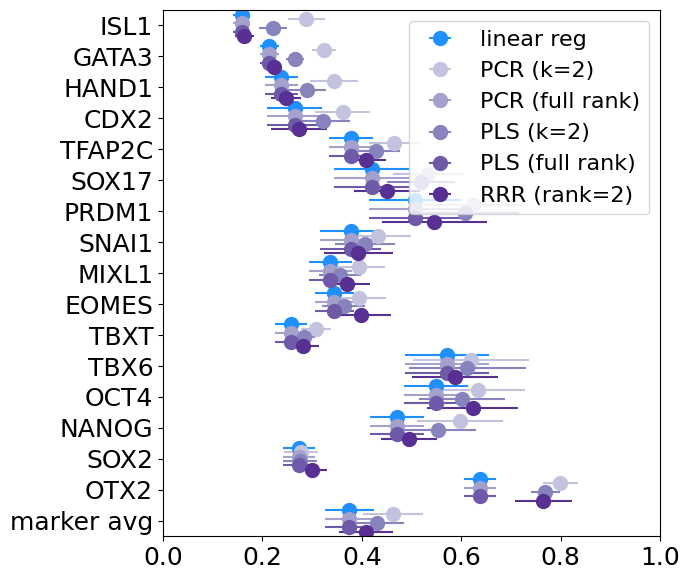

In [20]:
# PLOT MSE: CONSTRAINED VS ORDINARY LINEAR REGRESSION (PCR, PLS, RRR VS. LINEAR REG)
# Rank/component-constrained linear methods can never beat plain OLS on training-set fit;
# shown together to demonstrate that directly. (Also consistent with the collinearity
# diagnostics -- this dataset's VIFs are low, so no large PLS/PCR advantage is expected
# out-of-sample either.)

cond = 'B50'
labels = gene_names + ['marker_avg']
labeldict = {'marker': labels}

methods_linear = [
    ('linearreg',         'linear reg'),
    ('pcr_k2',             'PCR (k=2)'),
    ('pcr_full',           'PCR (full rank)'),
    ('pls_k2',             'PLS (k=2)'),
    ('pls_full',           'PLS (full rank)'),
    ('rrr_k2',             'RRR (rank=2)'),
]

purple_shades = plt.cm.Purples(np.linspace(0.35, 0.85, len(methods_linear) - 1))
colors_linear = ['dodgerblue'] + list(purple_shades)  # linear reg kept the same color as in the main comparison plot

offsets_linear = np.linspace(-0.35, 0.35, len(methods_linear))

for prefix, labels in labeldict.items():

    fig, ax = plt.subplots(figsize=(7, 0.3*len(labels) + 0.8))
    fs = 18
    ms = 10

    for (k, name), c, offset in zip(methods_linear, colors_linear, offsets_linear):
        means = mse[k]
        stds = mse_std[k]
        ax.errorbar(means, [i + offset for i in range(len(labels))], xerr=stds, fmt='o', color=c, ms=ms)

    labels_tick = labels.copy()
    labels_tick[-1] = prefix + ' avg'
    ax.set_xticks([0,0.2,0.4,0.6,0.8,1])
    ax.set_yticks(range(len(labels)), labels_tick)
    ax.tick_params(axis='both', labelsize=fs)

    ax.set_ylim([-0.5, len(labels) - 0.5])
    ax.set_xlim([0, 1])
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.legend([name for _, name in methods_linear], fontsize=fs-2)
    plt.savefig(dataDir+'/FigS2/'+prefix+'MSE_linear_constrained_v_ordinary_B50.png')


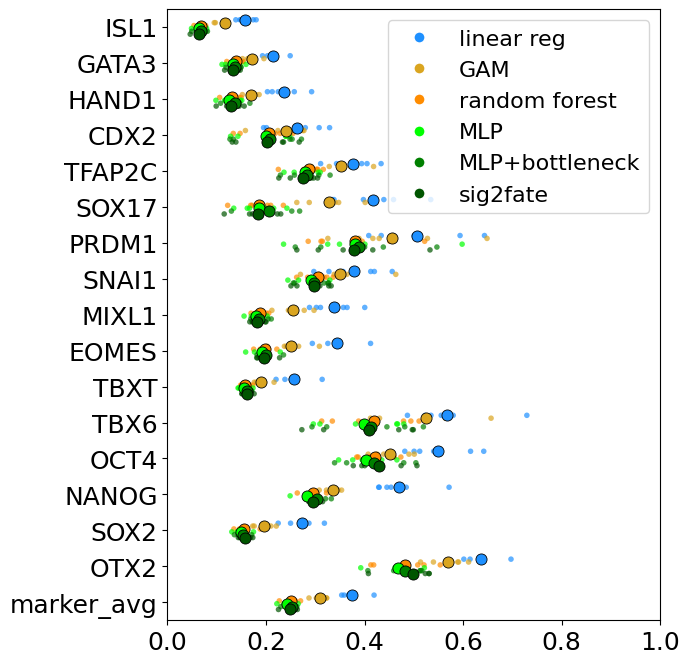

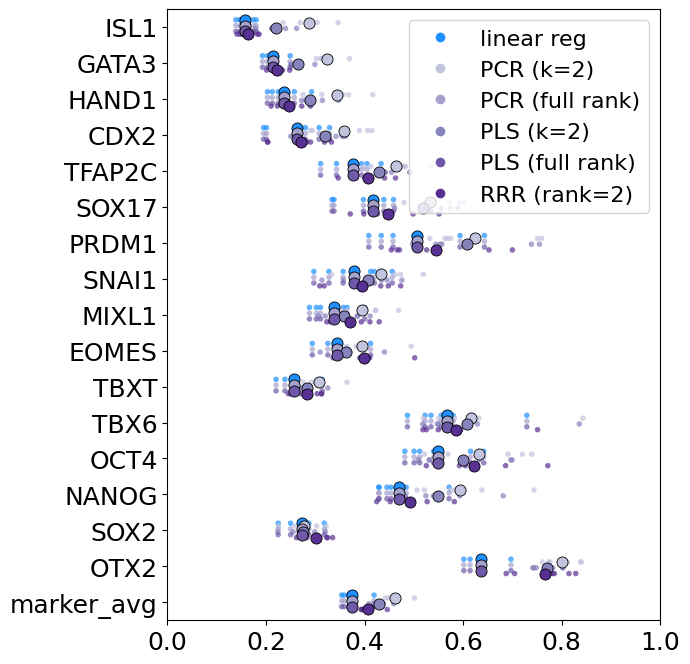

In [21]:
def run_mse_perfold_plots(methods_list, colors_list, fname_template):
    for prefix, labels in labeldict.items():
        series = []
        for (k, name), c in zip(methods_list, colors_list):
            df_k = mse_long[mse_long['model'] == k].copy()
            df_k['mse'] = df_k['mse'] / mse_max[2]
            series.append((IIF.add_group_avg(df_k, 'mse'), 'mse', c))
        legend_labels = [name for k, name in methods_list]
        IIF.plot_perfold_comparison(series, 'gene', labels, fname_template.format(prefix=prefix),
                             legend_labels=legend_labels, row_spacing=1.5, row_height=0.35,
                             ms=8, alpha=0.7, offset_range=0.3)

run_mse_perfold_plots(methods, colors, dataDir+'/FigS2/{prefix}MSE_perfold_VIB32-2-2_v_other_B50.png')
run_mse_perfold_plots(methods_linear, colors_linear, dataDir+'/FigS2/{prefix}MSE_perfold_linear_constrained_v_ordinary_B50.png')

## Discrete performance measures

### F1 beta sweep

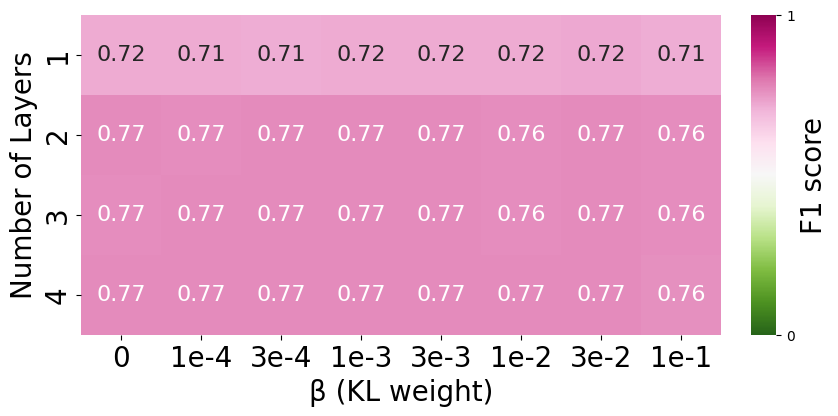

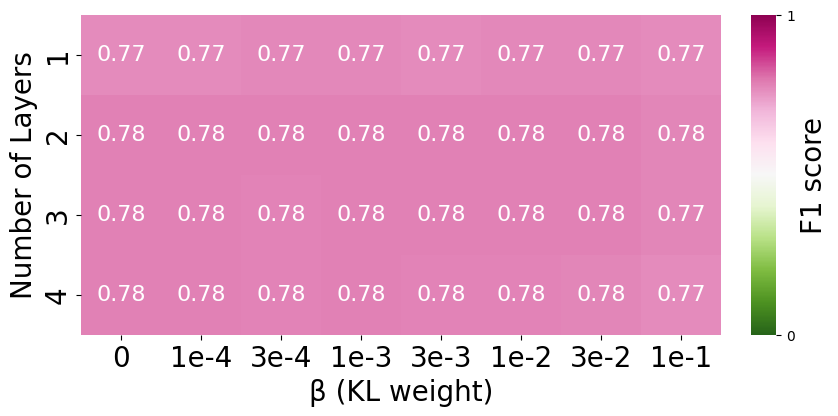

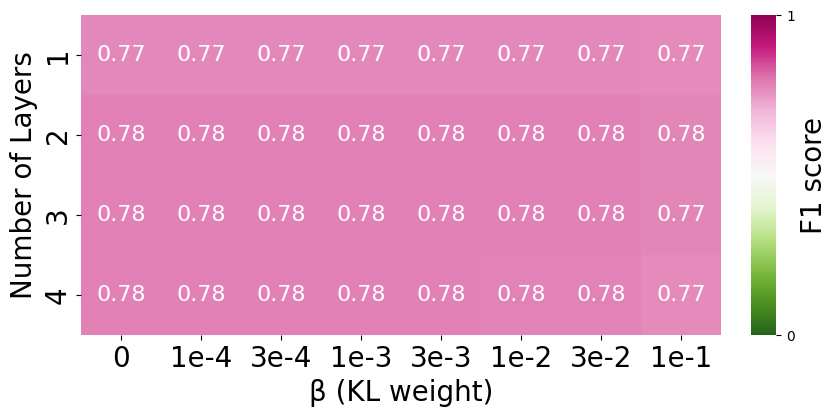

In [ ]:
# COMPUTE F1 FOR BETA SWEEP (Nhid=32 fixed)

from sklearn.metrics import f1_score

cond = 'B50'
condidx = data['condition']==cond
data_cond_idx = data[condidx].index
data_cond_thresh = data[condidx]

cols = range(1,5)   # N_LAYERS

f1_means_beta = {}
for Ldim in [1,2,3]:

    f1_opt = {}
    for run in range(0, N_run):
        f1_opt[run] = pd.DataFrame(np.zeros((len(beta_values), len(cols))), beta_values, cols)
        for Nlay in cols:
            for beta in beta_values:
                predi = pred_subs_beta[(Nlay, Ldim, beta)][run].loc[data_cond_idx, gene_names]

                f1_per_gene = []
                for marker in gene_names:
                    markerpos = data_cond_thresh[marker].to_numpy() > thresh_posterior[marker]
                    markerpos_pred = predi[marker].to_numpy() > thresh_posterior[marker]
                    f1_per_gene.append(f1_score(markerpos, markerpos_pred, average='binary', pos_label=1, zero_division=0))

                f1_opt[run].loc[beta, Nlay] = np.mean(f1_per_gene)

    f1_means_beta[Ldim] = pd.DataFrame(
        np.stack([df.values for df in f1_opt.values()]).mean(axis=0),
        index=f1_opt[0].index,
        columns=f1_opt[0].columns
    )

# PLOT 

for Ldim in [1,2,3]:
    plot_score_heatmap(
        f1_means_beta[Ldim], [format_beta(b) for b in beta_values], 'β (KL weight)',
        dataDir + '/FigS2/B50_beta_optimization_F1_Ldim'+str(Ldim)+'.png',
        xtick_rotation=0, vmin=0, vmax=1, cbar_label='F1 score'
    )


### Model comparison

In [37]:
# calculate accuracy and F1 for different methods, per fold

from sklearn.metrics import balanced_accuracy_score, accuracy_score, f1_score

data_cond_idx = data[data['condition']=='B50'].index
data_cond = data.loc[data_cond_idx]

pred_subs_compare = {k: pred_subs[k] for k, name in methods}
pred_subs_compare[(32,2,2)] = {'avg': pred_subs[(32,2,2)]['avg'].loc[data_cond_idx]}

# same exclusion calcPerformance applies before scoring anything
fates_cond_all, _ = IIF.return_fates(data_cond, thresh=thresh_posterior)
keep = fates_cond_all != 'other'
data_cond_scored = data_cond[keep]

perfold_records = []

for k, name in methods:
    pred_sub = pred_subs_compare[k]['avg'].loc[data_cond_scored.index]

    for colID in np.unique(data_cond_scored['Colony']):
        colidx = data_cond_scored['Colony'] == colID

        for marker in gene_names:
            markerpos = data_cond_scored[colidx][marker].to_numpy() > thresh_posterior[marker]
            markerpos_pred = pred_sub[colidx][marker].to_numpy() > thresh_posterior[marker]

            acc = accuracy_score(markerpos, markerpos_pred)
            bal_acc = balanced_accuracy_score(markerpos, markerpos_pred)
            f1_val = f1_score(markerpos, markerpos_pred, average='binary', pos_label=1, zero_division=0)

            perfold_records.append({'model': k, 'fold': colID, 'gene': marker,
                                     'accuracy': acc, 'balanced_accuracy': bal_acc, 'f1': f1_val})


perfold_df = pd.DataFrame(perfold_records)

ISL1 | linear reg: balanced_accuracy = 0.872
ISL1 | GAM: balanced_accuracy = 0.887
ISL1 | random forest: balanced_accuracy = 0.922
ISL1 | MLP: balanced_accuracy = 0.923
ISL1 | MLP+bottleneck: balanced_accuracy = 0.920
ISL1 | sig2fate: balanced_accuracy = 0.922
GATA3 | linear reg: balanced_accuracy = 0.894
GATA3 | GAM: balanced_accuracy = 0.902
GATA3 | random forest: balanced_accuracy = 0.908
GATA3 | MLP: balanced_accuracy = 0.916
GATA3 | MLP+bottleneck: balanced_accuracy = 0.901
GATA3 | sig2fate: balanced_accuracy = 0.902
HAND1 | linear reg: balanced_accuracy = 0.843
HAND1 | GAM: balanced_accuracy = 0.866
HAND1 | random forest: balanced_accuracy = 0.881
HAND1 | MLP: balanced_accuracy = 0.884
HAND1 | MLP+bottleneck: balanced_accuracy = 0.877
HAND1 | sig2fate: balanced_accuracy = 0.874
CDX2 | linear reg: balanced_accuracy = 0.778
CDX2 | GAM: balanced_accuracy = 0.860
CDX2 | random forest: balanced_accuracy = 0.921
CDX2 | MLP: balanced_accuracy = 0.918
CDX2 | MLP+bottleneck: balanced_accu

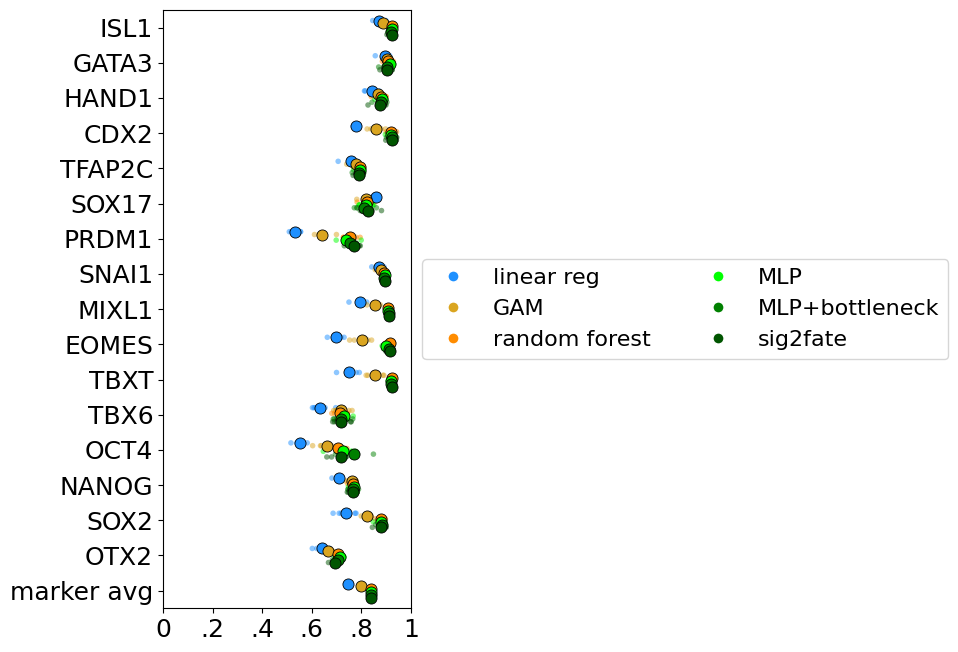

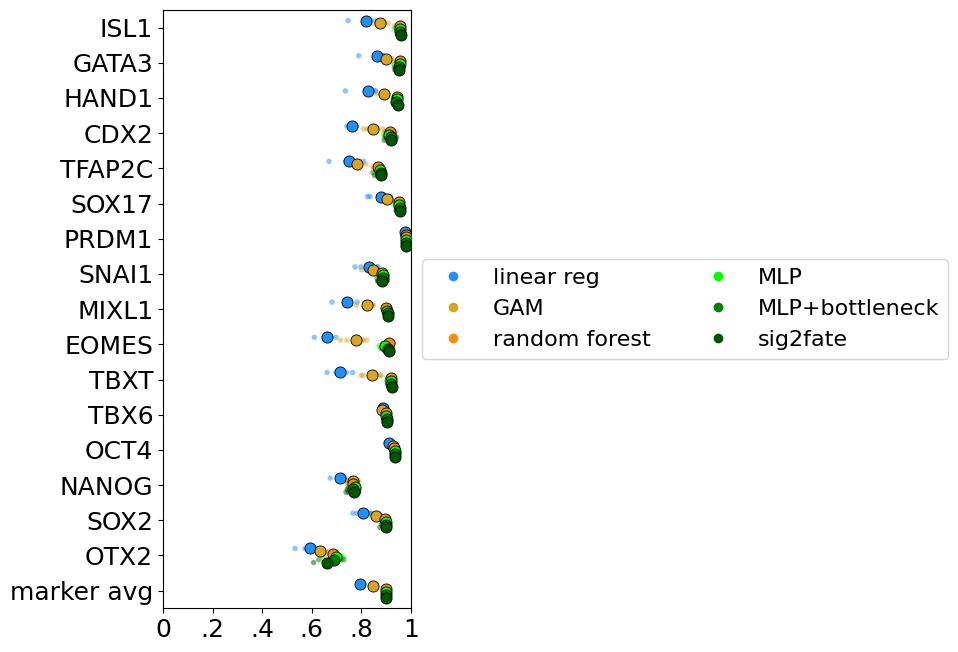

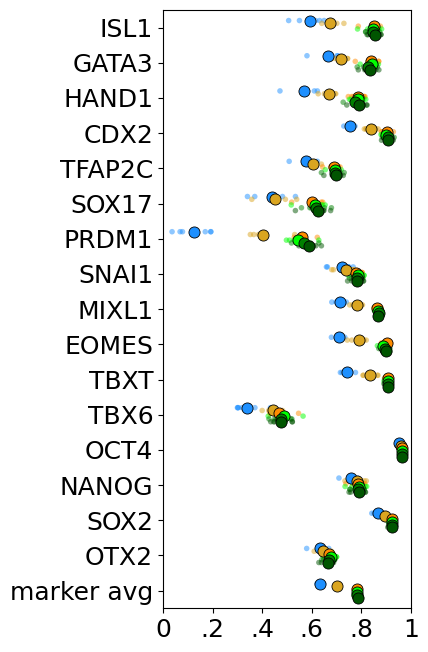

In [38]:
from matplotlib.ticker import FuncFormatter

def strip_leading_zero(x, pos):
    s = f'{x:g}'
    return s[1:] if s.startswith('0.') else s

def plot_score_per_fold(score_col, methods_list, colors_list, fname, row_spacing=1.5, legend=True,
                         labels=None, data_df=None, group_col='model', row_col='gene'):
    if labels is None:
        labels = gene_names + ['marker_avg']
    if data_df is None:
        data_df = perfold_df

    fig, ax = plt.subplots(figsize=(3.2, 0.41*len(labels) + 0.8))
    fs = 18
    ms = 8

    offsets = np.linspace(-0.3, 0.3, len(methods_list))
    row_positions = np.arange(len(labels)) * row_spacing

    for row_i, row_label in zip(row_positions, labels):
        for (k, name), c, offset in zip(methods_list, colors_list, offsets):
            if row_label == 'marker_avg':
                fold_vals = data_df[data_df[group_col] == k].groupby('fold')[score_col].mean()
            else:
                fold_vals = data_df[(data_df[group_col] == k) & (data_df[row_col] == row_label)].set_index('fold')[score_col]

            mean_val = fold_vals.mean()
            print(f'{row_label} | {name}: {score_col} = {mean_val:.3f}')

            y = row_i + offset
            ax.scatter(fold_vals, [y] * len(fold_vals), color=c, s=(ms/2)**2, alpha=0.5, edgecolors='none', zorder=2)
            ax.scatter(mean_val, y, color=c, s=ms**2, alpha=1.0, edgecolors='black', linewidths=0.6, zorder=3)

    labels_tick = labels.copy()
    if labels_tick[-1] == 'marker_avg':
        labels_tick[-1] = 'marker avg'
    ax.set_xticks([0,0.2,0.4,0.6,0.8,1])
    ax.xaxis.set_major_formatter(FuncFormatter(strip_leading_zero))
    ax.set_yticks(row_positions, labels_tick)
    ax.tick_params(axis='both', labelsize=fs)

    ax.set_ylim([-row_spacing/2, row_positions[-1] + row_spacing/2])
    ax.set_xlim([0, 1])
    plt.gca().invert_yaxis()

    handles = [plt.Line2D([0],[0], marker='o', color='w', markerfacecolor=c, markersize=8, label=name)
               for (k, name), c in zip(methods_list, colors_list)]
    if legend:
        ax.legend(handles=handles, fontsize=fs-2, loc='center left', bbox_to_anchor=(1.0, 0.5), ncols=2)

    plt.savefig(fname, bbox_inches='tight')


plot_score_per_fold('balanced_accuracy', methods, colors, dataDir+'/FigS2/balanced_accuracy_perfold_VIB32-2-2_v_other_B50.png')
plot_score_per_fold('accuracy', methods, colors, dataDir+'/FigS2/accuracy_perfold_VIB32-2-2_v_other_B50.png')
plot_score_per_fold('f1', methods, colors, dataDir+'/FigS2/F1_perfold_VIB32-2-2_v_other_B50.png',legend=False)


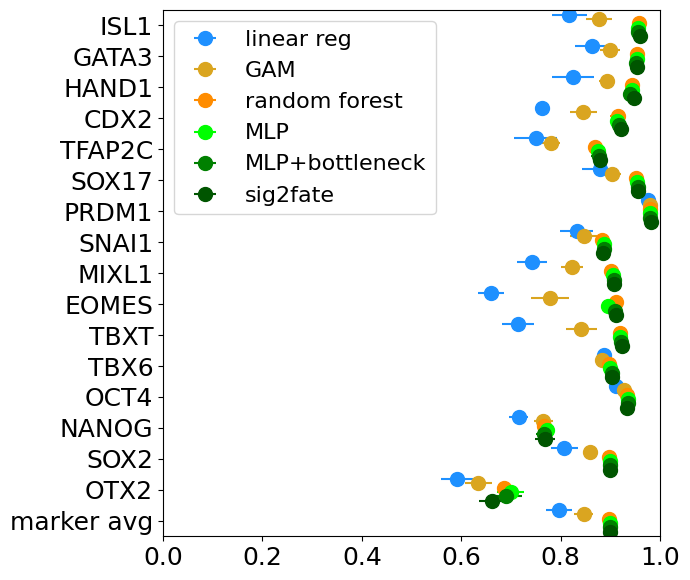

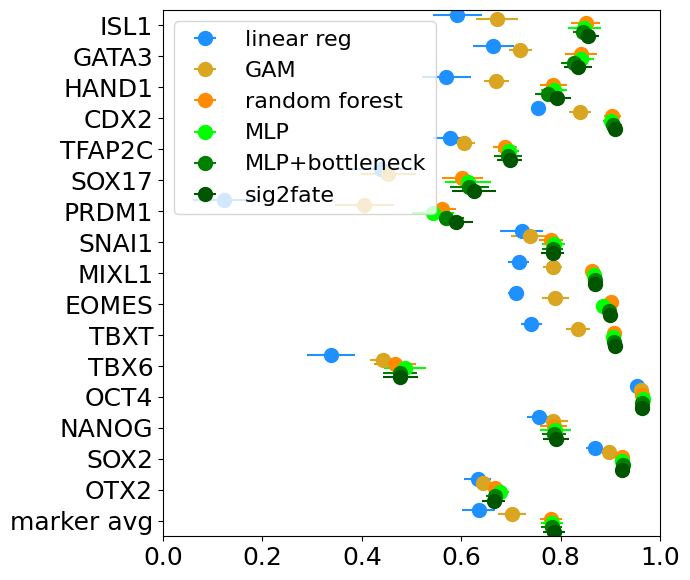

In [39]:
# calculate accuracy and F1 for different methods

data_cond_idx = data[data['condition']=='B50'].index

pred_subs_compare = {k: pred_subs[k] for k, name in methods}
pred_subs_compare[(32,2,2)] = {'avg': pred_subs[(32,2,2)]['avg'].loc[data_cond_idx]}
performances_compare, _ = IIF.calcPerformance(data[data['condition']=='B50'], pred_subs_compare, thresh_posterior, gene_names) # switch thresh_posterior to thresh for manual thresholds
perf = performances_compare['B50']

rows = gene_names + ['marker_avg']   # matches plot label order -- see MSE-cell fix above

acc     = pd.DataFrame({k: perf.loc[rows, f'{k}-acc-avg'] for k, name in methods})
acc_std = pd.DataFrame({k: perf.loc[rows, f'{k}-acc-std'] for k, name in methods})
f1      = pd.DataFrame({k: perf.loc[rows, f'{k}-f1-avg']  for k, name in methods})
f1_std  = pd.DataFrame({k: perf.loc[rows, f'{k}-f1-std']  for k, name in methods})

# plot accuracy and F1 for different methods

labels = gene_names + ['marker_avg']

for score_name, means_df, std_df in [('accuracy', acc, acc_std), ('F1', f1, f1_std)]:

    fig, ax = plt.subplots(figsize=(7, 0.3*len(labels) + 0.8))
    fs = 18
    ms = 10

    offsets = np.linspace(-0.35, 0.35, len(methods))
    for (k, name), c, offset in zip(methods, colors, offsets):
        means = means_df[k]
        stds = std_df[k]
        ax.errorbar(means, [i + offset for i in range(len(labels))], xerr=stds, fmt='o', color=c, ms=ms)

    labels_tick = labels.copy()
    labels_tick[-1] = 'marker avg'
    ax.set_xticks([0,0.2,0.4,0.6,0.8,1])
    ax.set_yticks(range(len(labels)), labels_tick)
    ax.tick_params(axis='both', labelsize=fs)

    ax.set_ylim([-0.5, len(labels) - 0.5])
    ax.set_xlim([0, 1])
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.legend([name for _, name in methods], fontsize=fs-2)
    plt.savefig(dataDir+'/FigS2/'+score_name+'_VIB32-2-2_v_other_B50.png')

### Threshold sensitivity

In [40]:
# COMPARE MODEL F1 AND ACCURACY: MANUAL THRESHOLDS VS POSTERIOR THRESHOLDS
importlib.reload(IIF);
display_decimals = 2

from sklearn.metrics import balanced_accuracy_score

def calc_balanced_accuracy(pred_subs, thresh):
    fates, _ = IIF.return_fates(data, thresh=thresh)
    idx = (data['condition'] == 'B50') & (fates != 'other')
    data_cond = data[idx]

    bal_acc_all = {}
    for pred_sub_name, pred_sub in pred_subs.items():
        pred_sub_avg = pred_sub['avg'].loc[data_cond.index]
        bal_acc_dict = {marker: [] for marker in gene_names}
        for colID in np.unique(data_cond['Colony']):
            colidx = data_cond['Colony'] == colID
            for marker in gene_names:
                markerpos = data_cond[colidx][marker].to_numpy() > thresh[marker]
                markerpos_pred = pred_sub_avg[colidx][marker].to_numpy() > thresh[marker]
                bal_acc_dict[marker].append(balanced_accuracy_score(markerpos, markerpos_pred))

        marker_means = {marker: np.nanmean(vals) for marker, vals in bal_acc_dict.items()}
        marker_means['marker_avg'] = np.mean(list(marker_means.values()))
        bal_acc_all[pred_sub_name] = marker_means

    return pd.DataFrame(bal_acc_all)


performances_manual, _ = IIF.calcPerformance(data[data['condition']=='B50'], pred_subs_compare, thresh, gene_names)
perf_manual = performances_manual['B50']

performances_posterior, _ = IIF.calcPerformance(data[data['condition']=='B50'], pred_subs_compare, thresh_posterior, gene_names)
perf_posterior = performances_posterior['B50']

rows = gene_names + ['marker_avg']
acc_manual    = pd.DataFrame({k: perf_manual.loc[rows, f'{k}-acc-avg']    for k, name in methods})
f1_manual     = pd.DataFrame({k: perf_manual.loc[rows, f'{k}-f1-avg']     for k, name in methods})
acc_posterior = pd.DataFrame({k: perf_posterior.loc[rows, f'{k}-acc-avg'] for k, name in methods})
f1_posterior  = pd.DataFrame({k: perf_posterior.loc[rows, f'{k}-f1-avg']  for k, name in methods})

bal_acc_manual    = calc_balanced_accuracy(pred_subs_compare, thresh)
bal_acc_posterior = calc_balanced_accuracy(pred_subs_compare, thresh_posterior)

summary = pd.DataFrame({
    'accuracy (manual)':    acc_manual.loc['marker_avg'],
    'accuracy (posterior)': acc_posterior.loc['marker_avg'],
    'balanced accuracy (manual)':    bal_acc_manual.loc['marker_avg'],
    'balanced accuracy (posterior)': bal_acc_posterior.loc['marker_avg'],
    'F1 (manual)':          f1_manual.loc['marker_avg'],
    'F1 (posterior)':       f1_posterior.loc['marker_avg'],
})
summary.index = [name for k, name in methods]
summary.round(display_decimals)

marker_summary = pd.DataFrame({
    'acc. (manual)':      acc_manual[(32,2,2)],
    'acc. (posterior)':   acc_posterior[(32,2,2)],
    'bal. acc. (manual)':    bal_acc_manual[(32,2,2)],
    'bal. acc. (posterior)': bal_acc_posterior[(32,2,2)],
    'F1 (manual)':        f1_manual[(32,2,2)],
    'F1 (posterior)':     f1_posterior[(32,2,2)],
}).rename(index={'marker_avg': 'average'})

marker_summary.round(display_decimals)

IIF.save_df_as_image(marker_summary.round(2), dataDir + '/FigS2/marker_performance_manual_vs_posterior.png', row_height=0.3)


In [42]:
# PER-FATE F1: MANUAL VS POSTERIOR THRESHOLDS

fate_names_all = [f for f in perf_manual.index if f not in list(gene_names) + ['marker_avg', 'fate_macro']]
fate_rows = fate_names_all + ['fate_macro']

per_fate_f1_manual    = pd.DataFrame({k: perf_manual.loc[fate_rows, f'{k}-f1-avg']    for k, name in methods})
per_fate_f1_posterior = pd.DataFrame({k: perf_posterior.loc[fate_rows, f'{k}-f1-avg'] for k, name in methods})
per_fate_f1_manual    = per_fate_f1_manual[[(32,2,2)]]
per_fate_f1_posterior = per_fate_f1_posterior[[(32,2,2)]]
per_fate_f1_manual.columns    = ['sig2fate']
per_fate_f1_posterior.columns = ['sig2fate']

per_fate_f1 = pd.DataFrame({
    'F1 (manual)':    per_fate_f1_manual['sig2fate'],
    'F1 (posterior)': per_fate_f1_posterior['sig2fate'],
}).rename(index={'fate_macro': 'average'})
per_fate_f1['diff'] = per_fate_f1['F1 (posterior)'] - per_fate_f1['F1 (manual)']
per_fate_f1

IIF.save_df_as_image(per_fate_f1.round(2), dataDir + '/FigS2/per_fate_f1.png')

In [44]:
# THRESHOLD SENSITIVITY ANALYSIS FOR FATE
# For markers with both background and foreground fits, sweeps the odds-ratio crossing point
# at two extremes (RATIO_LOW, RATIO_HIGH) and compares against the existing posterior threshold
# (ratio=1). Markers using the strict-foreground/fallback cutoff rules fall back to whatever
# thresh_posterior already used for them, since the odds ratio isn't defined there.

RATIO_LOW = 0.01
RATIO_HIGH = 100

STRICT_FOREGROUND_CUTOFF_LOW, STRICT_FOREGROUND_CUTOFF_HIGH = IIF.cutoff_bounds(STRICT_FOREGROUND_CUTOFF)          # ~0.47, ~0.99
FOREGROUND_FALLBACK_CUTOFF_LOW, FOREGROUND_FALLBACK_CUTOFF_HIGH = IIF.cutoff_bounds(FOREGROUND_FALLBACK_CUTOFF)     # ~0.09, ~0.91
BACKGROUND_FALLBACK_CUTOFF_LOW, BACKGROUND_FALLBACK_CUTOFF_HIGH = IIF.cutoff_bounds(BACKGROUND_FALLBACK_CUTOFF)     # ~0.005, ~0.34

def compute_thresh_for_sensitivity(level):
    # level: 'low' (most lenient -- more cells called positive) or 'high' (most strict)
    ratio = RATIO_LOW if level == 'low' else RATIO_HIGH
    strict_fg_cutoff = STRICT_FOREGROUND_CUTOFF_LOW if level == 'low' else STRICT_FOREGROUND_CUTOFF_HIGH
    fg_fallback_cutoff = FOREGROUND_FALLBACK_CUTOFF_LOW if level == 'low' else FOREGROUND_FALLBACK_CUTOFF_HIGH
    # background searches rightward off its peak, so low/high are inverted relative to the
    # foreground branches above -- HIGH cutoff there is what gives the lenient (lower) threshold
    bg_fallback_cutoff = BACKGROUND_FALLBACK_CUTOFF_HIGH if level == 'low' else BACKGROUND_FALLBACK_CUTOFF_LOW

    result = {}
    for marker in gene_names:
        fit = fits[marker]
        has_bg = not np.isnan(fit['sigma_hwhm'])
        has_fg = not np.isnan(fit['sigma_hwhm_high'])

        if marker in STRICT_FOREGROUND_CUTOFF_MARKERS and has_fg:
            w = 2 * np.mean(fit['log_vals'] > fit['m_high'])
            x_cross = IIF.posterior_crossing(fit['grid'], fit['density'], fit['m_high'], fit['sigma_hwhm_high'],
                                              w, strict_fg_cutoff, direction=-1)
        elif has_bg and has_fg:
            w_bg = 2 * np.mean(fit['log_vals'] < fit['m'])
            w_fg = 2 * np.mean(fit['log_vals'] > fit['m_high'])
            x_cross = IIF.odds_crossing(fit['grid'], fit['m'], fit['sigma_hwhm'], w_bg,
                                         fit['m_high'], fit['sigma_hwhm_high'], w_fg, ratio)
        elif has_fg:
            w = 2 * np.mean(fit['log_vals'] > fit['m_high'])
            x_cross = IIF.posterior_crossing(fit['grid'], fit['density'], fit['m_high'], fit['sigma_hwhm_high'],
                                              w, fg_fallback_cutoff, direction=-1)
        elif has_bg:
            w = 2 * np.mean(fit['log_vals'] < fit['m'])
            x_cross = IIF.posterior_crossing(fit['grid'], fit['density'], fit['m'], fit['sigma_hwhm'],
                                              w, bg_fallback_cutoff, direction=1)
        else:
            x_cross = np.nan

        result[marker] = 10**x_cross - fit['offset'] if not np.isnan(x_cross) else np.nan
    return result

thresh_ratio_low = compute_thresh_for_sensitivity('low')
thresh_ratio_high = compute_thresh_for_sensitivity('high')


def evaluate_thresholds(thresh_dict):
    perf_out, _ = IIF.calcPerformance(data[data['condition']=='B50'], pred_subs_compare, thresh_dict, gene_names)
    return perf_out['B50']

perf_ratio_low = evaluate_thresholds(thresh_ratio_low)
perf_ratio_high = evaluate_thresholds(thresh_ratio_high)

# --- per-marker comparison ---
rows_all = gene_names + ['marker_avg']
acc_low  = pd.DataFrame({k: perf_ratio_low.loc[rows_all, f'{k}-acc-avg']  for k, name in methods})
f1_low   = pd.DataFrame({k: perf_ratio_low.loc[rows_all, f'{k}-f1-avg']   for k, name in methods})
acc_high = pd.DataFrame({k: perf_ratio_high.loc[rows_all, f'{k}-acc-avg'] for k, name in methods})
f1_high  = pd.DataFrame({k: perf_ratio_high.loc[rows_all, f'{k}-f1-avg']  for k, name in methods})

marker_summary_ratios = pd.DataFrame({
    f'accuracy (ratio={RATIO_LOW})':         acc_low[(32,2,2)],
    'accuracy (ratio=1, posterior)':         acc_posterior[(32,2,2)],
    f'accuracy (ratio={RATIO_HIGH})':        acc_high[(32,2,2)],
    f'F1 (ratio={RATIO_LOW})':               f1_low[(32,2,2)],
    'F1 (ratio=1, posterior)':               f1_posterior[(32,2,2)],
    f'F1 (ratio={RATIO_HIGH})':              f1_high[(32,2,2)],
})
marker_summary_ratios

# --- per-fate comparison ---
fate_names_all = [f for f in perf_posterior.index if f not in list(gene_names) + ['marker_avg', 'fate_macro']]
fate_rows = fate_names_all + ['fate_macro']

fate_f1_ratios = pd.DataFrame({
    f'F1 (ratio={RATIO_LOW})':         perf_ratio_low.loc[fate_rows, '(32, 2, 2)-f1-avg'],
    'F1 (ratio=1, posterior)':         perf_posterior.loc[fate_rows, '(32, 2, 2)-f1-avg'],
    f'F1 (ratio={RATIO_HIGH})':        perf_ratio_high.loc[fate_rows, '(32, 2, 2)-f1-avg'],
}).rename(index={'fate_macro': 'average'})
fate_f1_ratios

IIF.save_df_as_image(fate_f1_ratios.round(2), dataDir + '/FigS2/per_fate_f1_threshold_sensitivity.png')

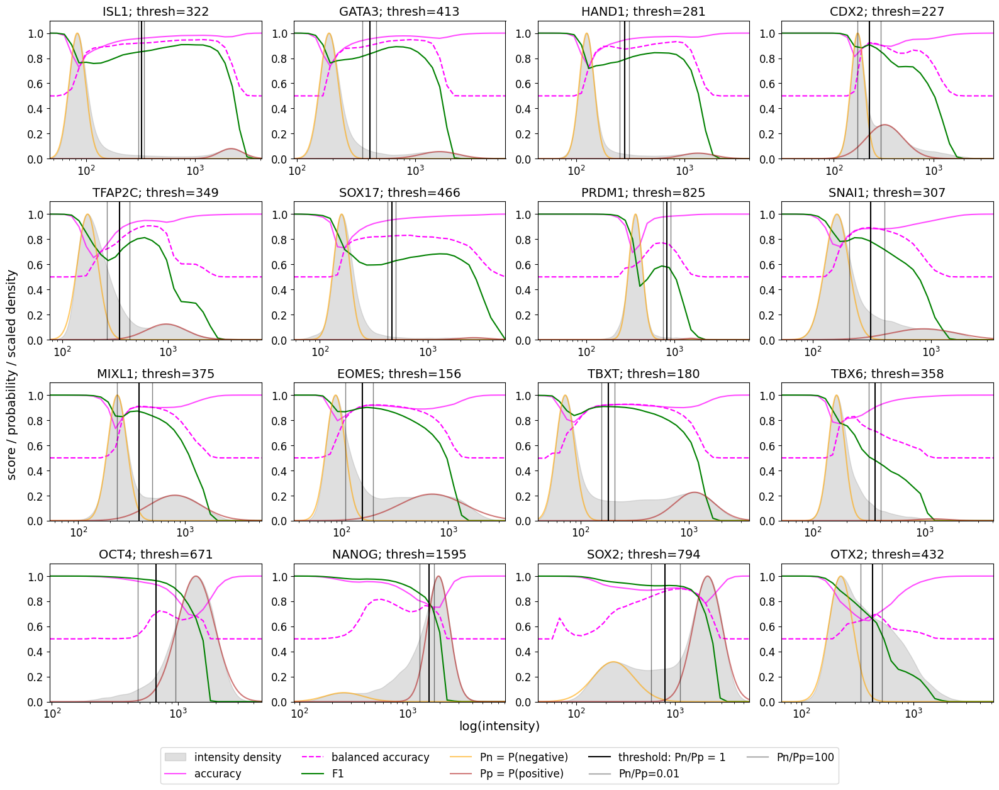

In [45]:
# THRESHOLD SENSITIVITY FOR SIG2FATE (VIB)
# For each marker: sweep a range of candidate thresholds, and at each one compute balanced
# accuracy/F1 between calling a cell "positive" in the measured data vs. in sig2fate's
# prediction (same threshold applied to both). P(negative)/P(positive) are the same
# fitted Gaussians from PLOT BACKGROUND + FOREGROUND MODEL..., scaled the same way (each
# peak matched to its own height in the KDE, then divided by density.max() to land on this
# plot's 0-1 axis) -- shows directly what's driving where the automated threshold sits.
#
# Density and the Gaussian fits both come from fits[marker] -- no independent KDE here, so
# this stays consistent with the CALCULATE AUTOMATED THRESHOLDS cell. Must run after it.
# The sig2fate-predicted distribution isn't part of fits (that's fit only to the measured
# data), so showing it here is the one place this cell falls back to its own KDE.

from sklearn.metrics import balanced_accuracy_score, matthews_corrcoef, accuracy_score, f1_score
from sklearn.exceptions import UndefinedMetricWarning
import warnings
warnings.filterwarnings("ignore", category=UndefinedMetricWarning)  # degenerate at sweep extremes (all-one-class)
warnings.filterwarnings("ignore", message="A single label was found in 'y_true' and 'y_pred'.*", category=UserWarning)

log_intensity = True
show_manual_threshold = False
show_automated_threshold = True
show_sensitivity_range = True     # the RATIO_LOW/RATIO_HIGH odds-ratio thresholds from THRESHOLD SENSITIVITY ANALYSIS
show_prediction_density = False    # overlay sig2fate's predicted-intensity KDE alongside the measured density

legendfs = 12
tickfs = 12
titlefs = 14
axlabelfs = 14

data_cond = data[data['condition']=='B50']
sig2fate_pred = pred_subs[(32,2,2)]['avg'].loc[data_cond.index]

n_steps = 30
n_genes = len(gene_names)
n_cols = 4
n_rows = int(np.ceil(n_genes / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows))
axes = axes.ravel()

for i, marker in enumerate(gene_names):

    fit = fits[marker]
    true_vals = data_cond[marker].to_numpy()
    pred_vals = sig2fate_pred[marker].to_numpy()

    if log_intensity:
        log_lo, log_hi = np.nanpercentile(fit['log_vals'], [0.001, 99.999])
        log_thresholds = np.linspace(log_lo, log_hi, n_steps)
        thresholds = 10**log_thresholds - fit['offset']
        suffix = '_logaxis'
    else:
        lo, hi = np.nanpercentile(true_vals, [1, 99])
        thresholds = np.linspace(lo, hi, n_steps)
        log_thresholds = np.log10(thresholds + fit['offset'])
        suffix = ''

    valid = thresholds > 0   # log-scale axis can't show non-positive values

    x_grid_lin = 10**fit['grid'] - fit['offset']
    valid_grid = x_grid_lin > 0

    density_full = fit['density']
    density_scaled = density_full / density_full.max()

    bal_acc = np.zeros(valid.sum())
    acc_unbalanced = np.zeros(valid.sum())
    f1_sweep = np.zeros(valid.sum())

    for j, t in enumerate(thresholds[valid]):
        true_pos = true_vals > t
        pred_pos = pred_vals > t
        bal_acc[j] = balanced_accuracy_score(true_pos, pred_pos)
        acc_unbalanced[j] = accuracy_score(true_pos, pred_pos)
        f1_sweep[j] = f1_score(true_pos, pred_pos)

    ax = axes[i]
    ax.fill_between(x_grid_lin[valid_grid], 0, density_scaled[valid_grid], color='gray', alpha=0.25, zorder=1, label='intensity density')
    ax.plot(thresholds[valid], acc_unbalanced, label='accuracy', color='magenta', linestyle='-', zorder=2, alpha=0.7)
    ax.plot(thresholds[valid], bal_acc, label='balanced accuracy', color='magenta', linestyle='--', zorder=2)
    ax.plot(thresholds[valid], f1_sweep, label='F1', color='green', linestyle='-', zorder=2)

    if not np.isnan(fit['sigma_hwhm']):
        bg_peak_height = fit['density'][np.argmin(np.abs(fit['grid'] - fit['m']))]
        bg_pdf = norm.pdf(fit['grid'], fit['m'], fit['sigma_hwhm'])
        bg_pdf_scaled = bg_pdf * (bg_peak_height / bg_pdf.max()) / density_full.max()
        ax.plot(x_grid_lin[valid_grid], bg_pdf_scaled[valid_grid], color='orange', alpha=0.6, linewidth=1.5, label='Pn = P(negative)')

    if not np.isnan(fit['sigma_hwhm_high']):
        fg_peak_height = fit['density'][np.argmin(np.abs(fit['grid'] - fit['m_high']))]
        fg_pdf = norm.pdf(fit['grid'], fit['m_high'], fit['sigma_hwhm_high'])
        fg_pdf_scaled = fg_pdf * (fg_peak_height / fg_pdf.max()) / density_full.max()
        ax.plot(x_grid_lin[valid_grid], fg_pdf_scaled[valid_grid], color='firebrick', alpha=0.6, linewidth=1.5, label='Pp = P(positive)')

    if show_prediction_density:
        # log-transformed with the same offset as the measured data so it lands on the same axis
        pred_vals_clean = pred_vals[~np.isnan(pred_vals)]
        pred_valid = pred_vals_clean + fit['offset'] > 0
        pred_log_vals = np.log10(pred_vals_clean[pred_valid] + fit['offset'])

        pred_kde = gaussian_kde(pred_log_vals)
        pred_density = pred_kde(fit['grid'])
        pred_density_scaled = pred_density / pred_density.max()
        ax.plot(x_grid_lin[valid_grid], pred_density_scaled[valid_grid], color='darkorange', linewidth=1,
                linestyle='--', alpha=0.8, zorder=1, label='sig2fate prediction density')

    if show_manual_threshold:
        ax.axvline(thresh[marker], color='darkorange', linestyle='--', linewidth=1, label='manual threshold', zorder=3)

    if show_automated_threshold and not np.isnan(thresh_posterior[marker]):
        ax.axvline(thresh_posterior[marker], color='k', linestyle='-', linewidth=1.5, label='threshold: Pn/Pp = 1', zorder=3)

    if show_sensitivity_range:
        if not np.isnan(thresh_ratio_low[marker]):
            ax.axvline(thresh_ratio_low[marker], color='k', linestyle='-', linewidth=1, alpha=0.5,
                       label=f'Pn/Pp={RATIO_LOW}', zorder=3)
        if not np.isnan(thresh_ratio_high[marker]):
            ax.axvline(thresh_ratio_high[marker], color='k', linestyle='-', linewidth=1, alpha=0.5,
                       label=f'Pn/Pp={RATIO_HIGH}', zorder=3)

    if log_intensity:
        ax.set_xscale('log')
    thresh_str = f'{thresh_posterior[marker]:.0f}' if not np.isnan(thresh_posterior[marker]) else 'n/a'
    ax.set_title(f'{marker}; thresh={thresh_str}', fontsize=titlefs)
    ax.set_ylim([0, 1.1])
    ax.tick_params(labelsize=9)
    ax.set_xlim(thresholds[valid].min(), thresholds[valid].max())
    ax.tick_params(labelsize=tickfs)

for ax in axes[n_genes:]:
    ax.axis('off')

seen = {}
for ax in axes[:n_genes]:
    h, l = ax.get_legend_handles_labels()
    for hi, li in zip(h, l):
        seen.setdefault(li, hi)
fig.legend(seen.values(), seen.keys(), fontsize=legendfs, loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=np.ceil(len(seen)/2))
#fig.legend(seen.values(), seen.keys(), fontsize=10, loc='center left', bbox_to_anchor=(1.0, 0.5))


fig.supxlabel('log(intensity)', fontsize=axlabelfs, y=0.025)
fig.supylabel('score / probability / scaled density', fontsize=axlabelfs, x=0.01)
plt.tight_layout()
os.makedirs(dataDir + '/FigS2', exist_ok=True)
plt.savefig(dataDir + '/FigS2/sig2fate_threshold_sensitivity_per_marker'+suffix+'.png', bbox_inches='tight')

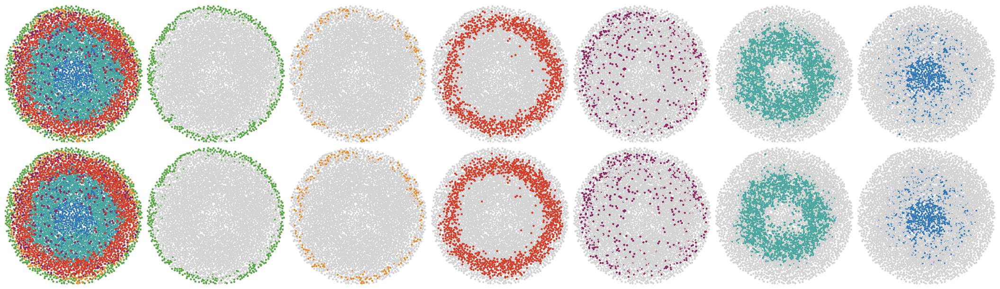

In [46]:
colID = 1#15
file_suffix = '.png'
lim = 350

fate_names_outsidein = ['AMLC', 'PGCLC', 'PSLC', 'meso', 'pluri', 'ecto']
n = len(fate_names_outsidein) + 1

thresh_variants = [('manual', thresh), ('background posterior', thresh_posterior)]

fig, ax = plt.subplots(len(thresh_variants), n, figsize=(n*3, len(thresh_variants)*3), constrained_layout=True)
ms = 10

for row_i, (label, thresh_variant) in enumerate(thresh_variants):

    col[colID].scatter_fates(ms=ms, thresh=thresh_variant, legend=False, ax=ax[row_i, 0])
    ax[row_i, 0].set_xlim([-lim, lim])
    ax[row_i, 0].set_ylim([lim, -lim])
    ax[row_i, 0].set_ylabel(label, fontsize=12)

    for i, f in enumerate(fate_names_outsidein):
        col[colID].scatter_fates(ms=ms, thresh=thresh_variant, legend=False, ax=ax[row_i, i+1], fate=f)
        ax[row_i, i+1].set_xlim([-lim, lim])
        ax[row_i, i+1].set_ylim([lim, -lim])

os.makedirs(dataDir + '/Fig2', exist_ok=True)
plt.savefig(dataDir + "/Fig2/" + 'fates_scatter_manual_vs_posterior_' + conditions[0] + file_suffix)

### Alternative cell fate clustering

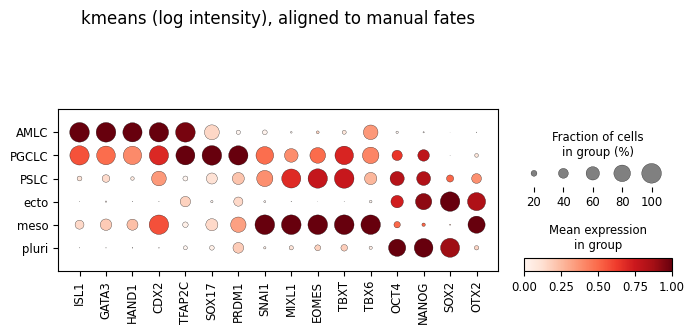

clipping 20 cell(s) with non-positive value(s) before log-transform
kmeans cluster-based (log intensity, 16 markers): accuracy=0.682, balanced accuracy=0.694, macro F1=0.682


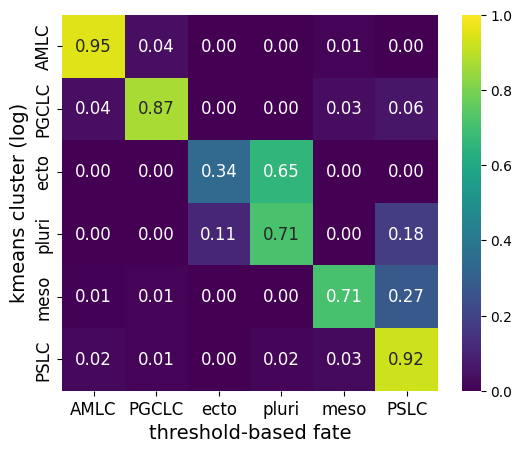

In [22]:
# ASSIGN SIG2FATE PREDICTIONS TO CLUSTERS VIA KNN, THEN COMPARE PERFORMANCE
# Supports K-means (hard, assumes equal spherical variance per cluster) or Gaussian
# Mixture (soft, allows different covariance per cluster -- discretized here via MAP
# assignment, which only reduces to K-means under the equal-spherical-covariance special
# case discussed above) as the clustering method.

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, f1_score, balanced_accuracy_score
from scipy.optimize import linear_sum_assignment
import anndata as ad
import scanpy as sc

FATE_MARKERS = ['TFAP2C', 'SOX17', 'NANOG', 'ISL1', 'TBXT', 'TBX6', 'SOX2']   # exactly what return_fates uses
FATE_MARKERS = gene_names 

def align_cluster_labels(reference_labels, new_labels):
    ref = pd.Series(reference_labels)
    new = pd.Series(new_labels)
    contingency = pd.crosstab(new, ref)

    cost = -contingency.values
    row_ind, col_ind = linear_sum_assignment(cost)
    new_to_ref = {contingency.index[r]: contingency.columns[c] for r, c in zip(row_ind, col_ind)}

    unmatched_new = [c for c in contingency.index if c not in new_to_ref]
    extra_id = 0
    for c in unmatched_new:
        new_to_ref[c] = f'unmatched_{extra_id}'
        extra_id += 1

    return new.map(new_to_ref).values

def run_cluster_performance(log_intensity, method='kmeans', markers=None, n_clusters=6, knn_n_neighbors=10,
                             covariance_type='full', gmm_n_init=5, plot=True):
    markers = markers or gene_names
    data_b50_cluster = data[data['condition']=='B50'].copy()

    if log_intensity:
        marker_transformed = pd.DataFrame({g: np.log10(data_b50_cluster[g] + fits[g]['offset']) for g in markers}, index=data_b50_cluster.index)
    else:
        marker_transformed = data_b50_cluster[markers]

    gene_mean = marker_transformed.mean()
    gene_std = marker_transformed.std()
    marker_z = (marker_transformed - gene_mean) / gene_std

    if method == 'kmeans':
        clusterer = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
        cluster_labels = clusterer.fit_predict(marker_z.values)
    elif method == 'gmm':
        clusterer = GaussianMixture(n_components=n_clusters, covariance_type=covariance_type, random_state=42, n_init=gmm_n_init)
        clusterer.fit(marker_z.values)
        cluster_labels = clusterer.predict(marker_z.values)
    else:
        raise ValueError(f"method must be 'kmeans' or 'gmm', got {method!r}")

    data_b50_cluster['cluster'] = cluster_labels.astype(str)

    fate_threshold, fate_names_raw = IIF.return_fates(data_b50_cluster, thresh=thresh_posterior)
    data_b50_cluster['fate_threshold'] = fate_threshold
    data_b50_cluster['cluster_aligned'] = align_cluster_labels(fate_threshold, data_b50_cluster['cluster'].values)

    if plot:
        adata_cluster = ad.AnnData(X=marker_z.values)
        adata_cluster.var_names = markers
        adata_cluster.obs['cluster_aligned'] = data_b50_cluster['cluster_aligned'].values
        sc.pl.dotplot(adata_cluster, var_names=markers, groupby='cluster_aligned', standard_scale='var',
                      title=f'{method} ({"log" if log_intensity else "linear"} intensity), aligned to manual fates')

        fate_order = [f for f in fate_names_raw if f != 'other']
        comparison = pd.crosstab(data_b50_cluster['cluster_aligned'], data_b50_cluster['fate_threshold'], normalize='index')
        comparison = comparison.drop(columns='other', errors='ignore').reindex(columns=fate_order)
        row_order = fate_order + sorted(r for r in comparison.index if r not in fate_order)
        comparison = comparison.reindex(index=row_order)

        fs = 14
        fig, ax = plt.subplots(figsize=(0.6*len(fate_order)+2, 0.6*len(row_order)+1))
        sns.heatmap(comparison, annot=True, fmt='.2f', cmap='viridis', ax=ax, square=True,
                    annot_kws={'fontsize': 12}, vmin=0, vmax=1)
        ax.set_xlabel('threshold-based fate', fontsize=fs)
        ax.set_ylabel(f'{method} cluster ({"log" if log_intensity else "linear"})', fontsize=fs)
        ax.tick_params(axis='both', labelsize=fs-2)
        plt.tight_layout()
        os.makedirs(dataDir + '/Fig2', exist_ok=True)
        plt.savefig(dataDir + '/Fig2/' + f'cluster_vs_threshold_{method}_{"log" if log_intensity else "linear"}.png',
                    dpi=200, bbox_inches='tight')



    knn_cluster = KNeighborsClassifier(n_neighbors=knn_n_neighbors)
    knn_cluster.fit(marker_z.values, data_b50_cluster['cluster_aligned'].values)

    sig2fate_pred = pred_subs[(32,2,2)]['avg'].loc[data_b50_cluster.index, markers]

    if log_intensity:
        sig2fate_pred_offset = sig2fate_pred + pd.Series({g: fits[g]['offset'] for g in markers})
        n_nonpositive = (sig2fate_pred_offset <= 0).any(axis=1).sum()
        if n_nonpositive > 0:
            print(f'clipping {n_nonpositive} cell(s) with non-positive value(s) before log-transform')
        sig2fate_pred_transformed = np.log10(sig2fate_pred_offset.clip(lower=1e-6))
    else:
        sig2fate_pred_transformed = sig2fate_pred

    sig2fate_pred_z = (sig2fate_pred_transformed - gene_mean) / gene_std

    predicted_cluster = knn_cluster.predict(sig2fate_pred_z.values)
    true_cluster = data_b50_cluster['cluster_aligned'].values

    acc = accuracy_score(true_cluster, predicted_cluster)
    bal_acc = balanced_accuracy_score(true_cluster, predicted_cluster)
    f1 = f1_score(true_cluster, predicted_cluster, average='macro', zero_division=0)

    print(f'{method} cluster-based ({"log" if log_intensity else "linear"} intensity, {len(markers)} markers): '
          f'accuracy={acc:.3f}, balanced accuracy={bal_acc:.3f}, macro F1={f1:.3f}')

    return {
        'data_b50_cluster': data_b50_cluster, 'marker_z': marker_z, 'markers': markers,
        'gene_mean': gene_mean, 'gene_std': gene_std, 'clusterer': clusterer, 'knn_cluster': knn_cluster,
        'true_cluster': true_cluster, 'predicted_cluster': predicted_cluster,
        'accuracy': acc, 'balanced_accuracy': bal_acc, 'f1': f1,
    }

results_log = run_cluster_performance(log_intensity=True, method='kmeans', markers=FATE_MARKERS)
#results_linear = run_cluster_performance(log_intensity=False, method='kmeans', markers=FATE_MARKERS)
#results_gmm_log = run_cluster_performance(log_intensity=True, method='gmm', markers=FATE_MARKERS, covariance_type='full')


all fates | f1_rand = 0.167
all fates | f1 = 0.681
all fates | balanced_accuracy = 0.695


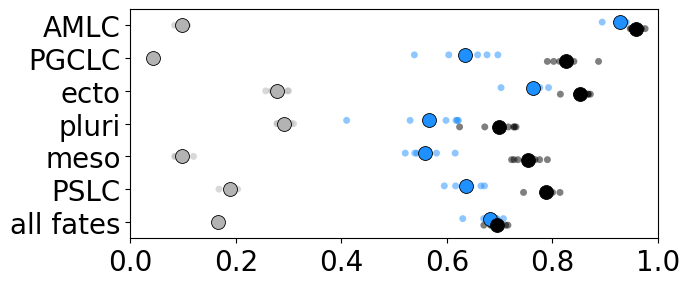

In [23]:
_, fate_names_raw = IIF.return_fates(results_log['data_b50_cluster'], thresh=thresh_posterior)
fate_names_list = [f for f in fate_names_raw if f != 'other']

cluster_category_list = [f for f in fate_names_list if f in np.unique(results_log['true_cluster'])]
perfold_records_cluster = IIF.compute_category_performance_perfold(
    results_log['true_cluster'], results_log['predicted_cluster'],
    results_log['data_b50_cluster']['Colony'].to_numpy(),
    cluster_category_list, aggregate_name='all fates'
)
perfold_df_cluster = pd.DataFrame(perfold_records_cluster)

labels_cluster = cluster_category_list + ['all fates']
IIF.plot_category_performance_perfold(perfold_df_cluster, labels_cluster,
    dataDir + '/Fig2/clusterbalaccf1_perfold_log_kmeans_B50.pdf')


In [24]:
def scatter_clusters(colony, cluster_labels, ms=1, legend=False, ax=None, cluster='all', imageCoordinates=False):
    """Scatter a colony's cells colored by externally-supplied cluster/fate labels (e.g. from
    k-means/GMM clustering, or sig2fate predictions run through such a clusterer) -- mirrors
    IIF.Colony.scatter_fates, but scatter_fates is hardcoded to call return_fates internally,
    so it can't be used for arbitrary cluster assignments. Falls back to magenta for any label
    not in colmap_fates (e.g. an 'unmatched_N' cluster from alignment). legend defaults to
    False here (unlike scatter_fates) since this is normally called once per panel in a
    multi-panel figure, where a legend on every panel would be redundant clutter."""
    data = colony.cellData['intensities']
    labels = cluster_labels.loc[data.index]
    label_names = sorted(labels.unique())

    if imageCoordinates:
        X = colony.cellData['XY']['X']
        Y = colony.cellData['XY']['Y']
    else:
        X = (colony.cellData['XY']['X'] - colony.center[0]) * colony.resolution
        Y = (colony.cellData['XY']['Y'] - colony.center[1]) * colony.resolution

    if ax is None:
        fig, ax = plt.subplots(1, 1)

    for c in label_names:
        idx = labels == c
        color = IIF.colmap_fates.get(c, [1, 0, 1, 1])

        if (cluster == 'all') or (cluster == c):
            ax.scatter(X[idx], Y[idx], color=color, s=ms, edgecolors='none')
        else:
            ax.scatter(X[idx], Y[idx], color='lightgray', s=ms, edgecolors='none')

    if legend:
        ax.legend(label_names)
    ax.set_aspect('equal')
    ax.axis('off')


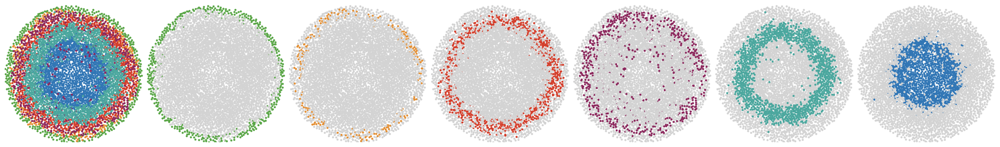

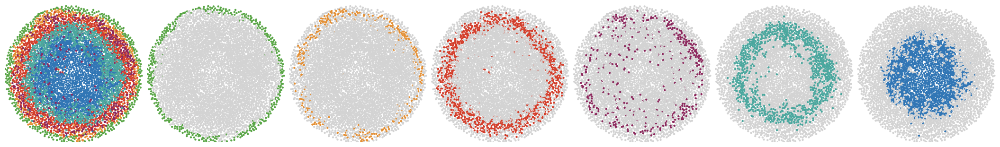

In [25]:
# scatter cells spatially, colored by k-means cluster (measured vs. sig2fate-predicted),
# one panel per cluster -- measured B50 data.

colID = 1
file_suffix = '.png'
lim = 350

cluster_labels_log = results_log['data_b50_cluster']['cluster_aligned']
predicted_cluster_log = pd.Series(results_log['predicted_cluster'], index=results_log['data_b50_cluster'].index)

fate_names_outsidein = ['AMLC', 'PGCLC', 'PSLC', 'meso', 'pluri', 'ecto']
n = len(fate_names_outsidein) + 1

os.makedirs(dataDir + '/Fig2', exist_ok=True)

for kind, labels_series in [('measured', cluster_labels_log), ('predicted', predicted_cluster_log)]:
    fig, ax = plt.subplots(1, n, figsize=(n*3, 3), constrained_layout=True)
    ms = 10

    scatter_clusters(col[colID], labels_series, ms=ms, ax=ax[0], cluster='all')
    ax[0].set_xlim([-lim, lim])
    ax[0].set_ylim([lim, -lim])
    ax[0].set_ylabel(f'log k-means ({kind})', fontsize=12)

    for i, f in enumerate(fate_names_outsidein):
        scatter_clusters(col[colID], labels_series, ms=ms, ax=ax[i+1], cluster=f)
        ax[i+1].set_xlim([-lim, lim])
        ax[i+1].set_ylim([lim, -lim])

    plt.savefig(dataDir + "/Fig2/" + f'scatter_log_kmeans_{kind}_' + conditions[0] + file_suffix)


### Confusion matrix

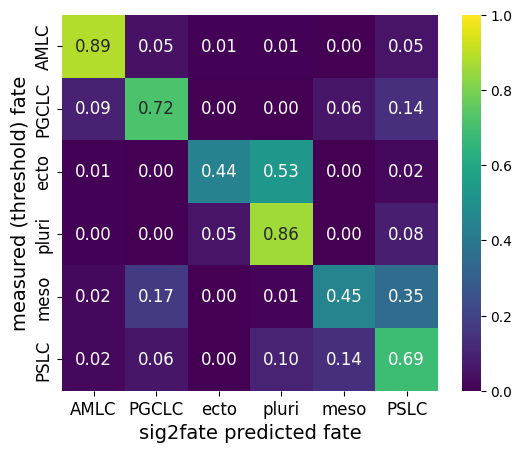

In [64]:
# SIG2FATE FATE PREDICTION CONFUSION MATRIX (B50 only)
# measured (threshold-based) fate vs. sig2fate's predicted fate
# 'other' (no clear fate call) is excluded based on the TRUE (measured) fate;
# sig2fate's predictions never produce 'other' either, so it's dropped as a column too

cond = 'B50'
k = (32,2,2)

data_cond = data[data['condition']==cond]
fates_true_all, fate_names_raw = IIF.return_fates(data_cond, thresh=thresh_posterior)
fate_order = [f for f in fate_names_raw if f != 'other']
keep = fates_true_all != 'other'
data_cond_scored = data_cond[keep]
fates_true = fates_true_all[keep]

pred_sub = pred_subs[k]['avg'].loc[data_cond_scored.index]
fates_pred, _ = IIF.return_fates(pred_sub, thresh=thresh_posterior)

confusion_counts = pd.crosstab(pd.Series(fates_true, index=data_cond_scored.index),
                                pd.Series(fates_pred, index=data_cond_scored.index))
confusion_counts = confusion_counts.reindex(index=fate_order, columns=fate_order, fill_value=0)

accuracy = np.trace(confusion_counts.values) / confusion_counts.values.sum()
confusion = confusion_counts.div(confusion_counts.sum(axis=1), axis=0)

fs = 14
fig, ax = plt.subplots(figsize=(0.6*len(fate_order)+2, 0.6*len(fate_order)+1))
sns.heatmap(confusion, annot=True, fmt='.2f', cmap='viridis', ax=ax, square=True,
            annot_kws={'fontsize': 12}, vmin=0, vmax=1)
ax.set_xlabel('sig2fate predicted fate', fontsize=fs)
ax.set_ylabel('measured (threshold) fate', fontsize=fs)
ax.tick_params(axis='both', labelsize=fs-2)
#ax.set_title(f'accuracy = {accuracy:.3f}', fontsize=fs-1)
plt.tight_layout()
plt.savefig(dataDir + '/Fig2/' + 'sig2fate_fate_confusion_matrix_B50.png', dpi=200, bbox_inches='tight')


In [67]:
pos_frac = pd.DataFrame({
    m: (data_cond_scored[m] > thresh_posterior[m]).groupby(fates_true).mean()
    for m in gene_names
}) * 100
pos_frac = pos_frac.reindex(fate_order).round(1)
pos_frac


,ISL1,GATA3,HAND1,CDX2,TFAP2C,SOX17,PRDM1,SNAI1,MIXL1,EOMES,TBXT,TBX6,OCT4,NANOG,SOX2,OTX2
AMLC,99.8,96.4,88.4,98.6,97.8,0.6,0.5,8.4,6.0,21.1,16.2,9.2,41.2,2.4,0.7,0.8
PGCLC,72.1,63.7,42.9,98.6,100.0,100.0,45.9,61.4,52.6,85.8,89.8,11.0,93.5,37.5,0.2,6.1
ecto,0.0,0.1,0.0,1.1,12.3,0.0,0.2,0.2,1.1,3.2,0.0,0.0,91.8,0.0,99.3,56.8
pluri,0.0,0.1,0.0,2.9,10.4,0.0,0.1,0.3,3.6,10.5,6.8,0.0,99.7,100.0,100.0,45.0
meso,6.2,8.4,25.2,99.3,8.3,5.4,2.7,98.0,98.4,99.4,100.0,100.0,88.0,4.1,4.8,76.6
PSLC,0.0,3.4,1.2,71.2,4.8,2.1,0.5,45.0,83.3,96.6,100.0,0.0,97.0,46.4,50.3,33.7


In [66]:
n_total = len(fates_true)

pct_true = pd.DataFrame({
    m: (data_cond_scored[m] > thresh_posterior[m]).groupby(fates_true).sum() / n_total * 100
    for m in gene_names
}).reindex(fate_order).round(1)

pct_pred = pd.DataFrame({
    m: (pred_sub[m] > thresh_posterior[m]).groupby(fates_pred).sum() / n_total * 100
    for m in gene_names
}).reindex(fate_order).round(1)

def add_totals(df):
    df = df.copy()
    df['Total'] = df.sum(axis=1)
    df.loc['Total'] = df.sum(axis=0)
    return df

pct_true = add_totals(pct_true)
pct_pred = add_totals(pct_pred)

pct_true
pct_pred



,ISL1,GATA3,HAND1,CDX2,TFAP2C,SOX17,PRDM1,SNAI1,MIXL1,EOMES,TBXT,TBX6,OCT4,NANOG,SOX2,OTX2,Total
AMLC,10.3,10.2,9.6,10.3,10.3,0.0,0.0,0.5,0.7,2.0,2.3,0.0,4.7,0.0,0.6,0.0,61.5
PGCLC,3.9,3.7,2.5,6.4,6.4,6.4,2.1,5.6,5.5,6.2,6.3,1.9,6.4,1.6,0.0,1.7,66.6
ecto,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.8,0.0,7.8,7.7,23.4
pluri,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.4,4.3,2.1,0.0,43.0,43.0,43.0,33.2,169.0
meso,0.0,0.0,0.4,7.4,0.2,0.1,0.0,7.4,7.4,7.4,7.4,7.4,7.4,0.0,0.1,7.2,59.8
PSLC,0.0,0.0,0.0,21.2,1.2,0.0,0.0,16.7,23.7,25.0,25.1,0.0,25.1,12.6,16.5,10.8,177.9
Total,14.2,13.9,12.5,45.3,18.2,6.5,2.1,30.2,37.7,44.9,43.2,9.3,94.4,57.2,68.0,60.6,558.2


## MI benchmarking (old)

### VIB performs worse with single gene prediction than MLP 

In [62]:
# VIB performs worse with single gene prediction than MLP 

from sklearn.neural_network import MLPRegressor

columns = list(itertools.product(signal_names, gene_names))
pred_df = pd.DataFrame(np.zeros((data_cond.shape[0], len(columns))), index=data_cond.index, columns=columns)

hyperparam = {'HIDDEN_DIM':32, 'N_LAYERS':2, 'LATENT_DIM': 2}

#for it in range(N_run):

# print(f"  Run {it}/{N_run}")
# start = time.time()
g = 'ISL1'
s = 'pSMAD1'

feat_names = [s]
tar_names = [g] # gene_names

# first predict each colony in B50 based on the other colonies
colony_idx = np.unique(data_cond['Colony'])
test_colony = [1,2,3]

# split data into test and train by colonies
train_colonies = np.setdiff1d(colony_idx, test_colony)
data_test = data_cond[data_cond['Colony'].isin(test_colony)]
data_train = data_cond[data_cond['Colony'].isin(train_colonies)]

feat_train = data_train[feat_names] # signal_names[:-1]
feat_test = data_test[feat_names]
tar_train = data_train[tar_names]
tar_test = data_test[tar_names]

if tar_train.ndim == 1:
    tar_train = tar_train.to_frame()

N_run = 1
for run in range(N_run):

    print('actual')
    print(g + ': ' + str(fns_plot.calc_MI_sklearn(tar_test[g].to_numpy(), feat_test[s].to_numpy())))
    
    # run VIB
    print('VIB')
    vib = IIF.VIB(feat_train, tar_train, hyperparam)
    _ = vib.train(verbose=False)
    tar_predict = vib.predict(feat_test)
    #print('total ' + str(fns_plot.calc_MI_sklearn(tar_test.to_numpy(), tar_predict.to_numpy())))
    print(g + ': ' + str(fns_plot.calc_MI_sklearn(tar_test[g].to_numpy(), tar_predict[g].to_numpy())))
    
    # run MLP
    print('MLP')
    mlp = MLPRegressor(hidden_layer_sizes=(32, 32), max_iter=500, random_state=42)
    mlp.fit(feat_train, tar_train.values.ravel())
    tar_predict_MLP = mlp.predict(feat_test)
    tar_predict_MLP = pd.DataFrame(tar_predict_MLP, index=tar_predict.index, columns=tar_predict.columns)
    #print('total ' + str(fns_plot.calc_MI_sklearn(tar_test.to_numpy(), tar_predict_MLP.to_numpy())))
    print(g + ': ' + str(fns_plot.calc_MI_sklearn(tar_test[g].to_numpy(), tar_predict_MLP[g].to_numpy())))

actual
ERROR! Session/line number was not unique in database. History logging moved to new session 1119
ISL1: 0.6781087049236151
VIB
ISL1: 0.5799826236881258
MLP
ISL1: 0.6788670133137018


### MI of one run, max MI of 5 runs, and mean MI of 5 runs look almost identical, MI of average prediction of 5 runs is slightly better

In [64]:
hyperparam = {'HIDDEN_DIM':32, 'N_LAYERS':2, 'LATENT_DIM': 2}

preds = {}
preds_on_train = {}
feat_names = signal_names
N_run = 5

for it in range(N_run):
    
    print(f"  Run {it}/{N_run}")
    start = time.time()
    
    preds[it] = {}
    preds_on_train[it] = {}
    
    for feat_name in feat_names:
        
        pred_df = pd.DataFrame(np.zeros((data_cond.shape[0], len(gene_names))), index=data_cond.index, columns=gene_names)
        pred_on_train_df = pd.DataFrame(np.zeros((data_cond.shape[0], len(gene_names))), index=data_cond.index, columns=gene_names)
        
        # first predict each colony in B50 based on the other colonies
        colony_idx = np.unique(data_cond['Colony'])
        for test_colony in colony_idx:
        
            print('B50 col: ' + str(test_colony))
            
            # split data into test and train by colonies
            train_colonies = np.setdiff1d(colony_idx, test_colony)
            data_test = data_cond[data_cond['Colony'].isin([test_colony])]
            data_train = data_cond[data_cond['Colony'].isin(train_colonies)]
        
            feat_train = data_train[[feat_name]] # signal_names[:-1]
            feat_test = data_test[[feat_name]]
            tar_train = data_train[gene_names]
            
            if tar_train.ndim == 1:
                tar_train = tar_train.to_frame()
            
            # run VIB
            vib = IIF.VIB(feat_train, tar_train, hyperparam)
            _ = vib.train(verbose=False)
            tar_predict = vib.predict(feat_test)
            pred_df.loc[tar_predict.index, tar_predict.columns] = tar_predict
            
            # test overfitting on one colony the training data (so the looping covers all colonies once)
            data_test_overfit = data_cond[data_cond['Colony'].isin([test_colony % 6 + 1])] # test_colony % 6 + 1 is the next colony cyclically
            feat_test_overfit = data_test_overfit[[feat_name]]
            tar_predict_overfit = vib.predict(feat_test_overfit)
            pred_on_train_df.loc[tar_predict_overfit.index, tar_predict_overfit.columns] = tar_predict_overfit

        preds[it][feat_name] = pred_df
        preds_on_train[it][feat_name] = pred_on_train_df
        
        pred_df.to_csv(dataDir + '/MI_pred/pred_' + feat_name + '_run' + str(it) + '.csv')
        pred_on_train_df.to_csv(dataDir + '/MI_pred/pred_ontrain_' + feat_name + '_run' + str(it) + '.csv')
    
    end = time.time()
    print(f"Elapsed time: {end - start} seconds")

  Run 0/5
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
Elapsed time: 427.20037865638733 seconds
  Run 1/5
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
B50 col: 1
B50 

In [ ]:
# Load preds and preds on train
preds = {}
preds_on_train = {}

for it in range(N_run):
    preds[it]          = {}
    preds_on_train[it] = {}
    
    for feat_name in feat_names:
        preds[it][feat_name] = pd.read_csv(
            dataDir + '/MI_pred/pred_' + feat_name + '_run' + str(it) + '.csv',
            index_col=0
        )
        preds_on_train[it][feat_name] = pd.read_csv(
            dataDir + '/MI_pred/pred_ontrain_' + feat_name + '_run' + str(it) + '.csv',
            index_col=0
        )

In [65]:
# CALCULATE MI

MI_knn = {}
MI_dec = {}
MI_dec_train = {}

for ti in range(N_run):
    
    MI_knn[ti] = pd.DataFrame(np.zeros((len(signal_names), len(gene_names))), index=signal_names, columns=gene_names)
    MI_dec[ti] = pd.DataFrame(np.zeros((len(signal_names), len(gene_names))), index=signal_names, columns=gene_names)
    MI_dec_train[ti] = pd.DataFrame(np.zeros((len(signal_names), len(gene_names))), index=signal_names, columns=gene_names)
    
    for s in signal_names:
        for g in gene_names:
            MI_dec[ti].loc[s,g] = fns_plot.calc_MI_sklearn(preds[ti][s][g].to_numpy(), data_cond[g].to_numpy())
            MI_dec_train[ti].loc[s,g] = fns_plot.calc_MI_sklearn(preds_on_train[ti][s][g].to_numpy(), data_cond[g].to_numpy())
            MI_knn[ti].loc[s,g] = fns_plot.calc_MI_sklearn(data_cond[s].to_numpy(), data_cond[g].to_numpy())

# MEAN across runs
MI_knn_mean = pd.concat(MI_knn.values()).groupby(level=0).mean()
MI_dec_mean = pd.concat(MI_dec.values()).groupby(level=0).mean()
MI_dec_train_mean = pd.concat(MI_dec_train.values()).groupby(level=0).mean()

# MAX across runs
MI_knn_max = pd.concat(MI_knn.values()).groupby(level=0).max()
MI_dec_max = pd.concat(MI_dec.values()).groupby(level=0).max()
MI_dec_train_max = pd.concat(MI_dec_train.values()).groupby(level=0).max()

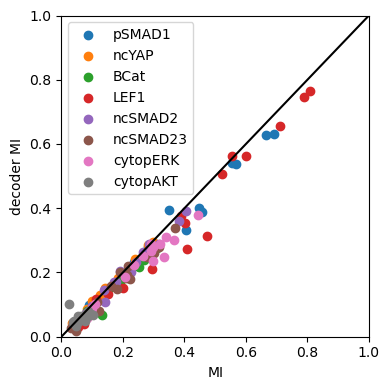

In [67]:
fig,ax = plt.subplots(1,1, figsize=(4,4))

for s in signal_names:
    ax.scatter(MI_knn_max.loc[s,:], MI_dec_max.loc[s,:])

ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.plot([0,1],[0,1],'k')
ax.set_xlabel('MI')
ax.set_ylabel('decoder MI')

plt.tight_layout()
plt.legend(signal_names, fontsize=10)
plt.savefig('FigS2/benchmark_decoder_MI_sigtoallfate_5runMImax.png')

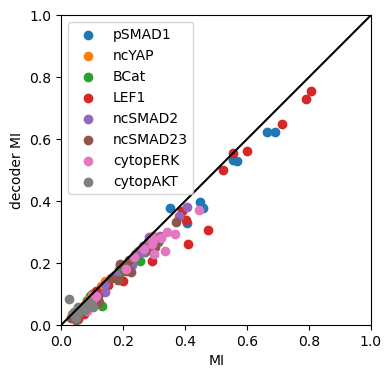

In [68]:
fig,ax = plt.subplots(1,1, figsize=(4,4))

for s in signal_names:
    ax.scatter(MI_knn_mean.loc[s,:], MI_dec_mean.loc[s,:])

ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.plot([0,1],[0,1],'k')
ax.set_xlabel('MI')
ax.set_ylabel('decoder MI')
ax.set_aspect('equal')
plt.tight_layout()
plt.legend(signal_names, fontsize=10)
plt.savefig('FigS2/benchmark_decoder_MI_sigtoallfate_5runMImean.png')

In [69]:
# calculate average prediction
preds_on_train_mean = {}
preds_mean = {}

# Get all feature names from first run
feat_names = preds_on_train[0].keys()

for feat_name in feat_names:
    
    # Collect DataFrames for this feature across all runs
    dfs_for_feat = [preds_on_train[it][feat_name] for it in range(N_run)]
    # Average them
    preds_on_train_mean[feat_name] = pd.concat(dfs_for_feat).groupby(level=0).mean()

    # Collect DataFrames for this feature across all runs
    dfs_for_feat = [preds[it][feat_name] for it in range(N_run)]
    # Average them
    preds_mean[feat_name] = pd.concat(dfs_for_feat).groupby(level=0).mean()

MI_knn_datamean = pd.DataFrame(np.zeros((len(signal_names), len(gene_names))), index=signal_names, columns=gene_names)
MI_dec_datamean = pd.DataFrame(np.zeros((len(signal_names), len(gene_names))), index=signal_names, columns=gene_names)
MI_dec_train_datamean = pd.DataFrame(np.zeros((len(signal_names), len(gene_names))), index=signal_names, columns=gene_names)

for s in signal_names:
    for g in gene_names:
        MI_dec_datamean.loc[s,g] = fns_plot.calc_MI_sklearn(preds_mean[s][g].to_numpy(), data_cond[g].to_numpy())
        MI_dec_train_datamean.loc[s,g] = fns_plot.calc_MI_sklearn(preds_on_train_mean[s][g].to_numpy(), data_cond[g].to_numpy())

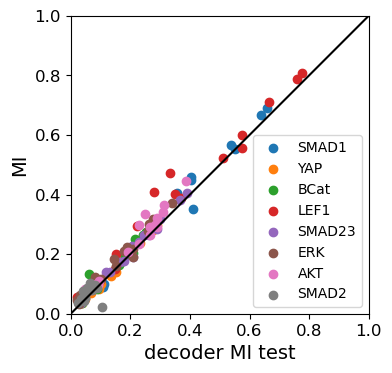

In [70]:
fig,ax = plt.subplots(1,1, figsize=(4,4))

for s in signal_names:
    ax.scatter(MI_dec_datamean.loc[s,:], MI_knn_mean.loc[s,:])

ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.plot([0,1],[0,1],'k')
ax.set_ylabel('MI', fontsize=14)
ax.set_xlabel('decoder MI test', fontsize=14)
ax.tick_params(axis='both', labelsize=12)
ax.set_aspect('equal')
plt.tight_layout()
plt.legend(signal_names_simplified, fontsize=10)
plt.savefig('FigS2/benchmark_decoder_MI_sigtoallfate_5rundatamean.pdf')

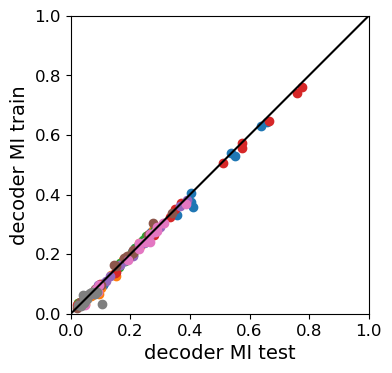

In [71]:
fig,ax = plt.subplots(1,1, figsize=(4,4))

for s in signal_names:
    ax.scatter(MI_dec_datamean.loc[s,:],MI_dec_train_mean.loc[s,:])

ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.plot([0,1],[0,1],'k')
ax.set_ylabel('decoder MI train', fontsize=14)
ax.set_xlabel('decoder MI test', fontsize=14)
ax.tick_params(axis='both', labelsize=12)
ax.set_aspect('equal')
plt.tight_layout()
#plt.legend(signal_names_simplified, fontsize=10)
plt.savefig('FigS2/benchmark_decoder_MI_test_v_train.pdf')

### MI all signals to all fate

In [74]:
hyperparam = {'HIDDEN_DIM':32, 'N_LAYERS':2, 'LATENT_DIM': 2}

data_cond = data[data['condition']=='B50']

preds_allsigs = {}
preds_allsigs_on_train = {}

feat_names = signal_names
N_run = 5

for it in range(N_run):
    
    print(f"  Run {it}/{N_run}")
    start = time.time()
    
    pred_df = pd.DataFrame(np.zeros((data_cond.shape[0], len(gene_names))), index=data_cond.index, columns=gene_names)
    pred_on_train_df = pd.DataFrame(np.zeros((data_cond.shape[0], len(gene_names))), index=data_cond.index, columns=gene_names)
    
    # first predict each colony in B50 based on the other colonies
    colony_idx = np.unique(data_cond['Colony'])
    for test_colony in colony_idx:
    
        print('B50 col: ' + str(test_colony))
        
        # split data into test and train by colonies
        train_colonies = np.setdiff1d(colony_idx, test_colony)
        data_test = data_cond[data_cond['Colony'].isin([test_colony])]
        data_train = data_cond[data_cond['Colony'].isin(train_colonies)]
    
        feat_train = data_train[feat_names] 
        feat_test = data_test[feat_names]
        tar_train = data_train[gene_names]
        
        if tar_train.ndim == 1:
            tar_train = tar_train.to_frame()
        
        # run VIB
        vib = IIF.VIB(feat_train, tar_train, hyperparam)
        _ = vib.train(verbose=False)
        tar_predict = vib.predict(feat_test)
        pred_df.loc[tar_predict.index, tar_predict.columns] = tar_predict
        
        # test overfitting on one colony the training data (so the looping covers all colonies once)
        data_test_overfit = data_cond[data_cond['Colony'].isin([test_colony % 6 + 1])] # test_colony % 6 + 1 is the next colony cyclically
        feat_test_overfit = data_test_overfit[feat_names]
        tar_predict_overfit = vib.predict(feat_test_overfit)
        pred_on_train_df.loc[tar_predict_overfit.index, tar_predict_overfit.columns] = tar_predict_overfit

    preds_allsigs[it] = pred_df
    preds_allsigs_on_train[it] = pred_on_train_df
        
    pred_df.to_csv(dataDir + '/MI_pred_all/pred_allsigs_run' + str(it) + '.csv')
    pred_on_train_df.to_csv(dataDir + '/MI_pred_all/pred_ontrain_allsigs_run' + str(it) + '.csv')
    
    end = time.time()
    print(f"Elapsed time: {end - start} seconds")

  Run 0/5
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
Elapsed time: 53.26842403411865 seconds
  Run 1/5
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
Elapsed time: 65.46961450576782 seconds
  Run 2/5
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
Elapsed time: 54.886380195617676 seconds
  Run 3/5
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
Elapsed time: 55.92251896858215 seconds
  Run 4/5
B50 col: 1
B50 col: 2
B50 col: 3
B50 col: 4
B50 col: 5
B50 col: 6
Elapsed time: 52.798824071884155 seconds


In [76]:
# RELOAD RUNS

preds_allsigs = {}
preds_allsigs_on_train = {}

feat_names = signal_names
N_run = 5

for it in range(N_run):
    
    pred_df = pd.read_csv(dataDir + '/MI_pred_all/pred_allsigs_run' + str(it) + '.csv', index_col=0)
    pred_on_train_df = pd.read_csv(dataDir + '/MI_pred_all/pred_ontrain_allsigs_run' + str(it) + '.csv', index_col=0)
    
    preds_allsigs[it] = pred_df
    preds_allsigs_on_train[it] = pred_on_train_df

In [77]:
# calculate average prediction

feat_names = signal_names

# Collect DataFrames for this feature across all runs
dfs_for_feat = [preds_allsigs_on_train[it] for it in range(N_run)]
# Average them
preds_on_train_mean = pd.concat(dfs_for_feat).groupby(level=0).mean()

# Collect DataFrames for this feature across all runs
dfs_for_feat = [preds_allsigs[it] for it in range(N_run)]
# Average them
preds_mean = pd.concat(dfs_for_feat).groupby(level=0).mean()

MI_dec_allsigs_datamean = pd.DataFrame(np.zeros((1, len(gene_names))), index=['all signals'], columns=gene_names)
MI_dec_allsigs_train_datamean = pd.DataFrame(np.zeros((1, len(gene_names))), index=['all signals'], columns=gene_names)

for g in gene_names:
    MI_dec_allsigs_datamean.loc[0,g] = fns_plot.calc_MI_sklearn(preds_mean[g].to_numpy(), data_cond[g].to_numpy())
    MI_dec_allsigs_train_datamean.loc[0,g] = fns_plot.calc_MI_sklearn(preds_on_train_mean[g].to_numpy(), data_cond[g].to_numpy())

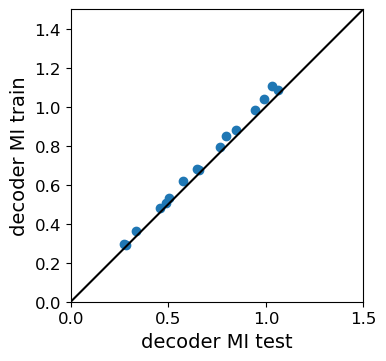

In [78]:
fig,ax = plt.subplots(1,1, figsize=(4,4))

ax.scatter(MI_dec_allsigs_datamean.loc[0,:],MI_dec_allsigs_train_datamean.loc[0,:])

xmax=1.5
ax.set_xlim(0,xmax)
ax.set_ylim(0,xmax)
ax.plot([0,xmax],[0,xmax],'k')
ax.set_ylabel('decoder MI train', fontsize=14)
ax.set_xlabel('decoder MI test', fontsize=14)
ax.tick_params(axis='both', labelsize=12)
ax.set_aspect('equal')
plt.tight_layout()
#plt.legend(signal_names_simplified, fontsize=10)
plt.savefig('FigS2/benchmark_decoder_MI_allsigs_test_v_train.pdf')

## Generate panels for main figure

In [7]:
# CONVERT DATA INTO EXPERIMENT AND COLONY OBJECTS
col = dict();
for colID in np.unique(data['Colony']):
    col[colID] = IIF.Colony(data[data['Colony']==colID], colID, meta, features=feature_names, nominalRadius=350);
    col[colID].calcRadialProfiles(cellsPerBin=100, overlap=0, dr=8)
    col[colID].calcPosError(sigma=1)

exp = IIF.MPexperiment(col, meta);
exp.calcRadialProfiles(cellsPerBin=100, overlap=0)

B50, Nbins = 304
B200, Nbins = 288
B10, Nbins = 252


In [12]:
# GENES PREDICTED

col_pred = dict()
for colIDp in np.unique(data['Colony']):
    col_pred[colIDp] = IIF.Colony(pred_subs[(32,2,2)]['avg'][pred_subs[(32,2,2)]['avg']['Colony']==colIDp], colIDp, meta, features=feature_names, nominalRadius=350)
    col_pred[colIDp].calcRadialProfiles(cellsPerBin=100, overlap=0, dr=8)
    col_pred[colIDp].calcPosError(sigma=1)

exp_pred = IIF.MPexperiment(col_pred, meta)
exp_pred.calcRadialProfiles(cellsPerBin=100, overlap=0)


B50, Nbins = 304
B200, Nbins = 288
B10, Nbins = 252


In [13]:
## RELOAD PERFORMANCES
feat_names = signal_names
performances = {}

for cond in conditions:
    performances[cond] = pd.read_csv(dataDir + '/Fig2/performance_opt_VIB_' + str(len(feat_names)) + 'D_'+cond+'.csv', index_col=0)

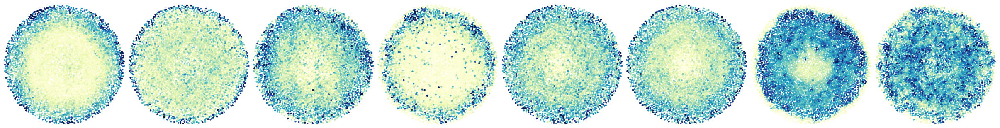

In [14]:
# SIGNALS EXPERIMENT
file_suffix = '.png'
colID = 1


m = 1
n = len(signal_names)
fs = 20
ms = 10
plotlegend = False;
lim = 350

fig, ax = plt.subplots(m,n, figsize=(n*3,m*3), constrained_layout=True)

for i,sig in enumerate(signal_names):
    
    col[colID].scatter(sig, ms=ms, ax=ax[i])
    ax[i].set_xlim([-lim,lim])
    ax[i].set_ylim([lim,-lim])

plt.savefig(dataDir+"/Fig2/" + 'signals' + '_' + conditions[0] + file_suffix)

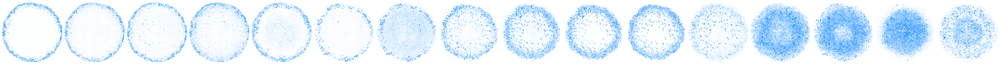

In [75]:
# GENES EXPERIMENT

colID = 1

n = len(gene_names)
fig, ax = plt.subplots(m,n, figsize=(n*3,m*3), constrained_layout=True)
vlim = dict()
white_blue = mcolors.LinearSegmentedColormap.from_list('white_blue', ['white','dodgerblue'])

for i,f in enumerate(gene_names):

    vlim[f] = col[colID].scatter(f, ms=ms, ax=ax[i], tol=(1,99), cmap=white_blue)
    ax[i].set_xlim([-lim,lim])
    ax[i].set_ylim([lim,-lim])

plt.savefig(dataDir+"/Fig2/" + 'markers' + '_' + conditions[0] + file_suffix)

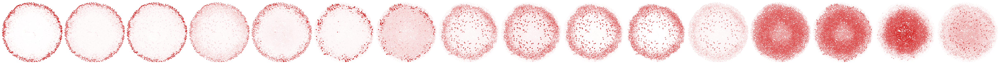

In [76]:
colID = 1
n = len(gene_names)

fig, ax = plt.subplots(m,n, figsize=(n*3,m*3), constrained_layout=True)
white_red = mcolors.LinearSegmentedColormap.from_list('white_red', ['white',[0.8, 0, 0]])

for i,f in enumerate(gene_names):
    
    col_pred[colID].scatter(f, ms=ms, vmin=vlim[f][0], vmax=vlim[f][1],  ax=ax[i], cmap=white_red)
    ax[i].set_xlim([-lim,lim])
    ax[i].set_ylim([lim,-lim])

plt.savefig(dataDir+"/Fig2/" + 'markers_predicted_' + '_' + conditions[0] + file_suffix)

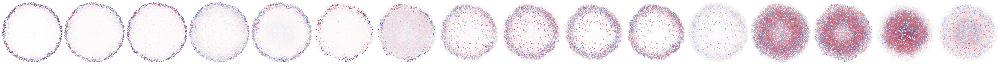

In [77]:
from matplotlib.colors import LinearSegmentedColormap

colID=1

X = (col[colID].cellData['XY']['X'] - col[colID].center[0])*col[colID].resolution
Y = (col[colID].cellData['XY']['Y'] - col[colID].center[1])*col[colID].resolution

# Create custom colormap
#white_red = LinearSegmentedColormap.from_list('white_red', [(0,'white'),(0.3,'yellow'),(0.6,'green'),(1,'red')])
#white_blue = LinearSegmentedColormap.from_list('white_blue', [(0,'white'),(0.3,'yellow'),(0.6,'green'),(1,'blue')])


n = len(gene_names)
fig, ax = plt.subplots(m,n, figsize=(n*3,m*3), constrained_layout=True)

for i,f in enumerate(gene_names):
    
    color = col[colID].cellData['intensities'][f]
    color_pred = col_pred[colID].cellData['intensities'][f]
    order = color.sort_values().index
    ax[i].scatter(X[order], Y[order], s=ms, c=color[order], cmap=white_blue, vmin=vlim[f][0], vmax=vlim[f][1], alpha=1, edgecolors='none')
    ax[i].scatter(X[order], Y[order], s=ms, c=color_pred[order], cmap=white_red, vmin=vlim[f][0], vmax=vlim[f][1], alpha=0.5, edgecolors='none')
    
    # idx = col[colID].cellData['intensities'][f] > thresh[f]
    # ax[i].scatter(X[idx], Y[idx], s=ms, c='b', alpha=0.3)
    #idx = col_pred[colID].cellData['intensities'][f] > thresh[f]
    #ax[i].scatter(X[idx], Y[idx], s=ms, c='r', alpha=0.3)
    
    ax[i].set_aspect('equal') 
    ax[i].axis('off')
    ax[i].set_xlim([-lim,lim])
    ax[i].set_ylim([lim,-lim])

plt.savefig(dataDir+"/Fig2/" + 'markers_overlay_' + '_' + conditions[0] + file_suffix)

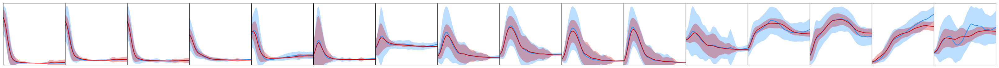

In [78]:
colID = 1
n = len(gene_names)

fig, ax = plt.subplots(m,n, figsize=(n*2,m*2))
mode = 'cells'

for i,f in enumerate(gene_names):
    
    exp.plotRadialProfiles(f, 'B50', mode=mode, sigma=1, color='dodgerblue', ax=ax[i])
    exp_pred.plotRadialProfiles(f, 'B50', mode=mode, sigma=1, color=[0.8, 0, 0], ax=ax[i])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_ylabel(None)
    ax[i].set_xlabel(None)

plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)

plt.savefig(dataDir+"/Fig2/" + 'profile_expvpred_' + conditions[0] + '_std' + mode + file_suffix)#, bbox_inches='tight')

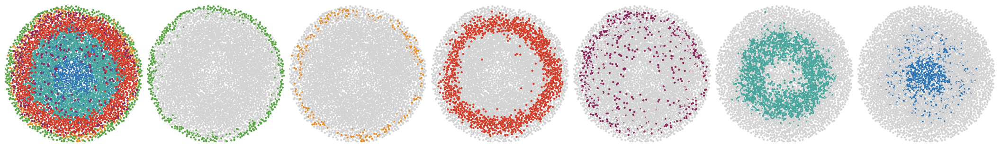

In [79]:
colID = 1
file_suffix = '.png'
#fates, fate_names = IIF.return_fates(data_cond, thresh=thresh)

fate_names_outsidein = ['AMLC', 'PGCLC', 'PSLC', 'meso', 'pluri', 'ecto']
n = len(fate_names_outsidein) + 1

fig, ax = plt.subplots(m,n, figsize=(n*3,m*3), constrained_layout=True)
ms = 10

col[colID].scatter_fates(ms=ms, thresh=thresh_posterior, legend=False, ax=ax[0]) 
ax[0].set_xlim([-lim,lim])
ax[0].set_ylim([lim,-lim])

for i,f in enumerate(fate_names_outsidein):
    fates = col[colID].scatter_fates(ms=ms, thresh=thresh_posterior, legend=False, ax=ax[i+1], fate=f) 
    ax[i+1].set_xlim([-lim,lim])
    ax[i+1].set_ylim([lim,-lim])

plt.savefig(dataDir+"/Fig2/" + 'fates_scatter_' + conditions[0] + file_suffix)

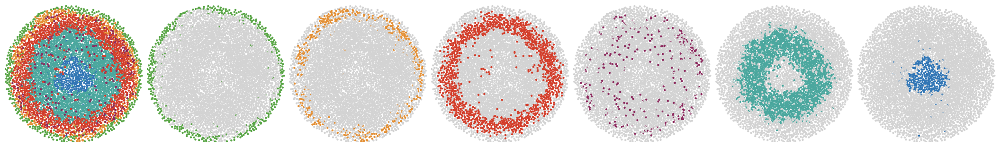

In [80]:
colID = 1
n = len(fate_names_outsidein) + 1

fig, ax = plt.subplots(m,n, figsize=(n*3,m*3), constrained_layout=True)
ms = 10

col_pred[colID].scatter_fates(ms=ms, thresh=thresh_posterior, legend=False, ax=ax[0]) 
ax[0].set_xlim([-lim,lim])
ax[0].set_ylim([lim,-lim])

for i,f in enumerate(fate_names_outsidein):
    fates = col_pred[colID].scatter_fates(ms=ms, thresh=thresh_posterior, legend=False, ax=ax[i+1], fate=f) 
    ax[i+1].set_xlim([-lim,lim])
    ax[i+1].set_ylim([lim,-lim])

plt.savefig(dataDir+"/Fig2/" + 'fates_pred_scatter_' + conditions[0] + file_suffix)

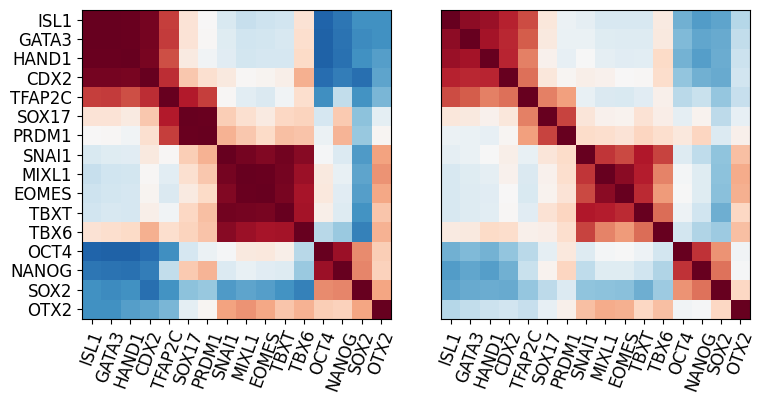

In [81]:
# correlations 
def calc_pearsoncorr(x1,x2): #only feature can be discrete
    from scipy.stats import pearsonr
    X1 = x1.to_numpy()
    X2 = x2.to_numpy()
    
    indices = (~np.isnan(X1)*~np.isnan(X2))
    
    corr = pearsonr(X1[indices].reshape(-1, 1)[:,0],X2[indices])
    return corr
    
fig_size = [8,4]  
fs2 = 12
params = {
          'figure.figsize': fig_size,
          'xtick.labelsize': fs2,
          'ytick.labelsize': fs2,
          }
plt.rcParams.update(params)

N_var = len(gene_names)

Corr_all = np.zeros((N_var,N_var,2))

for k1,g1 in enumerate(gene_names):
    for k2, g2 in enumerate(gene_names):
        Corr_all[k1,k2,0],_ = calc_pearsoncorr(data.loc[:,g1], data.loc[:,g2])
        Corr_all[k1,k2,1],_ = calc_pearsoncorr(avg_pred.loc[:,g1], avg_pred.loc[:,g2])


H,W = 1,2

plt.figure()
plt.subplot(H,W,1)
#plt.title('predicted')
plt.imshow(Corr_all[:,:,1],vmin=-1,vmax=1,cmap='RdBu_r')
#plt.colorbar()

plt.xticks(np.arange(0,N_var),labels=gene_names,rotation=70)
#plt.xticks([])
plt.yticks(np.arange(0,N_var),labels=gene_names,fontsize=fs2)


plt.subplot(H,W,2)
#plt.title('measured')
plt.imshow(Corr_all[:,:,0],vmin=-1,vmax=1,cmap='RdBu_r')
#plt.colorbar()

plt.xticks(np.arange(0,N_var),labels=gene_names,rotation=70)
#plt.yticks(np.arange(0,N_var),labels=names)
plt.yticks([])

plt.tight_layout()

plt.savefig(dataDir+"/Fig2/" + 'g1g2_corr_matrix_VIB_' + cond + '.pdf')

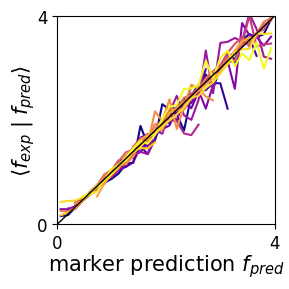

In [82]:
cond = 'B50'
data_cond = data[data['condition']==cond]
pred_cond = avg_pred.loc[avg_pred['condition']==cond]

common_idx = data_cond.index.intersection(pred_cond.index)
data_cond = data_cond.loc[common_idx]
pred_cond = pred_cond.loc[common_idx]

features = gene_names
data_cond_norm = data_cond[features].copy()
pred_cond_norm = pred_cond[features].copy()

for f in features:
    data_cond_norm[f] = data_cond_norm[f]/thresh[f]
    pred_cond_norm[f] = pred_cond_norm[f]/thresh[f]

tar_test = data_cond_norm.to_numpy()
target_predict = pred_cond_norm.to_numpy()

# conditional average
N_bins = 30
min_val = 0
max_val = 4

N_genes = len(gene_names)
hist_av_all = np.zeros((N_genes,N_bins))
hist_var_all = np.zeros((N_genes,N_bins))
hist_cond_av_all = np.zeros((N_genes,N_bins,N_bins))

for kg in range(0, N_genes):
    bins,hist,hist_cond,hist_av,hist_var = fns_plot.calc_prediction_hist(tar_test[:,kg], target_predict[:,kg], N_bins, min_val, max_val)

    hist_av_all[kg,:] = hist_av
    hist_var_all[kg,:] = hist_var
    hist_cond_av_all[kg,:,:] = hist_cond

fig_size = [3,3]   
params = {
          'figure.figsize': fig_size,
          }
plt.rcParams.update(params)

plt.figure()

for kg in range(0, N_genes):
    plt.plot(bins,hist_av_all[kg,:],'-',color=fns_plot.return_colmaps('genes',N_var=N_genes)[kg])

plt.plot([0,1e5],[0,1e5],'-',color='k',lw=1)

plt.xlim([min_val,max_val])
plt.ylim([min_val,max_val])

plt.xticks([min_val,max_val])
plt.yticks([min_val,max_val])

plt.xlabel(r'marker prediction $f_{pred}$', fontsize=15,labelpad=0)
plt.ylabel(r'$\langle f_{exp}\hspace{0.3}| \hspace{0.3}f_{pred} \rangle$', fontsize=15,labelpad=0)
plt.tight_layout()

plt.savefig(dataDir+"/Fig2/" + 'conditional_average_' + cond + '.pdf')    

marker_avg | f1_rand = 0.320
marker_avg | f1 = 0.787
marker_avg | balanced_accuracy = 0.839


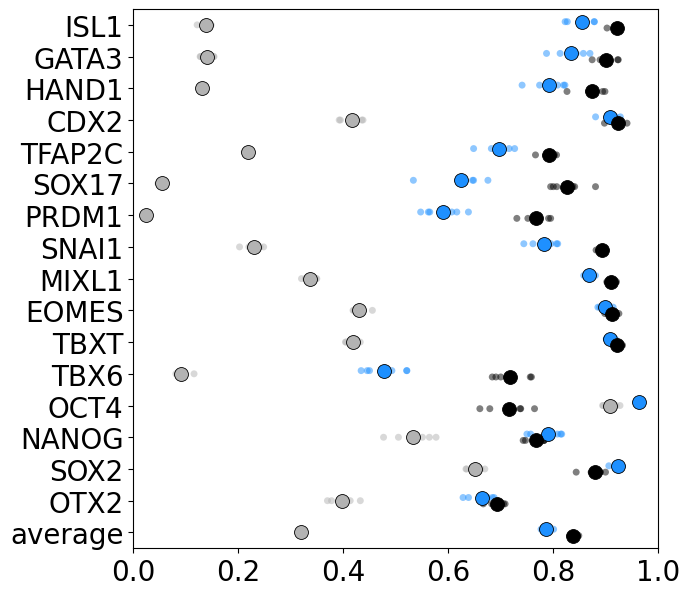

In [84]:
# plot f1 and balanced accuracy per gene for Nhid=32, Nlay=2, Ldim=2 -- individual folds as dots

cond = 'B50'
labels = gene_names + ['marker_avg']
k = (32,2,2)

data_cond = data[data['condition']=='B50']
fates_cond_all, _ = IIF.return_fates(data_cond, thresh=thresh_posterior)
keep = fates_cond_all != 'other'
data_cond_scored = data_cond[keep]

pred_sub = pred_subs_compare[k]['avg'].loc[data_cond_scored.index]

perfold_df_single_bal = IIF.compute_marker_performance_perfold(
    data_cond_scored, pred_sub, data_cond_scored['Colony'].to_numpy(), gene_names, thresh_posterior)
perfold_df_single_bal = IIF.add_group_avg(perfold_df_single_bal, ['f1_rand', 'f1', 'balanced_accuracy'],
                                           group_col='gene', avg_label='marker_avg')

IIF.plot_category_performance_perfold(
    perfold_df_single_bal, labels,
    dataDir + '/Fig2/markerbalaccf1_perfold_VIB_' + str(len(feat_names)) + 'D_B50_' + cond + '_Nhid' + str(k[0]) + '_Nlay' + str(k[1]) + '_Ldim' + str(k[2]) + '.pdf',
    group_col='gene', tick_labels=labels[:-1] + ['average'])


all fates | f1_rand = 0.167
all fates | f1 = 0.663
all fates | balanced_accuracy = 0.674


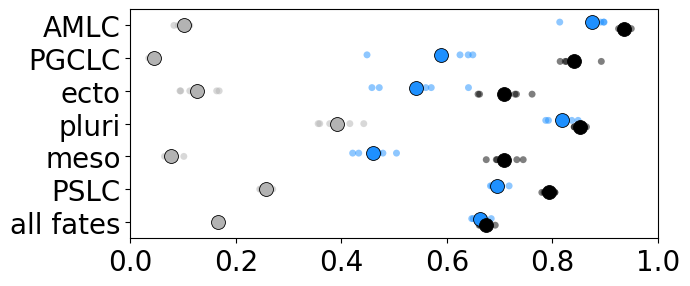

In [86]:
cond = 'B50'
k = (32,2,2)

data_cond = data[data['condition']=='B50']
fates_cond_all, fate_names_raw = IIF.return_fates(data_cond, thresh=thresh_posterior)
fate_names_list = [f for f in fate_names_raw if f != 'other']
keep = fates_cond_all != 'other'
data_cond_scored = data_cond[keep]
fates_cond = fates_cond_all[keep]

pred_sub = pred_subs_compare[k]['avg'].loc[data_cond_scored.index]
fates_pred_all, _ = IIF.return_fates(pred_sub, thresh=thresh_posterior)

perfold_records = IIF.compute_category_performance_perfold(fates_cond, fates_pred_all, data_cond_scored['Colony'].to_numpy(),
                                            fate_names_list, aggregate_name='all fates')
perfold_df_fate = pd.DataFrame(perfold_records)

labels = fate_names_list + ['all fates']
IIF.plot_category_performance_perfold(perfold_df_fate, labels,
    dataDir + '/Fig2/fatebalaccf1_perfold_VIB_' + str(len(feat_names)) + 'D_B50_' + cond + '_Nhid' + str(k[0]) + '_Nlay' + str(k[1]) + '_Ldim' + str(k[2]) + '.pdf')


In [88]:
from sklearn.metrics import accuracy_score

all_fates_acc = np.mean([accuracy_score(fates_cond[(data_cond_scored['Colony']==c).to_numpy()],
                                          fates_pred_all[(data_cond_scored['Colony']==c).to_numpy()])
                          for c in np.unique(data_cond_scored['Colony'])])
all_fates_bal_acc = perfold_df_fate[perfold_df_fate['category']=='all fates']['balanced_accuracy'].mean()

print(f'all fates: accuracy={all_fates_acc:.3f}, balanced accuracy={all_fates_bal_acc:.3f}')

all fates: accuracy=0.726, balanced accuracy=0.674


## Fig S3

In [150]:
cond = 'B50'

metricdist_full = data_cond['CircleEdgeDist'].to_numpy()
r_max = 350
file_suffix = '.png'

fs = 11
fs2 = 9
params = {
    'font.size': fs,
    'xtick.labelsize': fs2,
    'ytick.labelsize': fs2,
}
plt.rcParams.update(params)

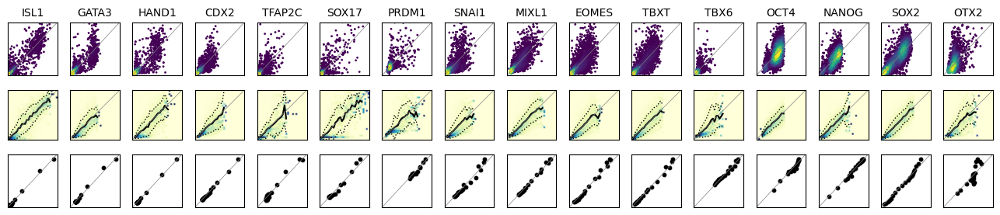

In [151]:
# ============= FIGURE 1: GENE-BY-GENE OVERVIEW =============

mar = 0.001
margin_left = mar
margin_right = mar
margin_bottom = mar
margin_top = 1 - 0.2
hspace = mar
wspace = mar

lim = 360
ms = 0.15

H, W = 9, N_genes
fig_size = [13, 8]
fs2 = 6
params = {
    'figure.figsize': fig_size,
    'xtick.labelsize': fs2,
    'ytick.labelsize': fs2,
}
plt.rcParams.update(params)

ticks_on = 0

fig = plt.figure()
chrt = 0
fig.subplots_adjust(left=margin_left, bottom=margin_bottom, right=1 - margin_right, 
                    top=margin_top, wspace=wspace, hspace=hspace)

# Row 1: Density scatter plots
corrs = np.zeros((N_genes, 2))
for kg in range(0, N_genes):
    chrt += 1
    plt.subplot(H, W, chrt)
    plt.title(gene_names[kg], fontsize=10)
    
    N_max = target_predict.shape[0]
    N_plot = min(4000, N_max)
    indices = np.random.randint(0, N_max, N_plot)
    fns_plot.scatter_density(target_predict[indices, kg], tar_test[indices, kg])
    
    corrs[kg, 0], _ = fns_plot.calc_pearsoncorr(target_predict[:, kg], tar_test[:, kg])
    corrs[kg, 1], _ = fns_plot.calc_spearmancorr(target_predict[:, kg], tar_test[:, kg])
    
    max_val_kg = np.nanpercentile(tar_test[indices, kg], 99.9)
    
    plt.plot([0, max_val_kg], [0, max_val_kg], '-', color='grey', lw=0.5)
    
    plt.xlim([min_val, max_val_kg])
    plt.ylim([min_val, max_val_kg])
    
    if ticks_on:
        plt.xticks([min_val, max_val_kg])
        plt.yticks([min_val, max_val_kg])
    else:
        plt.xticks([])
        plt.yticks([])

# Row 2: Conditional histograms
N_bins = 30
for kg in range(0, N_genes):
    chrt += 1
    plt.subplot(H, W, chrt)
    
    max_val_kg = np.nanpercentile(tar_test[:, kg], 99.9)
    
    bins, hist, hist_cond, hist_av, hist_var = fns_plot.calc_prediction_hist(
        tar_test[:, kg], target_predict[:, kg], N_bins, min_val, max_val_kg
    )
    
    plt.imshow(np.rot90(hist_cond, k=1), extent=[min_val, max_val_kg, min_val, max_val_kg],
               cmap='YlGnBu', vmin=0, vmax=0.4)
    
    plt.plot(bins, hist_av, '-k', lw=1.5)
    plt.plot(bins, hist_av - np.sqrt(hist_var), ':k', lw=1)
    plt.plot(bins, hist_av + np.sqrt(hist_var), ':k', lw=1)
    
    plt.plot([0, max_val_kg], [0, max_val_kg], '-', color='grey', lw=0.5)
    
    plt.xlim([min_val, max_val_kg])
    plt.ylim([min_val, max_val_kg])
    
    if ticks_on:
        plt.xticks([min_val, max_val_kg])
        plt.yticks([min_val, max_val_kg])
    else:
        plt.xticks([])
        plt.yticks([])

# Row 3: Radial profile comparison
# For this, we need to pick a representative colony. Use all data reshaped.
# Since data is already flattened, we'll use the full dataset
N_bins_x = 20
radial_av_all = np.zeros((N_genes, N_bins_x, 2))

for kg in range(0, N_genes):
    chrt += 1
    plt.subplot(H, W, chrt)
    
    # Reshape for calc_profile_meanvar: expects (N_sys, N_cells, N_var)
    bins_x, mean_x_expt, var_x, P_x = fns_plot.calc_profile_meanvar(
        tar_test[:, kg][np.newaxis, :, np.newaxis],
        metricdist_full[np.newaxis, :, np.newaxis],
        N_bins_x, r_max
    )
    radial_av_all[kg, :, 0] = mean_x_expt[:, 0]
    
    bins_x, mean_x_sim, var_x, P_x = fns_plot.calc_profile_meanvar(
        target_predict[:, kg][np.newaxis, :, np.newaxis],
        metricdist_full[np.newaxis, :, np.newaxis],
        N_bins_x, r_max
    )
    radial_av_all[kg, :, 1] = mean_x_sim[:, 0]
    
    max_val_rad = 1.1 * np.nanmax(mean_x_expt)
    
    plt.plot([0, max_val_rad], [0, max_val_rad], '-', color='grey', lw=0.5)
    plt.scatter(mean_x_sim, mean_x_expt, color='k', s=10)
    
    plt.xlim([min_val, max_val_rad])
    plt.ylim([min_val, max_val_rad])
    
    if ticks_on:
        plt.xticks([min_val, max_val_rad])
        plt.yticks([min_val, max_val_rad])
    else:
        plt.xticks([])
        plt.yticks([])

plt.tight_layout()
plt.savefig(dataDir+"/FigS3/" + 'SI_fig_genes_cont_overview_VIB2D_' + cond + file_suffix, dpi=150, bbox_inches='tight')

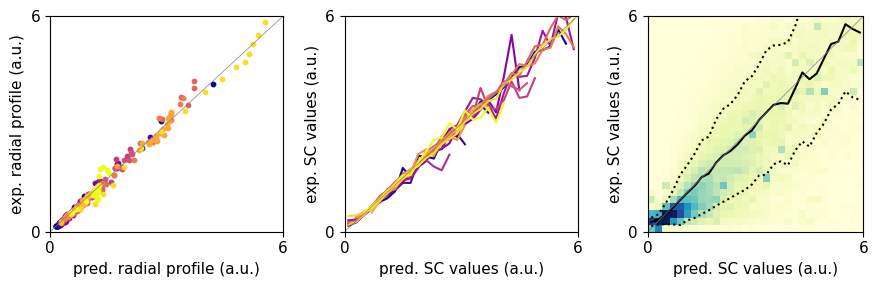

In [97]:
# ============= FIGURE 2: SUMMARY PLOTS =============

fs2 = 11
fig_size = [9, 3]
params = {
    'figure.figsize': fig_size,
    'font.size': fs,
    'xtick.labelsize': fs2,
    'ytick.labelsize': fs2,
}
plt.rcParams.update(params)

H, W = 1, 3
ticks_on = 1
max_val = 6

plt.figure()

# Panel 1: Radial profile scatter (all genes)
plt.subplot(H, W, 1)
for kg in range(0, N_genes):
    plt.scatter(radial_av_all[kg, :, 1], radial_av_all[kg, :, 0], s=10,
                color=fns_plot.return_colmaps('genes', N_var=N_genes)[kg])

plt.plot([0, 1e5], [0, 1e5], '-', color='grey', lw=0.5)

plt.xlim([min_val, max_val])
plt.ylim([min_val, max_val])

if ticks_on:
    plt.xticks([min_val, max_val])
    plt.yticks([min_val, max_val])
else:
    plt.xticks([])
    plt.yticks([])

plt.xlabel('pred. radial profile (a.u.)')
plt.ylabel('exp. radial profile (a.u.)')

# Panel 2: Conditional binned averages (all genes)
plt.subplot(H, W, 2)

# Analyze with same binning
N_bins = 30
hist_av_all = np.zeros((N_genes, N_bins))
hist_var_all = np.zeros((N_genes, N_bins))
hist_cond_av_all = np.zeros((N_genes, N_bins, N_bins))

max_val = 6
for kg in range(0, N_genes):
    bins, hist, hist_cond, hist_av, hist_var = fns_plot.calc_prediction_hist(
        tar_test[:, kg], target_predict[:, kg], N_bins, min_val, max_val
    )
    
    hist_av_all[kg, :] = hist_av
    hist_var_all[kg, :] = hist_var
    hist_cond_av_all[kg, :, :] = hist_cond

for kg in range(0, N_genes):
    plt.plot(bins, hist_av_all[kg, :], '-',
             color=fns_plot.return_colmaps('genes', N_var=N_genes)[kg])

plt.plot([0, 1e5], [0, 1e5], '-', color='grey', lw=0.5)

plt.xlim([min_val, max_val])
plt.ylim([min_val, max_val])

if ticks_on:
    plt.xticks([min_val, max_val])
    plt.yticks([min_val, max_val])
else:
    plt.xticks([])
    plt.yticks([])

plt.xlabel('pred. SC values (a.u.)')
plt.ylabel('exp. SC values (a.u.)')

# Panel 3: Averaged conditional histogram
plt.subplot(H, W, 3)

plt.imshow(np.rot90(np.nanmean(hist_cond_av_all, axis=0), k=1),
           extent=[min_val, max_val, min_val, max_val], cmap='YlGnBu', vmin=0, vmax=0.3)

hist_av_all_av = np.nanmean(hist_av_all, axis=0)
hist_var_all_av = np.nanmean(hist_var_all, axis=0)

plt.plot(bins, hist_av_all_av, '-k')
plt.plot(bins, hist_av_all_av - np.sqrt(hist_var_all_av), ':k')
plt.plot(bins, hist_av_all_av + np.sqrt(hist_var_all_av), ':k')

plt.plot([0, 1e5], [0, 1e5], '-', color='grey', lw=0.5)

plt.xlim([min_val, max_val])
plt.ylim([min_val, max_val])

if ticks_on:
    plt.xticks([min_val, max_val])
    plt.yticks([min_val, max_val])
else:
    plt.xticks([])
    plt.yticks([])

plt.xlabel('pred. SC values (a.u.)')
plt.ylabel('exp. SC values (a.u.)')

plt.tight_layout()
plt.savefig(dataDir+"/FigS3/" + 'SI_fig_av_sg_VIB2D_' + cond + file_suffix)

plt.show()

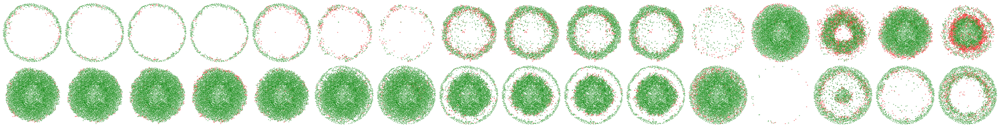

In [100]:
m = 2
n = len(gene_names)
ms = 10
colID=1

X = (col[colID].cellData['XY']['X'] - col[colID].center[0])*col[colID].resolution
Y = (col[colID].cellData['XY']['Y'] - col[colID].center[1])*col[colID].resolution

n = len(gene_names)
fig, ax = plt.subplots(m,n, figsize=(n*3,m*3), constrained_layout=True)

for i,f in enumerate(gene_names):

    pos = col[colID].cellData['intensities'][f] > thresh[f]
    pred_pos = col_pred[colID].cellData['intensities'][f] > thresh[f]

    true_pos = pred_pos & pos
    false_pos = pred_pos & ~pos
    true_neg = ~pred_pos & ~pos
    false_neg = ~pred_pos & pos

    a = 0.5
    ax[0,i].scatter(X[false_pos], Y[false_pos], s=ms, c='r', alpha=a, edgecolors='none')
    ax[0,i].scatter(X[true_pos], Y[true_pos], s=ms, c='g', alpha=a, edgecolors='none')
    #ax[0,i].set_title(f,fontsize=20)

    ax[1,i].scatter(X[false_neg], Y[false_neg], s=ms, c='r', alpha=a, edgecolors='none')
    ax[1,i].scatter(X[true_neg], Y[true_neg], s=ms, c='g', alpha=a, edgecolors='none')
    
    for j in range(m):
        ax[j,i].set_aspect('equal') 
        ax[j,i].axis('off')
        ax[j,i].set_xlim([-lim,lim])
        ax[j,i].set_ylim([lim,-lim])

plt.savefig(dataDir+"/FigS3/" + 'positive_negatives_truefalse_' + '_' + conditions[0] + file_suffix)

### Exp 28 comparison

In [15]:
# LOAD DATA (exp28)
dataDir28 = '/Users/idse/data_tmp/signaldecoding/data_BMPdoses_repeat'
data28 = pd.read_csv(dataDir28 + '/exp28_data_bgsub_scaled_251211.csv')
data28.rename(columns={'SOX17_1': 'SOX17'}, inplace=True)
data28.rename(columns={'DAPI_1': 'DAPI'}, inplace=True)

mask = data28[signal_names + gene_names].isna() | (data28[signal_names + gene_names] < 0)
mask = mask.any(axis=1)
print(np.sum(mask))
data28 = data28[~mask]
data28.index = range(0, len(data28))

thresh28 = {'ISL1': 500, 'GATA3': 500, 'HAND1': 500, 'CDX2': 300, 'TFAP2C': 600, 'SOX17': 300, 'PRDM1': 650,
            'NANOG': 1000, 'TBX6': 600, 'TBXT': 250, 'MIXL1': 400, 'EOMES': 200, 'SNAI1': 200, 'OCT4': 500,
            'SOX2': 200, 'OTX2': 400}


1


In [ ]:
# exp28 self-baseline prediction
hyperparam = {'HIDDEN_DIM': 32, 'N_LAYERS': 2, 'LATENT_DIM': 2, 'BETA': 0.01}

recompute = False
data28_b50 = data28[data28['condition'] == 'B50']

IIF.run_vib_self(data28_b50, signal_names, gene_names, hyperparam,
                  out_dir=dataDir28 + '/VIB_self', out_prefix='exp28_selfB50',
                  recompute=recompute, label='exp28 self')
pred_subs28_self = IIF.load_vib_self(data28_b50, signal_names, gene_names, hyperparam,
                                      out_dir=dataDir28 + '/VIB_self', out_prefix='exp28_selfB50',
                                      label='exp28 self')

[exp28 self] Run 0/3
[exp28 self]   col: 1
[exp28 self]   col: 2
[exp28 self]   col: 3
[exp28 self]   col: 4
[exp28 self]   col: 5
[exp28 self]   col: 6
[exp28 self] Elapsed time: 19.1 seconds
[exp28 self] Run 1/3
[exp28 self]   col: 1
[exp28 self]   col: 2
[exp28 self]   col: 3
[exp28 self]   col: 4
[exp28 self]   col: 5
[exp28 self]   col: 6
[exp28 self] Elapsed time: 17.6 seconds
[exp28 self] Run 2/3
[exp28 self]   col: 1
[exp28 self]   col: 2
[exp28 self]   col: 3
[exp28 self]   col: 4
[exp28 self]   col: 5
[exp28 self]   col: 6
[exp28 self] Elapsed time: 18.1 seconds
[exp28 self] Run 0/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/data_BMPdoses_repeat/VIB_self/exp28_self_run0.csv
[exp28 self] Run 1/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/data_BMPdoses_repeat/VIB_self/exp28_self_run1.csv
[exp28 self] Run 2/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/data_BMPdoses_repeat/VIB_self/exp28_self_run2.csv


In [ ]:
# exp28 fit fg/bg model

data28_cond = data28[data28['condition'] == 'B50']
FOREGROUND_MARKERS = {'SOX2','NANOG','OCT4'}
STRICT_FOREGROUND_CUTOFF_MARKERS = {'NANOG'}
STRICT_FOREGROUND_CUTOFF = 0.9
FOREGROUND_FALLBACK_CUTOFF = 0.5  # more likely to be foreground than not (alternative is usually transitioning)
BACKGROUND_FALLBACK_CUTOFF = 0.05

fits28 = IIF.fit_marker_distributions(data28_cond, gene_names, foreground_markers=FOREGROUND_MARKERS)

thresh_posterior28, threshold_records28 = IIF.fit_posterior_thresholds(
    fits28, gene_names, thresh_manual=thresh28,
    strict_foreground_markers=STRICT_FOREGROUND_CUTOFF_MARKERS,
    strict_foreground_cutoff=STRICT_FOREGROUND_CUTOFF,
    foreground_fallback_cutoff=FOREGROUND_FALLBACK_CUTOFF,
    background_fallback_cutoff=BACKGROUND_FALLBACK_CUTOFF)


In [44]:
# EXP28 SELF: PER-MARKER F1/BALANCED ACCURACY WITH POSTERIOR THRESHOLDS, PER FOLD

perfold_marker28 = []
perfold_fate28 = []

for label28, th28 in [('manual', thresh28), ('posterior', thresh_posterior28)]:
    fates28_cond_all, fate_names_raw28 = IIF.return_fates(data28_cond, thresh=th28)
    keep28 = fates28_cond_all != 'other'
    data28_cond_scored = data28_cond[keep28]
    pred28_sub = pred_subs28_self['avg'].loc[data28_cond_scored.index]

    df_marker = IIF.compute_marker_performance_perfold(data28_cond_scored, pred28_sub, data28_cond_scored['Colony'].to_numpy(), gene_names, th28)
    df_marker['threshold'] = label28
    perfold_marker28.append(df_marker)

    fates28_cond = fates28_cond_all[keep28]
    fates28_pred, _ = IIF.return_fates(pred28_sub, thresh=th28)
    fate_names_list28 = [f for f in fate_names_raw28 if f != 'other']
    df_fate = pd.DataFrame(IIF.compute_category_performance_perfold(
        fates28_cond, fates28_pred, data28_cond_scored['Colony'].to_numpy(),
        fate_names_list28, aggregate_name='all fates'))
    df_fate['threshold'] = label28
    perfold_fate28.append(df_fate)

perfold_marker28 = pd.concat(perfold_marker28, ignore_index=True)
perfold_fate28 = pd.concat(perfold_fate28, ignore_index=True)

In [26]:
# EXP20 SELF: PER-MARKER F1/BALANCED ACCURACY WITH POSTERIOR THRESHOLDS, PER FOLD

data_cond = data[data['condition'] == 'B50']

perfold_marker20 = []
perfold_fate20 = []

for label20, th20 in [('manual', thresh), ('posterior', thresh_posterior)]:
    fates_cond_all, fate_names_raw = IIF.return_fates(data_cond, thresh=th20)
    keep = fates_cond_all != 'other'
    data_cond_scored = data_cond[keep]
    pred_sub = pred_subs[(32, 2, 2)]['avg'].loc[data_cond_scored.index]

    df_marker = IIF.compute_marker_performance_perfold(data_cond_scored, pred_sub, data_cond_scored['Colony'].to_numpy(), gene_names, th20)
    df_marker['threshold'] = label20
    perfold_marker20.append(df_marker)

    fates_cond = fates_cond_all[keep]
    fates_pred, _ = IIF.return_fates(pred_sub, thresh=th20)
    fate_names_list = [f for f in fate_names_raw if f != 'other']
    df_fate = pd.DataFrame(IIF.compute_category_performance_perfold(
        fates_cond, fates_pred, data_cond_scored['Colony'].to_numpy(),
        fate_names_list, aggregate_name='all fates'))
    df_fate['threshold'] = label20
    perfold_fate20.append(df_fate)

perfold_marker20 = pd.concat(perfold_marker20, ignore_index=True)
perfold_fate20 = pd.concat(perfold_fate20, ignore_index=True)

In [43]:
print((pred_subs20_self_nobcat['avg'][gene_names].values == pred_subs[(32, 2, 2)]['avg'][gene_names].values).all())


ValueError: operands could not be broadcast together with shapes (30427,16) (84402,16) 

In [30]:
align_28_to_20 = IIF.fit_gene_alignment(data28, data, gene_names, fits_self=fits28, fits_ref=fits)
align_20_to_28 = IIF.fit_gene_alignment(data, data28, gene_names, fits_self=fits, fits_ref=fits28)

data28_aligned_to_20 = IIF.apply_alignment(data28, align_28_to_20, gene_names)
data20_aligned_to_28 = IIF.apply_alignment(data, align_20_to_28, gene_names)


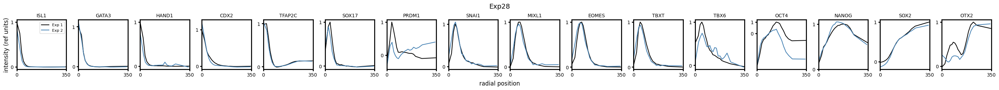

In [34]:
# RADIAL PROFILES (genes), Exp20 vs Exp28's B50, after gene alignment -- reuses
# align_28_to_20 (fit_gene_alignment) already computed above.

importlib.reload(IIF);

data_cond = data[data['condition'] == 'B50']
figure_configs = [(data28, '28', 'B50', 'Exp28')]

IIF.plot_radial_profiles_comparison(
    data_cond, figure_configs, gene_names, {'28': align_28_to_20},
    dataDir + '/FigS3', 'radial_profiles_genes', reference_label='Exp 1', measured_label='Exp 2')

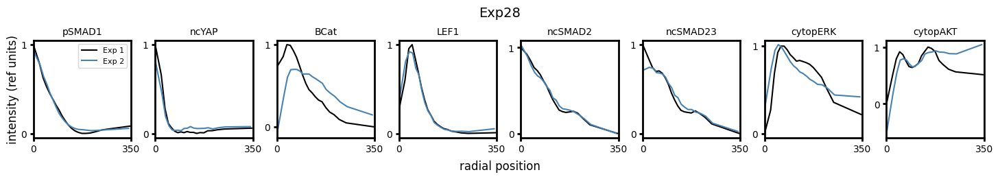

In [35]:
# RADIAL PROFILES (signals), Exp20 vs Exp28's B50, after signal alignment -- fits
# fit_zscore_alignment fresh here since fig2n doesn't already have a standalone signal
# alignment variable the way it does for genes (align_28_to_20). minmax normalization
# since signals don't have genes' bimodal background/foreground structure to anchor to.

align_28_to_20_signal = IIF.fit_zscore_alignment(data28, data, signal_names)

IIF.plot_radial_profiles_comparison(
    data_cond, figure_configs, signal_names, {'28': align_28_to_20_signal},
    dataDir + '/FigS3', 'radial_profiles_signals', normalize='minmax', reference_label='Exp 1', measured_label='Exp 2')


/var/folders/6d/flcpr9z93kd6kfzpy3dfv0tc0000gn/T/ipykernel_21284/1849846632.py:20: RuntimeWarning: invalid value encountered in log10
  log_28_aligned = np.log10(aligned_vals + fits[marker]['offset'])


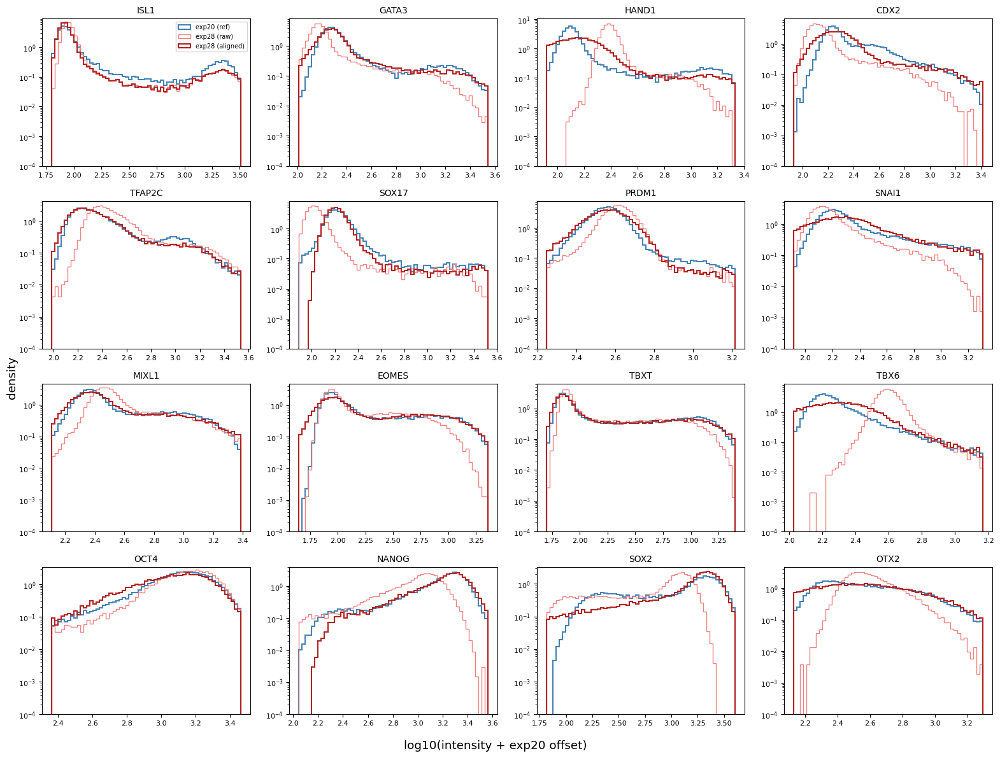

In [179]:
# visualize alignment

os.makedirs(dataDir + '/FigS3', exist_ok=True)

n_genes = len(gene_names)
n_cols = 4
n_rows = int(np.ceil(n_genes / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows))
axes = axes.ravel()

for i, marker in enumerate(gene_names):
    ax = axes[i]

    log_20 = fits[marker]['log_vals']
    log_28 = fits28[marker]['log_vals']

    aligned_vals = data28_aligned_to_20.loc[data28_aligned_to_20['condition'] == 'B50', marker].to_numpy()
    aligned_vals = aligned_vals[~np.isnan(aligned_vals)]
    log_28_aligned = np.log10(aligned_vals + fits[marker]['offset'])

    grid_lo, grid_hi = IIF.robust_range(log_20, log_28, log_28_aligned)
    bins = np.linspace(grid_lo, grid_hi, 60)

    ax.hist(log_20, bins=bins, density=True, histtype='step', color='steelblue', linewidth=1.5, label='exp20 (ref)')
    ax.hist(log_28, bins=bins, density=True, histtype='step', color='lightcoral', linewidth=1, label='exp28 (raw)')
    ax.hist(log_28_aligned, bins=bins, density=True, histtype='step', color='firebrick', linewidth=1.5, label='exp28 (aligned)')

    ax.set_yscale('log')
    ax.set_ylim(bottom=1e-4)
    ax.set_title(marker, fontsize=10)
    ax.tick_params(labelsize=8)

for ax in axes[n_genes:]:
    ax.axis('off')

axes[0].legend(fontsize=7, loc='upper right')
fig.supxlabel('log10(intensity + exp20 offset)')
fig.supylabel('density')
plt.tight_layout()
plt.savefig(dataDir + '/FigS3/exp28_alignment_to_exp20_check.png', dpi=150)


In [180]:
# EXP28 SELF PREDICTION PERFORMANCE, PER FOLD: MANUAL VS POSTERIOR VS EXP20-TRANSFERRED THRESHOLDS

data28_cond = data28[data28['condition'] == 'B50']
data28_cond_aligned = data28_aligned_to_20[data28_aligned_to_20['condition'] == 'B50']
pred28_self_aligned_avg = IIF.apply_alignment(pred_subs28_self['avg'], align_28_to_20, gene_names)

configs28 = [
    ('manual',            thresh28,           data28_cond,         pred_subs28_self['avg']),
    ('posterior',         thresh_posterior28, data28_cond,         pred_subs28_self['avg']),
    ('exp20_transferred', thresh_posterior,   data28_cond_aligned, pred28_self_aligned_avg),
]

perfold_marker28 = []
perfold_fate28 = []

for label28, th28, data_for_fates, pred_for_eval in configs28:
    fates28_cond_all, fate_names_raw28 = IIF.return_fates(data_for_fates, thresh=th28)
    keep28 = fates28_cond_all != 'other'
    data28_cond_scored = data_for_fates[keep28]
    pred28_sub = pred_for_eval.loc[data28_cond_scored.index]

    df_marker = IIF.compute_marker_performance_perfold(data28_cond_scored, pred28_sub, data28_cond_scored['Colony'].to_numpy(), gene_names, th28)
    df_marker['threshold'] = label28
    perfold_marker28.append(df_marker)

    fates28_cond = fates28_cond_all[keep28]
    fates28_pred, _ = IIF.return_fates(pred28_sub, thresh=th28)
    fate_names_list28 = [f for f in fate_names_raw28 if f != 'other']
    df_fate = pd.DataFrame(IIF.compute_category_performance_perfold(
        fates28_cond, fates28_pred, data28_cond_scored['Colony'].to_numpy(),
        fate_names_list28, aggregate_name='all fates'))
    df_fate['threshold'] = label28
    perfold_fate28.append(df_fate)

perfold_marker28 = pd.concat(perfold_marker28, ignore_index=True)
perfold_fate28 = pd.concat(perfold_fate28, ignore_index=True)


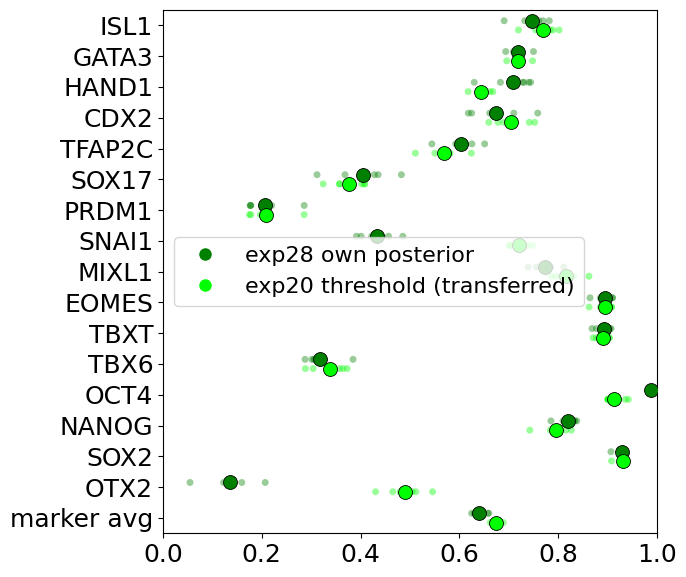

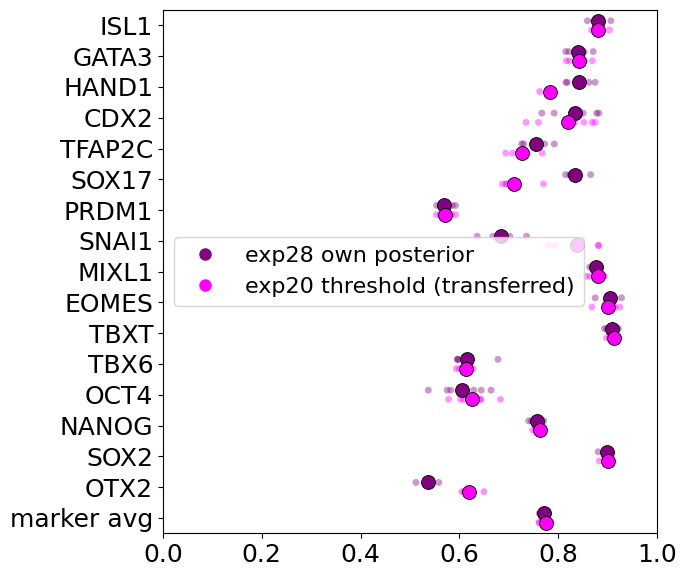

In [181]:
# plot f1 and balanced accuracy per gene, exp28 own posterior threshold vs exp20 threshold (transferred) -- per fold

labels = gene_names + ['marker_avg']

marker28_own = perfold_marker28[perfold_marker28['threshold'] == 'posterior']
marker28_xfer = perfold_marker28[perfold_marker28['threshold'] == 'exp20_transferred']

marker28_own_full = IIF.add_group_avg(marker28_own, ['balanced_accuracy', 'f1'])
marker28_xfer_full = IIF.add_group_avg(marker28_xfer, ['balanced_accuracy', 'f1'])

for score in ['f1', 'balanced_accuracy']:
    colors = [(0, 1/2, 0, 1), (0, 1, 0, 1)] if score == 'f1' else [(1/2, 0, 1/2, 1), (1, 0, 1, 1)]
    IIF.plot_perfold_comparison(
        [(marker28_own_full, score, colors[0]), (marker28_xfer_full, score, colors[1])],
        'gene', labels,
        dataDir + '/FigS3/' + f'exp28_own_vs_transferred_{score}_perfold.png',
        legend_labels=['exp28 own posterior', 'exp20 threshold (transferred)'],
        tick_labels=labels[:-1] + ['marker avg'])


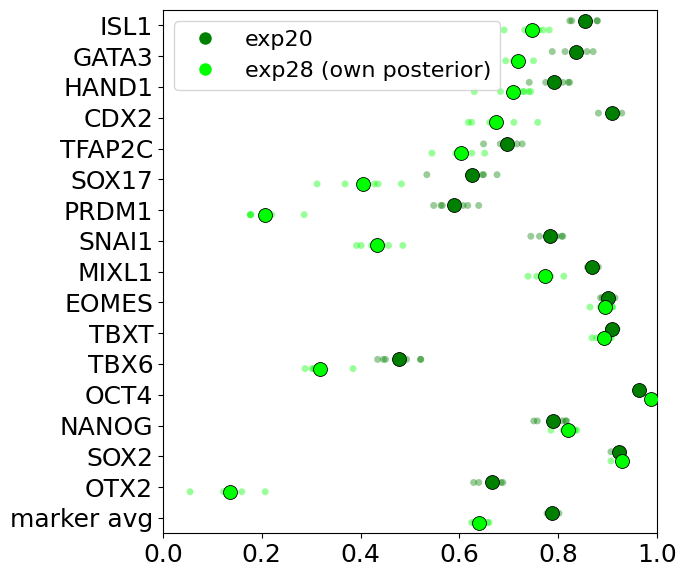

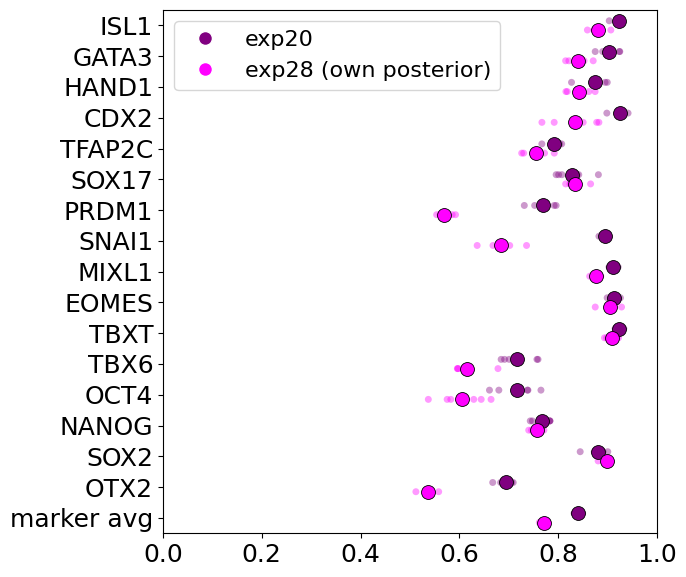

In [182]:
# plot f1 and balanced accuracy per gene for exp 20 vs 28 (posterior thresholds)

labels = gene_names + ['marker_avg']

marker20 = perfold_marker20[perfold_marker20['threshold'] == 'posterior']
marker28 = perfold_marker28[perfold_marker28['threshold'] == 'posterior']

marker20_full = IIF.add_group_avg(marker20, ['balanced_accuracy', 'f1'])
marker28_full = IIF.add_group_avg(marker28, ['balanced_accuracy', 'f1'])

for score in ['f1', 'balanced_accuracy']:
    colors = [(0, 1/2, 0, 1), (0, 1, 0, 1)] if score == 'f1' else [(1/2, 0, 1/2, 1), (1, 0, 1, 1)]
    IIF.plot_perfold_comparison(
        [(marker20_full, score, colors[0]), (marker28_full, score, colors[1])],
        'gene', labels,
        dataDir + '/FigS3/' + f'exp20v28_marker_{score}_posterior_perfold.png',
        legend_labels=['exp20', 'exp28 (own posterior)'],
        tick_labels=labels[:-1] + ['marker avg'])


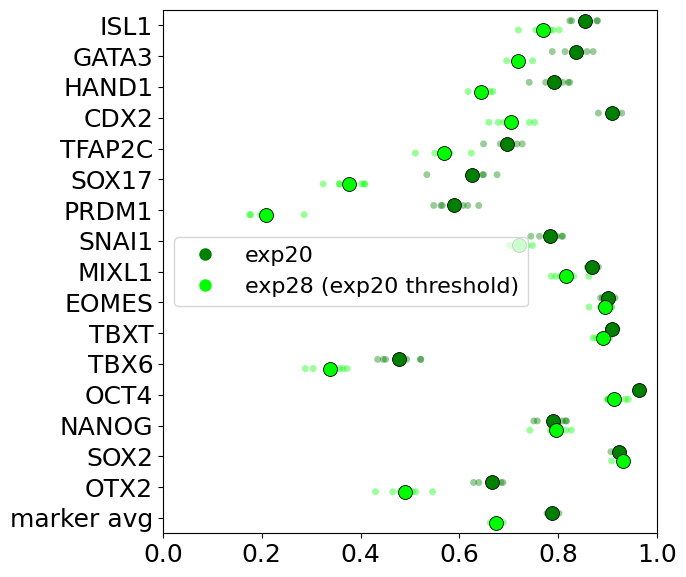

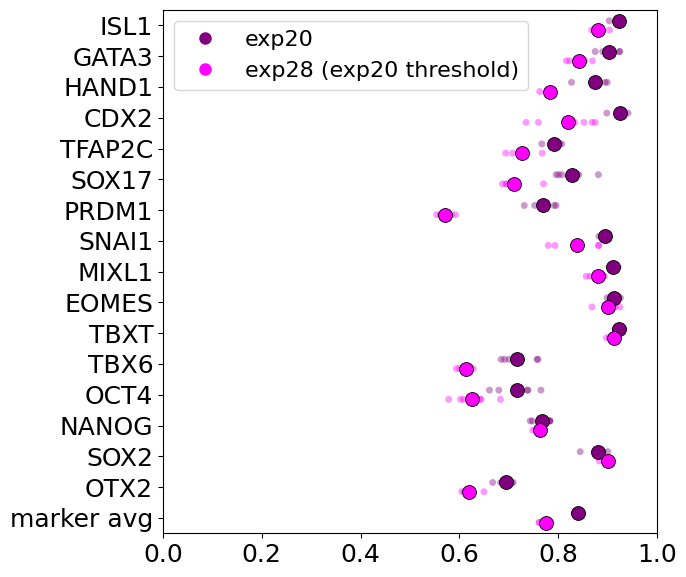

In [183]:
# plot f1 and balanced accuracy per gene for exp 20 vs 28 (exp20 thresholds, transferred via alignment for exp28) -- per fold

labels = gene_names + ['marker_avg']

marker20_full = IIF.add_group_avg(perfold_marker20[perfold_marker20['threshold'] == 'posterior'], ['balanced_accuracy', 'f1'])
marker28_full = IIF.add_group_avg(perfold_marker28[perfold_marker28['threshold'] == 'exp20_transferred'], ['balanced_accuracy', 'f1'])

for score in ['f1', 'balanced_accuracy']:
    colors = [(0, 1/2, 0, 1), (0, 1, 0, 1)] if score == 'f1' else [(1/2, 0, 1/2, 1), (1, 0, 1, 1)]
    IIF.plot_perfold_comparison(
        [(marker20_full, score, colors[0]), (marker28_full, score, colors[1])],
        'gene', labels,
        dataDir + '/FigS3/' + f'exp20v28_marker_{score}_exp20threshold_perfold.png',
        legend_labels=['exp20', 'exp28 (exp20 threshold)'],
        tick_labels=labels[:-1] + ['marker avg'])


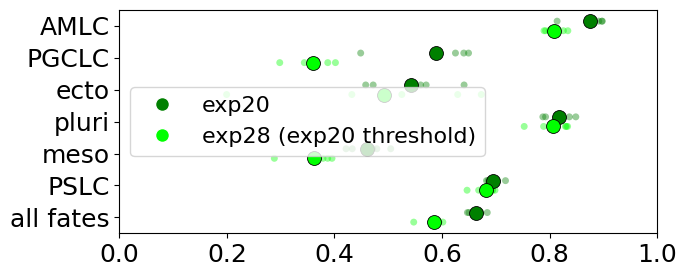

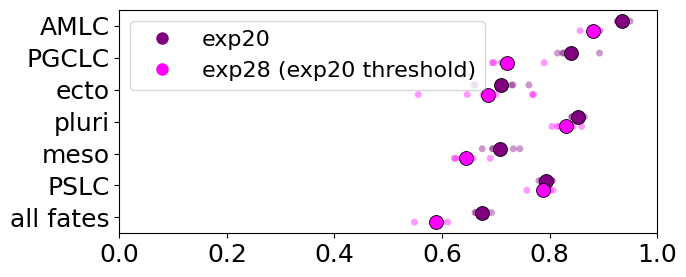

In [184]:
# plot f1 and balanced accuracy per fate for exp 20 vs 28 (exp20 thresholds, transferred via alignment for exp28) -- per fold

labels = fate_names_list + ['all fates']

fate20 = perfold_fate20[perfold_fate20['threshold'] == 'posterior']
fate28 = perfold_fate28[perfold_fate28['threshold'] == 'exp20_transferred']

for score in ['f1', 'balanced_accuracy']:
    colors = [(0, 1/2, 0, 1), (0, 1, 0, 1)] if score == 'f1' else [(1/2, 0, 1/2, 1), (1, 0, 1, 1)]
    IIF.plot_perfold_comparison(
        [(fate20, score, colors[0]), (fate28, score, colors[1])],
        'category', labels,
        dataDir + '/FigS3/' + f'exp20v28_fate_{score}_exp20threshold_perfold.png',
        legend_labels=['exp20', 'exp28 (exp20 threshold)'])


In [ ]:
# cross-experiment prediction

hyperparam = {'HIDDEN_DIM': 32, 'N_LAYERS': 2, 'LATENT_DIM': 2, 'BETA': 0.01}
recompute = True

data_b50 = data[data['condition'] == 'B50']
data28_b50 = data28[data28['condition'] == 'B50']

pred_cross_20to28 = IIF.run_vib_cross_experiment(
    data_b50, data28_aligned_to_20, signal_names, gene_names, hyperparam,
    out_dir=dataDir + '/VIB_cross', out_prefix='cross_20to28',
    recompute=recompute, label='exp20->exp28')

pred_cross_28to20 = IIF.run_vib_cross_experiment(
    data28_b50, data20_aligned_to_28, signal_names, gene_names, hyperparam,
    out_dir=dataDir28 + '/VIB_cross', out_prefix='cross_28to20',
    recompute=recompute, label='exp28->exp20')


[exp20->exp28] Run 0/3
[exp20->exp28]   training on 30427 B50 cells
[exp20->exp28]   predicting 77439 cells
[exp20->exp28] Elapsed time: 4.7 seconds
[exp20->exp28] Run 1/3
[exp20->exp28]   training on 30427 B50 cells
[exp20->exp28]   predicting 77439 cells
[exp20->exp28] Elapsed time: 4.7 seconds
[exp20->exp28] Run 2/3
[exp20->exp28]   training on 30427 B50 cells
[exp20->exp28]   predicting 77439 cells
[exp20->exp28] Elapsed time: 4.5 seconds
[exp28->exp20] Run 0/3
[exp28->exp20]   training on 26350 B50 cells
[exp28->exp20]   predicting 84395 cells
[exp28->exp20] Elapsed time: 4.6 seconds
[exp28->exp20] Run 1/3
[exp28->exp20]   training on 26350 B50 cells
[exp28->exp20]   predicting 84395 cells
[exp28->exp20] Elapsed time: 4.7 seconds
[exp28->exp20] Run 2/3
[exp28->exp20]   training on 26350 B50 cells
[exp28->exp20]   predicting 84395 cells
[exp28->exp20] Elapsed time: 4.6 seconds


In [ ]:
# remove signals

data_b50 = data[data['condition'] == 'B50']
signal_names_reduced = [s for s in signal_names if s not in ['BCat']]

pred_cross_20to28 = IIF.run_vib_cross_experiment(
    data_b50, data28_aligned_to_20, signal_names_reduced, gene_names, hyperparam,
    out_dir=dataDir + '/VIB_cross', out_prefix='cross_20to28_reduced_signals',
    recompute=True, label='exp20->exp28 (reduced signals)')


[exp20->exp28 (reduced signals)] Run 0/3
[exp20->exp28 (reduced signals)]   training on 30427 B50 cells
[exp20->exp28 (reduced signals)]   predicting 77439 cells
[exp20->exp28 (reduced signals)] Elapsed time: 4.6 seconds
[exp20->exp28 (reduced signals)] Run 1/3
[exp20->exp28 (reduced signals)]   training on 30427 B50 cells
[exp20->exp28 (reduced signals)]   predicting 77439 cells
[exp20->exp28 (reduced signals)] Elapsed time: 4.6 seconds
[exp20->exp28 (reduced signals)] Run 2/3
[exp20->exp28 (reduced signals)]   training on 30427 B50 cells
[exp20->exp28 (reduced signals)]   predicting 77439 cells
[exp20->exp28 (reduced signals)] Elapsed time: 4.8 seconds


In [242]:
# CROSS-EXPERIMENT PREDICTION PERFORMANCE, PER FOLD (B50 only, for a fair comparison against self)

# 20 -> 28: trained on exp20, predicts exp28 (aligned to exp20 units), evaluated with thresh_posterior
fates28_aligned_all, fate_names_raw = IIF.return_fates(data28_cond_aligned, thresh=thresh_posterior)
keep_2028 = fates28_aligned_all != 'other'
data_cross_2028_scored = data28_cond_aligned[keep_2028]
pred_cross_2028_sub = pred_cross_20to28['avg'].loc[data_cross_2028_scored.index]

df_marker_cross_2028 = IIF.compute_marker_performance_perfold(
    data_cross_2028_scored, pred_cross_2028_sub, data_cross_2028_scored['Colony'].to_numpy(), gene_names, thresh_posterior)
df_marker_cross_2028['threshold'] = 'cross_20to28'

fates_cross_2028_true = fates28_aligned_all[keep_2028]
fates_cross_2028_pred, _ = IIF.return_fates(pred_cross_2028_sub, thresh=thresh_posterior)
df_fate_cross_2028 = pd.DataFrame(IIF.compute_category_performance_perfold(
    fates_cross_2028_true, fates_cross_2028_pred, data_cross_2028_scored['Colony'].to_numpy(),
    fate_names_list, aggregate_name='all fates'))
df_fate_cross_2028['threshold'] = 'cross_20to28'

# 28 -> 20: trained on exp28, predicts exp20; map predictions back into exp20's own units
# (via align_28_to_20) so this is directly comparable to exp20 self -- same threshold, same
# native unit space, only the source model differs

pred_cross_2820_in20units = IIF.apply_alignment(pred_cross_28to20['avg'], align_28_to_20, gene_names)

data20_cond = data[data['condition'] == 'B50']
fates20_true_all, fate_names_raw = IIF.return_fates(data20_cond, thresh=thresh_posterior)
fate_names_list = [f for f in fate_names_raw if f != 'other']
keep_2820 = fates20_true_all != 'other'
data_cross_2820_scored = data20_cond[keep_2820]
pred_cross_2820_sub = pred_cross_2820_in20units.loc[data_cross_2820_scored.index]

df_marker_cross_2820 = IIF.compute_marker_performance_perfold(
    data_cross_2820_scored, pred_cross_2820_sub, data_cross_2820_scored['Colony'].to_numpy(), gene_names, thresh_posterior)
df_marker_cross_2820['threshold'] = 'cross_28to20'

fates_cross_2820_true = fates20_true_all[keep_2820]
fates_cross_2820_pred, _ = IIF.return_fates(pred_cross_2820_sub, thresh=thresh_posterior)
df_fate_cross_2820 = pd.DataFrame(IIF.compute_category_performance_perfold(
    fates_cross_2820_true, fates_cross_2820_pred, data_cross_2820_scored['Colony'].to_numpy(),
    fate_names_list, aggregate_name='all fates'))
df_fate_cross_2820['threshold'] = 'cross_28to20'


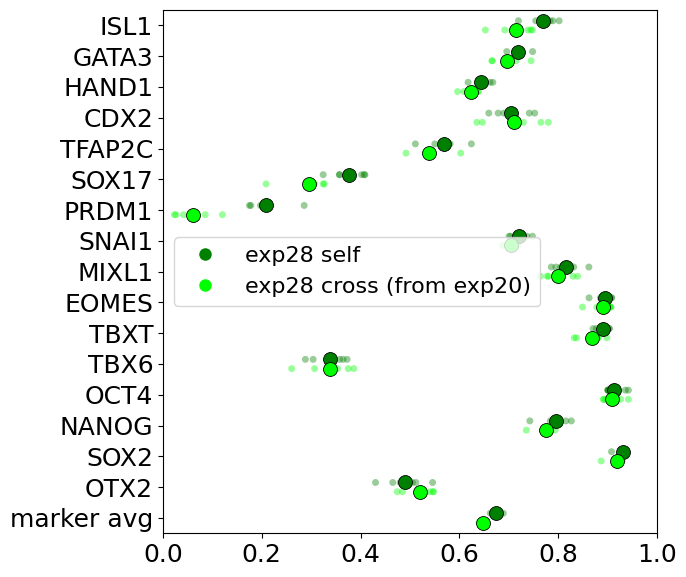

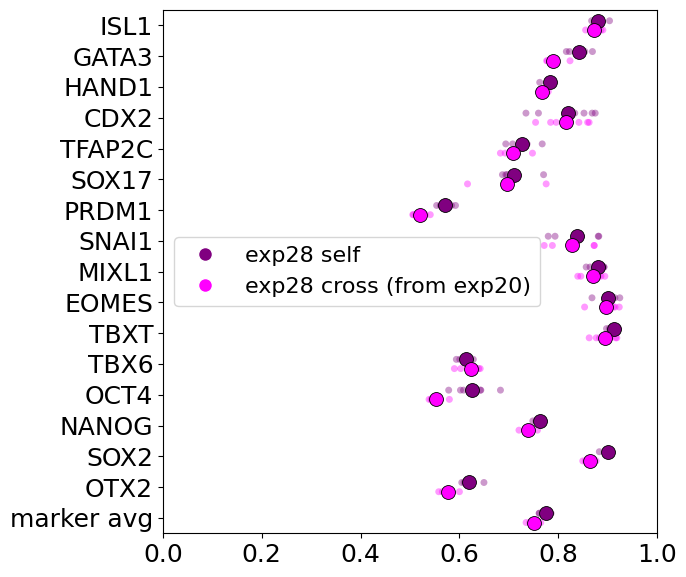

In [243]:
# exp28 self vs exp28 cross (from exp20)
# 
labels = gene_names + ['marker_avg']

self28_xfer_full = IIF.add_group_avg(perfold_marker28[perfold_marker28['threshold'] == 'exp20_transferred'], ['balanced_accuracy', 'f1'])
cross2028_full = IIF.add_group_avg(df_marker_cross_2028, ['balanced_accuracy', 'f1'])

for score in ['f1', 'balanced_accuracy']:
    colors = [(0, 1/2, 0, 1), (0, 1, 0, 1)] if score == 'f1' else [(1/2, 0, 1/2, 1), (1, 0, 1, 1)]
    IIF.plot_perfold_comparison(
        [(self28_xfer_full, score, colors[0]), (cross2028_full, score, colors[1])],
        'gene', labels,
        dataDir + '/FigS3/' + f'exp28_self_vs_cross20_marker_{score}_perfold.png',
        legend_labels=['exp28 self', 'exp28 cross (from exp20)'],
        tick_labels=labels[:-1] + ['marker avg'])


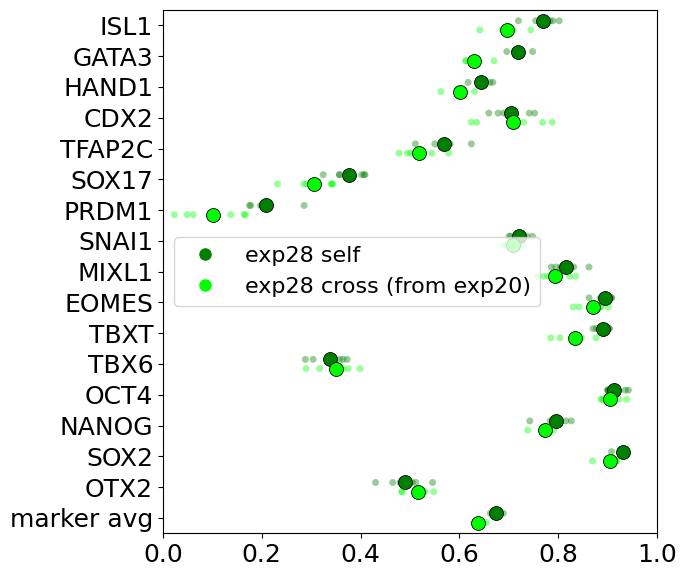

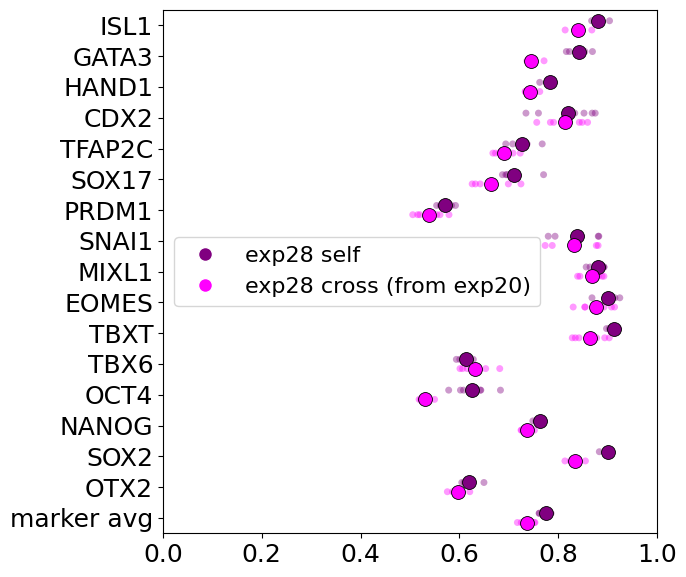

In [195]:
# exp28 self vs exp28 cross (from exp20)
# 
labels = gene_names + ['marker_avg']

self28_xfer_full = IIF.add_group_avg(perfold_marker28[perfold_marker28['threshold'] == 'exp20_transferred'], ['balanced_accuracy', 'f1'])
cross2028_full = IIF.add_group_avg(df_marker_cross_2028, ['balanced_accuracy', 'f1'])

for score in ['f1', 'balanced_accuracy']:
    colors = [(0, 1/2, 0, 1), (0, 1, 0, 1)] if score == 'f1' else [(1/2, 0, 1/2, 1), (1, 0, 1, 1)]
    IIF.plot_perfold_comparison(
        [(self28_xfer_full, score, colors[0]), (cross2028_full, score, colors[1])],
        'gene', labels,
        dataDir + '/FigS3/' + f'exp28_self_vs_cross20_marker_{score}_perfold.png',
        legend_labels=['exp28 self', 'exp28 cross (from exp20)'],
        tick_labels=labels[:-1] + ['marker avg'])


In [188]:
data20_cond = data[data['condition'] == 'B50']
data20_cond_aligned = data20_aligned_to_28[data20_aligned_to_28['condition'] == 'B50']
pred20_self_aligned_avg = IIF.apply_alignment(pred_subs[(32, 2, 2)]['avg'], align_20_to_28, gene_names)

configs20 = [
    ('manual',            thresh,             data20_cond,         pred_subs[(32, 2, 2)]['avg']),
    ('posterior',         thresh_posterior,   data20_cond,         pred_subs[(32, 2, 2)]['avg']),
    ('exp28_transferred', thresh_posterior28, data20_cond_aligned, pred20_self_aligned_avg),
]

perfold_marker20 = []
perfold_fate20 = []

for label20, th20, data_for_fates, pred_for_eval in configs20:
    fates20_cond_all, fate_names_raw = IIF.return_fates(data_for_fates, thresh=th20)
    keep20 = fates20_cond_all != 'other'
    data20_cond_scored = data_for_fates[keep20]
    pred20_sub = pred_for_eval.loc[data20_cond_scored.index]

    df_marker = IIF.compute_marker_performance_perfold(data20_cond_scored, pred20_sub, data20_cond_scored['Colony'].to_numpy(), gene_names, th20)
    df_marker['threshold'] = label20
    perfold_marker20.append(df_marker)

    fates20_cond = fates20_cond_all[keep20]
    fates20_pred, _ = IIF.return_fates(pred20_sub, thresh=th20)
    fate_names_list = [f for f in fate_names_raw if f != 'other']
    df_fate = pd.DataFrame(IIF.compute_category_performance_perfold(
        fates20_cond, fates20_pred, data20_cond_scored['Colony'].to_numpy(),
        fate_names_list, aggregate_name='all fates'))
    df_fate['threshold'] = label20
    perfold_fate20.append(df_fate)

perfold_marker20 = pd.concat(perfold_marker20, ignore_index=True)
perfold_fate20 = pd.concat(perfold_fate20, ignore_index=True)


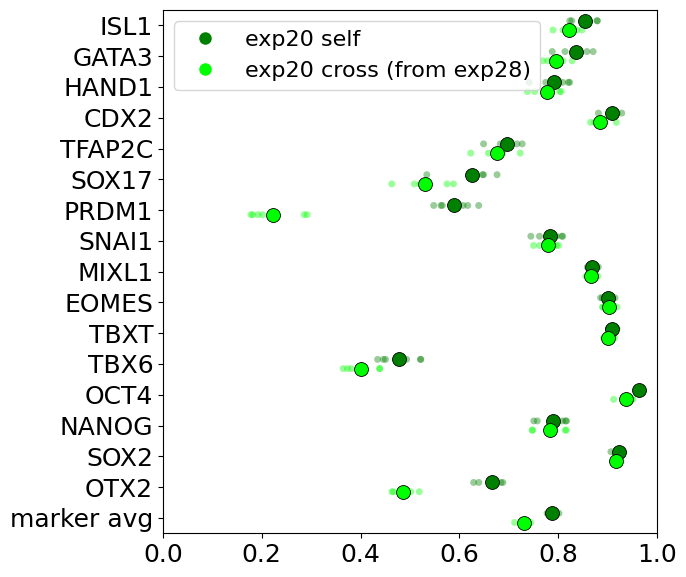

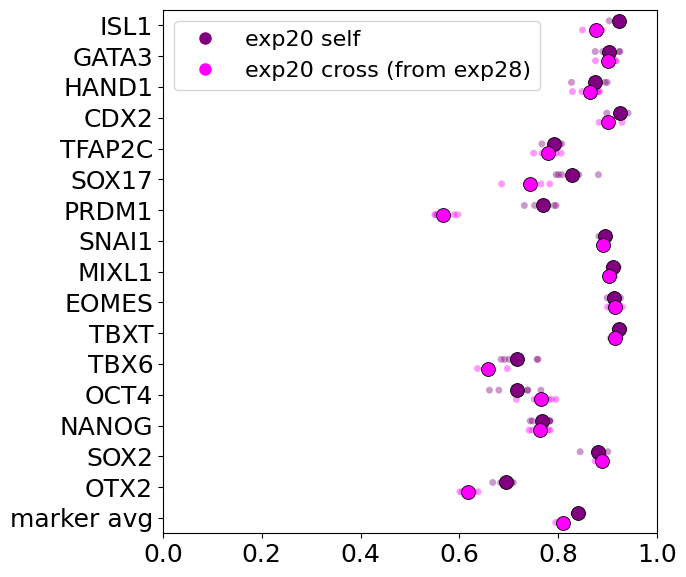

In [197]:
# exp20 self vs exp20 cross (from exp28)

self20_xfer_full = IIF.add_group_avg(perfold_marker20[perfold_marker20['threshold'] == 'posterior'], ['balanced_accuracy', 'f1'])
cross2820_full = IIF.add_group_avg(df_marker_cross_2820, ['balanced_accuracy', 'f1'])

for score in ['f1', 'balanced_accuracy']:
    colors = [(0, 1/2, 0, 1), (0, 1, 0, 1)] if score == 'f1' else [(1/2, 0, 1/2, 1), (1, 0, 1, 1)]
    IIF.plot_perfold_comparison(
        [(self20_xfer_full, score, colors[0]), (cross2820_full, score, colors[1])],
        'gene', labels,
        dataDir + '/FigS3/' + f'exp20_self_vs_cross28_marker_{score}_perfold.png',
        legend_labels=['exp20 self', 'exp20 cross (from exp28)'],
        tick_labels=labels[:-1] + ['marker avg'])


In [ ]:
# Reload the with-BCat and no-BCat cross-predictions explicitly from their own cache
# prefixes, rather than trusting pred_cross_20to28/pred_cross_28to20's current in-memory
# state -- '# remove signals' reassigned pred_cross_20to28 to the reduced-signal version.

data_b50 = data[data['condition'] == 'B50']
data28_b50 = data28[data28['condition'] == 'B50']
signal_names_reduced = [s for s in signal_names if s not in ['BCat']]

pred_cross_20to28_bcat = IIF.run_vib_cross_experiment(
    data_b50, data28_aligned_to_20, signal_names, gene_names, hyperparam,
    out_dir=dataDir + '/VIB_cross', out_prefix='cross_20to28', recompute=False, label='exp20->exp28')

pred_cross_28to20_bcat = IIF.run_vib_cross_experiment(
    data28_b50, data20_aligned_to_28, signal_names, gene_names, hyperparam,
    out_dir=dataDir28 + '/VIB_cross', out_prefix='cross_28to20', recompute=False, label='exp28->exp20')

pred_cross_20to28_nobcat = IIF.run_vib_cross_experiment(
    data_b50, data28_aligned_to_20, signal_names_reduced, gene_names, hyperparam,
    out_dir=dataDir + '/VIB_cross', out_prefix='cross_20to28_reduced_signals', recompute=False,
    label='exp20->exp28 (reduced signals)')


[exp20->exp28] Run 0/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_cross/cross_20to28_run0.csv
[exp20->exp28] Run 1/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_cross/cross_20to28_run1.csv
[exp20->exp28] Run 2/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_cross/cross_20to28_run2.csv
[exp28->exp20] Run 0/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/data_BMPdoses_repeat/VIB_cross/cross_28to20_run0.csv
[exp28->exp20] Run 1/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/data_BMPdoses_repeat/VIB_cross/cross_28to20_run1.csv
[exp28->exp20] Run 2/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/data_BMPdoses_repeat/VIB_cross/cross_28to20_run2.csv
[exp20->exp28 (reduced signals)] Run 0/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_cross/cross_20to28_reduced_sig

In [ ]:
# Fresh training for the 3 missing pieces: self-CV without BCat for both experiments,
# and the 28->20 cross direction without BCat (never run before).

IIF.run_vib_self(data_b50, signal_names_reduced, gene_names, hyperparam,
                  out_dir=dataDir + '/VIB_self', out_prefix='selfB50_reduced_signals',
                  recompute=True, label='exp20 self (no BCat)')
pred_subs20_self_nobcat = IIF.load_vib_self(data_b50, signal_names_reduced, gene_names, hyperparam,
                                             out_dir=dataDir + '/VIB_self', out_prefix='selfB50_reduced_signals',
                                             label='exp20 self (no BCat)')

IIF.run_vib_self(data28_b50, signal_names_reduced, gene_names, hyperparam,
                  out_dir=dataDir28 + '/VIB_self', out_prefix='exp28_selfB50_reduced_signals',
                  recompute=True, label='exp28 self (no BCat)')
pred_subs28_self_nobcat = IIF.load_vib_self(data28_b50, signal_names_reduced, gene_names, hyperparam,
                                             out_dir=dataDir28 + '/VIB_self', out_prefix='exp28_selfB50_reduced_signals',
                                             label='exp28 self (no BCat)')

pred_cross_28to20_nobcat = IIF.run_vib_cross_experiment(
    data28_b50, data20_aligned_to_28, signal_names_reduced, gene_names, hyperparam,
    out_dir=dataDir28 + '/VIB_cross', out_prefix='cross_28to20_reduced_signals', recompute=True,
    label='exp28->exp20 (reduced signals)')


[exp20 self (no BCat)] Run 0/3
[exp20 self (no BCat)]   col: 1
[exp20 self (no BCat)]   col: 2
[exp20 self (no BCat)]   col: 3
[exp20 self (no BCat)]   col: 4
[exp20 self (no BCat)]   col: 5
[exp20 self (no BCat)]   col: 6
[exp20 self (no BCat)] Elapsed time: 20.0 seconds
[exp20 self (no BCat)] Run 1/3
[exp20 self (no BCat)]   col: 1
[exp20 self (no BCat)]   col: 2
[exp20 self (no BCat)]   col: 3
[exp20 self (no BCat)]   col: 4
[exp20 self (no BCat)]   col: 5
[exp20 self (no BCat)]   col: 6
[exp20 self (no BCat)] Elapsed time: 19.6 seconds
[exp20 self (no BCat)] Run 2/3
[exp20 self (no BCat)]   col: 1
[exp20 self (no BCat)]   col: 2
[exp20 self (no BCat)]   col: 3
[exp20 self (no BCat)]   col: 4
[exp20 self (no BCat)]   col: 5
[exp20 self (no BCat)]   col: 6
[exp20 self (no BCat)] Elapsed time: 19.7 seconds
[exp20 self (no BCat)] Run 0/3 -- already exists, loading: /Users/idse/data_tmp/signaldecoding/230121_data_BMPdoses/VIB_self/self_reduced_signals_run0.csv
[exp20 self (no BCat)] Run

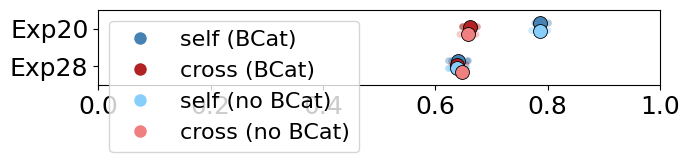

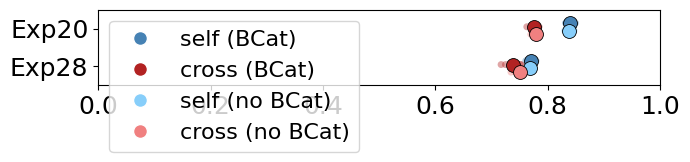

In [ ]:
# Summary panel: mean-across-markers F1/balanced accuracy, four groups (self/cross x
# with/without BCat), one series per experiment. Cross-predictions are scored in the
# TRAINING experiment's own units/threshold (the established fair-comparison convention),
# so Exp20's cross score uses Exp28's threshold on data aligned into Exp28's space, and
# vice versa.

def marker_avg_perfold(data_cond, pred_sub, colonies, thresh):
    """Per-fold (colony) mean-across-markers F1 and balanced accuracy -- the 'marker_avg'
    row from compute_marker_performance_perfold/add_group_avg, isolated as its own
    dataframe for combining into a multi-group summary comparison. pred_sub is restricted
    to data_cond's index first, since prediction dicts (e.g. pred_subs) can cover a wider
    row set than the specific condition/filter being scored here."""
    pred_sub = pred_sub.loc[data_cond.index]
    df = IIF.compute_marker_performance_perfold(data_cond, pred_sub, colonies, gene_names, thresh)
    df = IIF.add_group_avg(df, ['f1', 'balanced_accuracy'], group_col='gene')
    return df[df['gene'] == 'marker_avg'].copy()

data20_aligned_to_28_b50 = data20_aligned_to_28[data20_aligned_to_28['condition'] == 'B50']
data28_aligned_to_20_b50 = data28_aligned_to_20[data28_aligned_to_20['condition'] == 'B50']

exp20_scores = {
    'self (BCat)': marker_avg_perfold(data_b50, pred_subs[(32, 2, 2)]['avg'], data_b50['Colony'].to_numpy(), thresh_posterior),
    'cross (BCat)': marker_avg_perfold(data20_aligned_to_28_b50, pred_cross_28to20_bcat['avg'], data20_aligned_to_28_b50['Colony'].to_numpy(), thresh_posterior28),
    'self (no BCat)': marker_avg_perfold(data_b50, pred_subs20_self_nobcat['avg'], data_b50['Colony'].to_numpy(), thresh_posterior),
    'cross (no BCat)': marker_avg_perfold(data20_aligned_to_28_b50, pred_cross_28to20_nobcat['avg'], data20_aligned_to_28_b50['Colony'].to_numpy(), thresh_posterior28),
}
exp28_scores = {
    'self (BCat)': marker_avg_perfold(data28_b50, pred_subs28_self['avg'], data28_b50['Colony'].to_numpy(), thresh_posterior28),
    'cross (BCat)': marker_avg_perfold(data28_aligned_to_20_b50, pred_cross_20to28_bcat['avg'], data28_aligned_to_20_b50['Colony'].to_numpy(), thresh_posterior),
    'self (no BCat)': marker_avg_perfold(data28_b50, pred_subs28_self_nobcat['avg'], data28_b50['Colony'].to_numpy(), thresh_posterior28),
    'cross (no BCat)': marker_avg_perfold(data28_aligned_to_20_b50, pred_cross_20to28_nobcat['avg'], data28_aligned_to_20_b50['Colony'].to_numpy(), thresh_posterior),
}

experiments = ['Exp20', 'Exp28']
groups = ['self (BCat)', 'cross (BCat)', 'self (no BCat)', 'cross (no BCat)']
group_colors = {
    'self (BCat)': 'steelblue', 'cross (BCat)': 'firebrick',
    'self (no BCat)': 'lightskyblue', 'cross (no BCat)': 'lightcoral',
}

group_dfs = {}
for group in groups:
    df20 = exp20_scores[group].copy()
    df20['experiment'] = 'Exp20'
    df28 = exp28_scores[group].copy()
    df28['experiment'] = 'Exp28'
    group_dfs[group] = pd.concat([df20, df28], ignore_index=True)

IIF.plot_perfold_comparison(
    series=[(group_dfs[g], 'f1', group_colors[g]) for g in groups],
    group_col='experiment', labels=experiments,
    fname=dataDir + '/FigS3/bcat_ablation_summary_f1.png',
    legend_labels=groups)

IIF.plot_perfold_comparison(
    series=[(group_dfs[g], 'balanced_accuracy', group_colors[g]) for g in groups],
    group_col='experiment', labels=experiments,
    fname=dataDir + '/FigS3/bcat_ablation_summary_balacc.png',
    legend_labels=groups)



### Diagnosis

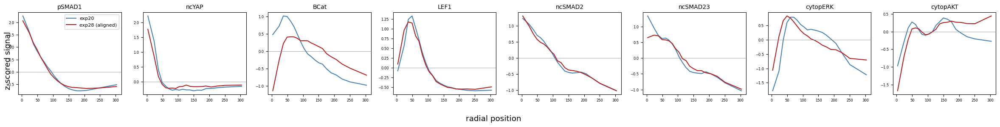

In [190]:
# STEP 1: radial profiles of ALIGNED signal inputs, exp20 vs exp28 (exp28 z-scored on its
# own B50 stats, then rescaled to exp20's -- matches what run_vib_cross_experiment now does
# before feeding signals to VIB)

data20_b50 = data[data['condition'] == 'B50']
data28_b50 = data28[data28['condition'] == 'B50']

signal_align_params = IIF.fit_zscore_alignment(data28, data, signal_names)
data28_b50_aligned = IIF.apply_alignment(data28_b50, signal_align_params, signal_names)

feat_mean = data20_b50[signal_names].mean()
feat_std = data20_b50[signal_names].std()
signals20_z = (data20_b50[signal_names] - feat_mean) / feat_std
signals28_z = (data28_b50_aligned[signal_names] - feat_mean) / feat_std

r_max = 350
N_bins_x = 20
n_signals = len(signal_names)

fig, axes = plt.subplots(1, n_signals, figsize=(3*n_signals, 3))

for i, sig in enumerate(signal_names):
    ax = axes[i]
    bins_x, mean_20, _, _ = fns_plot.calc_profile_meanvar(
        signals20_z[sig].to_numpy()[np.newaxis, :, np.newaxis],
        data20_b50['CircleEdgeDist'].to_numpy()[np.newaxis, :, np.newaxis],
        N_bins_x, r_max)
    bins_x, mean_28, _, _ = fns_plot.calc_profile_meanvar(
        signals28_z[sig].to_numpy()[np.newaxis, :, np.newaxis],
        data28_b50['CircleEdgeDist'].to_numpy()[np.newaxis, :, np.newaxis],
        N_bins_x, r_max)

    ax.plot(bins_x, mean_20[:, 0], color='steelblue', label='exp20')
    ax.plot(bins_x, mean_28[:, 0], color='firebrick', label='exp28 (aligned)')
    ax.axhline(0, color='gray', lw=0.5)
    ax.set_title(sig, fontsize=10)

axes[0].legend(fontsize=8)
fig.supxlabel('radial position')
fig.supylabel('z-scored signal')
plt.tight_layout()


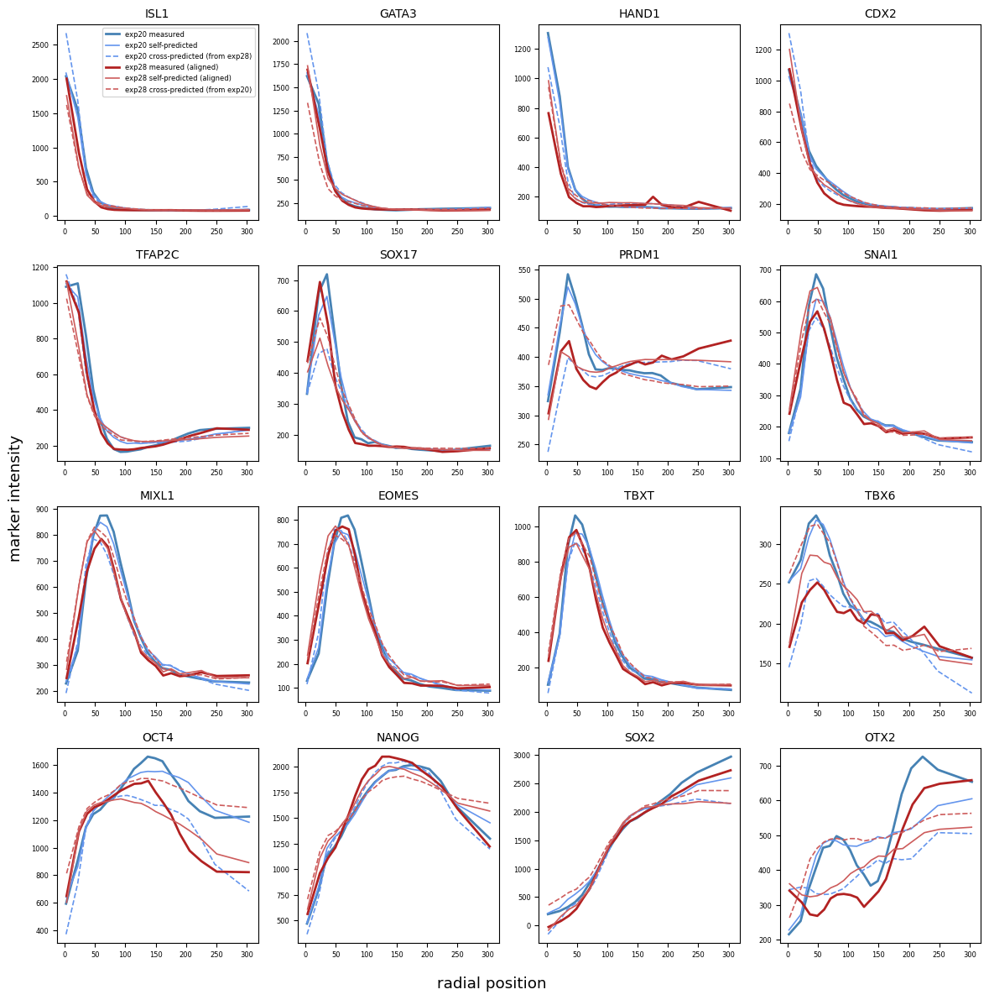

In [244]:
# STEP 2: radial profiles per gene -- exp20 measured, exp28 measured (aligned to exp20
# units), exp20 self-predicted, exp28 cross-predicted (from exp20-trained model)

data28_cond_aligned_b50 = data28_aligned_to_20[data28_aligned_to_20['condition'] == 'B50']
pred20_self_b50 = pred_subs[(32, 2, 2)]['avg'].loc[data20_b50.index]
pred_cross_2028_b50 = pred_cross_20to28['avg'].loc[data28_cond_aligned_b50.index]
pred28_self_aligned_b50 = pred28_self_aligned_avg.loc[data28_cond_aligned_b50.index]
pred_cross_2820_b50 = pred_cross_2820_in20units.loc[data20_b50.index]

r_max = 350
N_bins_x = 20
n_cols = 4
n_rows = int(np.ceil(len(gene_names) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(3*n_cols, 3*n_rows))
axes = axes.ravel()

for i, marker in enumerate(gene_names):
    ax = axes[i]

    series = [
        (data20_b50[marker].to_numpy(), data20_b50['CircleEdgeDist'].to_numpy(), 'steelblue', 2.0, '-', 'exp20 measured'),
        (pred20_self_b50[marker].to_numpy(), data20_b50['CircleEdgeDist'].to_numpy(), 'cornflowerblue', 1.2, '-', 'exp20 self-predicted'),
        (pred_cross_2820_b50[marker].to_numpy(), data20_b50['CircleEdgeDist'].to_numpy(), 'cornflowerblue', 1.2, '--', 'exp20 cross-predicted (from exp28)'),
        (data28_cond_aligned_b50[marker].to_numpy(), data28_cond_aligned_b50['CircleEdgeDist'].to_numpy(), 'firebrick', 2.0, '-', 'exp28 measured (aligned)'),
        (pred28_self_aligned_b50[marker].to_numpy(), data28_cond_aligned_b50['CircleEdgeDist'].to_numpy(), 'indianred', 1.2, '-', 'exp28 self-predicted (aligned)'),
        (pred_cross_2028_b50[marker].to_numpy(), data28_cond_aligned_b50['CircleEdgeDist'].to_numpy(), 'indianred', 1.2, '--', 'exp28 cross-predicted (from exp20)'),
    ]

    for vals, rdist, color, lw, ls, lbl in series:
        bins_x, mean_v, _, _ = fns_plot.calc_profile_meanvar(
            vals[np.newaxis, :, np.newaxis], rdist[np.newaxis, :, np.newaxis], N_bins_x, r_max)
        ax.plot(bins_x, mean_v[:, 0], color=color, linewidth=lw, linestyle=ls, label=lbl)

    ax.set_title(marker, fontsize=10)

for ax in axes[len(gene_names):]:
    ax.axis('off')

axes[0].legend(fontsize=6, loc='upper right')
fig.supxlabel('radial position')
fig.supylabel('marker intensity')
plt.tight_layout()



In [220]:
def radial_amplitude(vals, rdist, N_bins_x=20, r_max=350):
    bins_x, mean_v, _, _ = fns_plot.calc_profile_meanvar(
        vals[np.newaxis, :, np.newaxis], rdist[np.newaxis, :, np.newaxis], N_bins_x, r_max)
    return mean_v[:, 0].max() - mean_v[:, 0].min()

rows = []
for marker in gene_names:
    amp_measured_20 = radial_amplitude(data20_b50[marker].to_numpy(), data20_b50['CircleEdgeDist'].to_numpy())
    amp_self_20 = radial_amplitude(pred20_self_b50[marker].to_numpy(), data20_b50['CircleEdgeDist'].to_numpy())
    amp_cross_2820 = radial_amplitude(pred_cross_2820_b50[marker].to_numpy(), data20_b50['CircleEdgeDist'].to_numpy())

    amp_measured_28 = radial_amplitude(data28_cond_aligned_b50[marker].to_numpy(), data28_cond_aligned_b50['CircleEdgeDist'].to_numpy())
    amp_self_28 = radial_amplitude(pred28_self_aligned_b50[marker].to_numpy(), data28_cond_aligned_b50['CircleEdgeDist'].to_numpy())
    amp_cross_2028 = radial_amplitude(pred_cross_2028_b50[marker].to_numpy(), data28_cond_aligned_b50['CircleEdgeDist'].to_numpy())

    rows.append({
        'gene': marker,
        'self_20': amp_self_20 / amp_measured_20,
        'cross_28to20': amp_cross_2820 / amp_measured_20,
        'self_28': amp_self_28 / amp_measured_28,
        'cross_20to28': amp_cross_2028 / amp_measured_28,
    })

radial_shrinkage_df = pd.DataFrame(rows).set_index('gene')
radial_shrinkage_df.round(2)


,self_20,cross_28to20,self_28,cross_20to28
gene,,,,
ISL1,1.02,1.19,0.87,0.63
GATA3,1.02,1.40,1.03,0.61
HAND1,0.97,1.13,1.31,0.93
CDX2,0.95,1.53,1.14,0.57
TFAP2C,0.95,1.02,0.95,0.75
SOX17,0.87,0.54,0.66,0.64
PRDM1,0.85,0.80,0.93,0.97
SNAI1,0.86,1.08,1.20,1.08
MIXL1,0.96,1.02,1.06,1.12


In [221]:
compare_markers = ['ISL1', 'GATA3', 'CDX2', 'TBXT', 'EOMES']  # problem group + a couple "fine" genes as contrast

signal_gene_corr = pd.DataFrame(index=signal_names, columns=compare_markers, dtype=float)
for sig in signal_names:
    for marker in compare_markers:
        signal_gene_corr.loc[sig, marker] = data20_b50[sig].corr(data20_b50[marker])

signal_gene_corr.round(2)


,ISL1,GATA3,CDX2,TBXT,EOMES
pSMAD1,0.66,0.63,0.70,0.32,0.24
ncYAP,0.69,0.65,0.52,-0.16,-0.18
BCat,0.25,0.26,0.35,0.38,0.29
LEF1,0.04,0.08,0.26,0.69,0.51
ncSMAD2,0.40,0.40,0.47,0.33,0.32
ncSMAD23,0.40,0.40,0.43,0.31,0.35
cytopERK,-0.51,-0.46,-0.29,0.41,0.44
cytopAKT,-0.17,-0.16,-0.07,0.19,0.17


In [204]:
# QUANTIFY AMPLITUDE SHRINKAGE: std(predicted)/std(measured) per gene, self vs cross, both directions

rows = []
for marker in gene_names:
    std_measured_20 = data20_b50[marker].std()
    std_self_20 = pred20_self_b50[marker].std()
    std_cross_2820 = pred_cross_2820_b50[marker].std()

    std_measured_28 = data28_cond_aligned_b50[marker].std()
    std_self_28 = pred28_self_aligned_b50[marker].std()
    std_cross_2028 = pred_cross_2028_b50[marker].std()

    rows.append({
        'gene': marker,
        'self_20': std_self_20 / std_measured_20,
        'cross_28to20': std_cross_2820 / std_measured_20,
        'self_28': std_self_28 / std_measured_28,
        'cross_20to28': std_cross_2028 / std_measured_28,
    })

shrinkage_df = pd.DataFrame(rows).set_index('gene')
shrinkage_df.round(2)


,self_20,cross_28to20,self_28,cross_20to28
gene,,,,
ISL1,0.94,1.10,0.88,0.66
GATA3,0.87,1.22,0.82,0.50
HAND1,0.87,1.02,0.39,0.29
CDX2,0.82,1.30,0.77,0.43
TFAP2C,0.74,0.71,0.60,0.50
SOX17,0.84,0.46,0.52,0.61
PRDM1,0.66,0.47,0.38,0.42
SNAI1,0.70,0.89,0.61,0.50
MIXL1,0.81,0.89,0.75,0.70


In [218]:
rows = []
for marker in gene_names:
    fitted_scale, fitted_shift = align_28_to_20[marker]
    raw_std_ratio = data20_b50[marker].std() / data28[data28['condition']=='B50'][marker].std()
    rows.append({'gene': marker, 'fitted_scale': fitted_scale, 'raw_std_ratio': raw_std_ratio,
                 'fitted_over_naive': fitted_scale / raw_std_ratio})

pd.DataFrame(rows).set_index('gene').round(2)


,fitted_scale,raw_std_ratio,fitted_over_naive
gene,,,
ISL1,1.15,1.19,0.97
GATA3,1.83,1.80,1.01
HAND1,1.61,1.36,1.19
CDX2,2.07,2.02,1.02
TFAP2C,0.85,0.84,1.02
SOX17,1.85,1.87,0.99
PRDM1,1.21,1.21,1.00
SNAI1,2.41,2.33,1.03
MIXL1,1.05,1.03,1.02


ISL1: dropped 1/26350 self-predicted, 0/26350 cross-predicted (non-positive after offset)
HAND1: dropped 1/26350 self-predicted, 0/26350 cross-predicted (non-positive after offset)
SNAI1: dropped 35/26350 self-predicted, 0/26350 cross-predicted (non-positive after offset)
EOMES: dropped 4/26350 self-predicted, 0/26350 cross-predicted (non-positive after offset)
TBXT: dropped 46/26350 self-predicted, 1/26350 cross-predicted (non-positive after offset)
TBX6: dropped 169/26350 self-predicted, 0/26350 cross-predicted (non-positive after offset)
OCT4: dropped 109/26350 self-predicted, 0/26350 cross-predicted (non-positive after offset)
NANOG: dropped 8/26350 self-predicted, 0/26350 cross-predicted (non-positive after offset)
SOX2: dropped 1495/26350 self-predicted, 0/26350 cross-predicted (non-positive after offset)
OTX2: dropped 10/26350 self-predicted, 0/26350 cross-predicted (non-positive after offset)


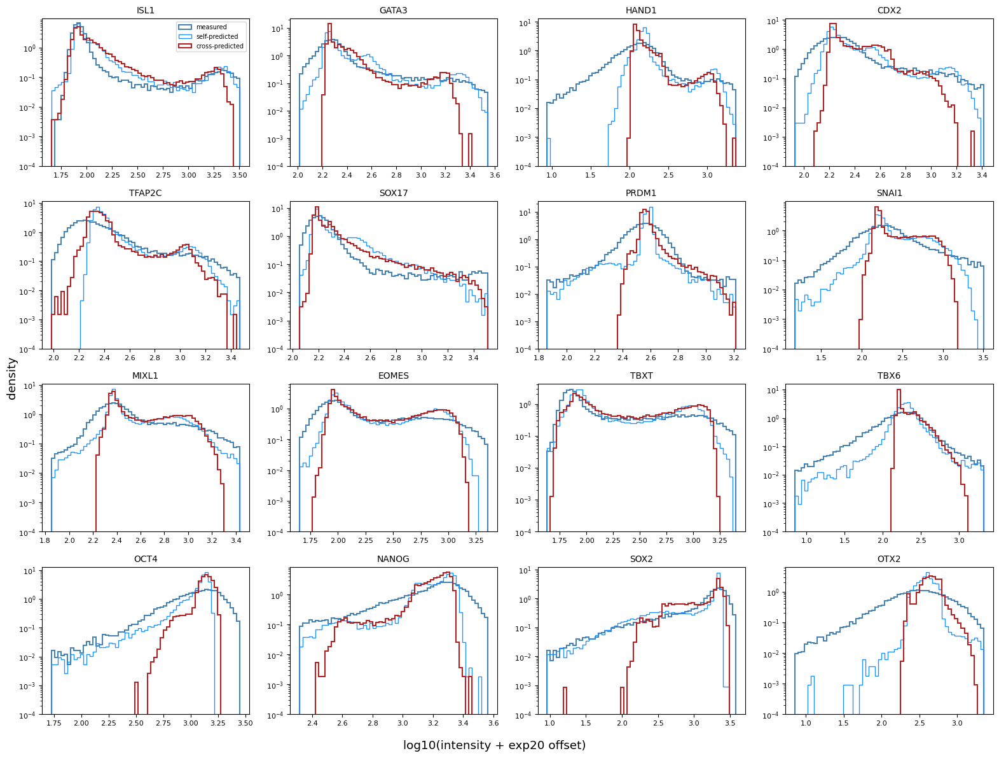

In [191]:
# exp28 markers: measured (aligned) vs self-predicted (aligned) vs cross-predicted, per gene

pred28_self_aligned_avg = IIF.apply_alignment(pred_subs28_self['avg'], align_28_to_20, gene_names)
data28_b50_aligned = data28_aligned_to_20[data28_aligned_to_20['condition'] == 'B50']
pred28_self_aligned_b50 = pred28_self_aligned_avg.loc[data28_b50_aligned.index]
pred_cross_2028_b50 = pred_cross_20to28['avg'].loc[data28_b50_aligned.index]

n_cols = 4
n_rows = int(np.ceil(len(gene_names) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows))
axes = axes.ravel()

for i, marker in enumerate(gene_names):
    ax = axes[i]
    offset = fits[marker]['offset']

    measured_vals = data28_b50_aligned[marker].to_numpy()
    self_vals = pred28_self_aligned_b50[marker].to_numpy()
    cross_vals = pred_cross_2028_b50[marker].to_numpy()

    measured_pos = measured_vals[measured_vals + offset > 0]
    self_pos = self_vals[self_vals + offset > 0]
    cross_pos = cross_vals[cross_vals + offset > 0]

    n_self_dropped = len(self_vals) - len(self_pos)
    n_cross_dropped = len(cross_vals) - len(cross_pos)
    if n_self_dropped or n_cross_dropped:
        print(f'{marker}: dropped {n_self_dropped}/{len(self_vals)} self-predicted, '
              f'{n_cross_dropped}/{len(cross_vals)} cross-predicted (non-positive after offset)')

    log_measured = np.log10(measured_pos + offset)
    log_self = np.log10(self_pos + offset)
    log_cross = np.log10(cross_pos + offset)

    grid_lo, grid_hi = IIF.robust_range(log_measured, log_self, log_cross)
    bins = np.linspace(grid_lo, grid_hi, 60)

    ax.hist(log_measured, bins=bins, density=True, histtype='step', color='steelblue', linewidth=1.5, label='measured')
    ax.hist(log_self, bins=bins, density=True, histtype='step', color='dodgerblue', linewidth=1, label='self-predicted')
    ax.hist(log_cross, bins=bins, density=True, histtype='step', color='firebrick', linewidth=1.5, label='cross-predicted')

    ax.set_yscale('log')
    ax.set_ylim(bottom=1e-4)
    ax.set_title(marker, fontsize=10)
    ax.tick_params(labelsize=8)


for ax in axes[len(gene_names):]:
    ax.axis('off')

axes[0].legend(fontsize=7, loc='upper right')
fig.supxlabel('log10(intensity + exp20 offset)')
fig.supylabel('density')
plt.tight_layout()


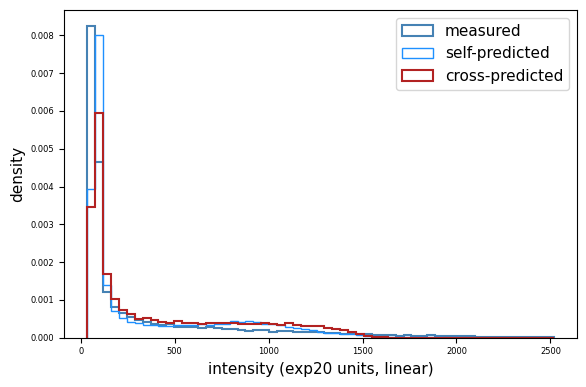

In [192]:
marker = 'TBXT'
offset = fits[marker]['offset']

measured_vals = data28_b50_aligned[marker].to_numpy()
self_vals = pred28_self_aligned_b50[marker].to_numpy()
cross_vals = pred_cross_2028_b50[marker].to_numpy()

lo, hi = IIF.robust_range(measured_vals, self_vals, cross_vals)
bins = np.linspace(lo, hi, 60)

fig, ax = plt.subplots(figsize=(6, 4))
ax.hist(measured_vals, bins=bins, density=True, histtype='step', color='steelblue', linewidth=1.5, label='measured')
ax.hist(self_vals, bins=bins, density=True, histtype='step', color='dodgerblue', linewidth=1, label='self-predicted')
ax.hist(cross_vals, bins=bins, density=True, histtype='step', color='firebrick', linewidth=1.5, label='cross-predicted')
ax.set_xlabel('intensity (exp20 units, linear)')
ax.set_ylabel('density')
ax.legend()
plt.tight_layout()


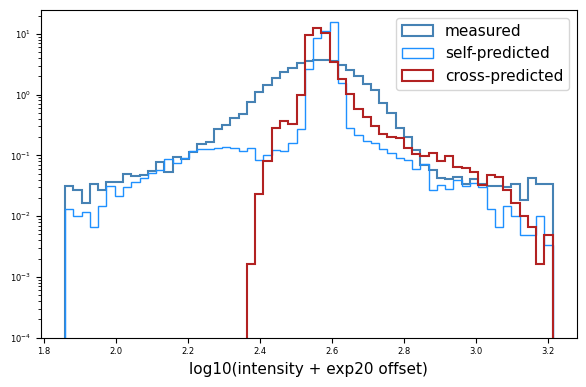

In [198]:
marker = 'PRDM1'
offset = fits[marker]['offset']

measured_vals = data28_b50_aligned[marker].to_numpy()
self_vals = pred28_self_aligned_b50[marker].to_numpy()
cross_vals = pred_cross_2028_b50[marker].to_numpy()

measured_pos = measured_vals[measured_vals + offset > 0]
self_pos = self_vals[self_vals + offset > 0]
cross_pos = cross_vals[cross_vals + offset > 0]

log_measured = np.log10(measured_pos + offset)
log_self = np.log10(self_pos + offset)
log_cross = np.log10(cross_pos + offset)

grid_lo, grid_hi = IIF.robust_range(log_measured, log_self, log_cross)
bins = np.linspace(grid_lo, grid_hi, 60)

fig, ax = plt.subplots(figsize=(6, 4))
ax.hist(log_measured, bins=bins, density=True, histtype='step', color='steelblue', linewidth=1.5, label='measured')
ax.hist(log_self, bins=bins, density=True, histtype='step', color='dodgerblue', linewidth=1, label='self-predicted')
ax.hist(log_cross, bins=bins, density=True, histtype='step', color='firebrick', linewidth=1.5, label='cross-predicted')
ax.set_yscale('log')
ax.set_ylim(bottom=1e-4)
ax.set_xlabel('log10(intensity + exp20 offset)')
ax.legend()
plt.tight_layout()
